In [1]:
#!/usr/bin/py
import sklearn
import logging
import os
import warnings
import numpy as np
import tsfel
from collections import namedtuple
from contextlib import contextmanager
from datetime import datetime
from zipfile import ZipFile, is_zipfile
import matplotlib.pyplot as plt
import pandas as pd
import math
import tsfresh.feature_extraction.feature_calculators as feature
from tsfresh.utilities.distribution import MultiprocessingDistributor
import seaborn as sns
from datetime import date

In [2]:
HEADER_LINE_PREFIX = '% '
HEADER_END_LINE_PREFIX = '%-'
HEADER_KEYS = ['date_time', 'prog_version', 'serial', 'mech_unit', 'axis', 'sampling_period', 'tool', 'rob_ax', 'ext_ax']
DATETIME_FORMAT = '%Y%m%d_%H%M%S'

MIN_SAMPLES = 600
SAMPLING_PERIOD = 0.004032
FREQUENCY = 1/SAMPLING_PERIOD

# Retrieves a pre-defined feature configuration file to extract all available features
cfg = tsfel.get_features_by_domain()



In [3]:
MccRun = namedtuple('MccRun', 'mode series')
MccResult = namedtuple('MccResult', 'status value average distance')
OperationMode = namedtuple('OperationMode', ['axis', 'mech_unit', 'tool', 'rob_ax', 'ext_ax', 'prog_version'])

In [4]:
@contextmanager
def open_zip(file):
    if not is_zipfile(file):
        raise TypeError(f'{file} is not a valid zip file')

    zip_archive = ZipFile(file, 'r')
    files = zip_archive.namelist()
    try:
        extracted = [zip_archive.open(f) for f in files]
        yield extracted
    finally:
        for f in extracted:
            f.close()
        zip_archive.close()

In [5]:
def read_header(file):
    header = {}
    for line in file:
        line = line.decode('utf-8')
        if line.startswith(HEADER_LINE_PREFIX):
    
            parameter, value = (element.strip() for element in line.split(':'))
            if 'Meas time' in parameter:
                header['date_time'] = datetime.strptime(value, DATETIME_FORMAT)
            if 'Program version' in parameter:
                header['prog_version'] = value
            elif 'Robot serial number' in parameter:
                header['serial'] = value
            elif 'Mech unit' in parameter:
                header['mech_unit'] = value
            elif 'Axis' in parameter:
                header['axis'] = int(value)
            elif 'Sample time' in parameter:
                header['sampling_period'] = float(value)
            elif 'Tool' in parameter:
                header['tool'] = value
            elif 'RobAx' in parameter:
                header['rob_ax'] = value
            elif 'ExtAx' in parameter:
                header['ext_ax'] = value
            elif 'Meas type' in parameter:
                continue
            else:
                #logging.debug(f'Parameter {parameter} and value {value} not handled')
                continue

        elif line.startswith(HEADER_END_LINE_PREFIX):
            continue

        else:
            break
#     if not header:
#         logging.warning(f'Empty header in {file.name}')
#         return None
    return header

In [6]:
def read_data(file):
    with warnings.catch_warnings():
        warnings.filterwarnings('error')
        try:
            data = np.loadtxt(file, dtype=np.float64, delimiter='\t')
        except Warning:
            logging.warning(f'{file.name} has no data')
            return None
#         except Exception:
#             logging.error(f'{file.name} is broken')
            return None

    n_samples, n_columns = data.shape

    if n_columns == 3:
        data = _decrypt3(data)
    elif n_columns == 4:
        data = _decrypt3(data[:, 1:]) 
    elif n_columns == 5:
        data = _decrypt4(data[:, 1:])
    else:
        logging.warning(f'Unhandled case with {n_columns} columns in {handle.name}')
        return None
    if n_samples < MIN_SAMPLES:
        logging.warning(f'Case with {n_samples} samples')

    data = data[10:-10]
    return np.asarray(data)
def _decrypt3(data):
    return data * np.matrix([[0.5, 0.5, 0], [-0.5, 0, 0.5], [0, 0.5, -0.5]])


def _decrypt4(data):
    return data * np.matrix([[0.5, 0.5, 0, 0], [-0.5, 0, 0, 0.5], [0, 0, 0.5, -0.5], [0, 0.5, -0.5, 0]])

In [7]:

class MccTimeSeries():
    def __init__(self, series, date_time, sampling_period):
        self.series = series
        self.date_time = date_time
        self.sampling_period = sampling_period
    
    def __getitem__(self, index):
        return self.series[index]

    def __len__(self):
        return len(self.series)

    @property
    def torque_ff(self):
        return self.series[:, 0]

    @property
    def velocity(self):
        return self.series[:, 1]
    
    @property
    def torque(self):
        return self.series[:, 2]

    @property
    def time_index(self):
        return np.arange(0, self.torque.size)[:, np.newaxis] * self.sampling_period

    @property
    def sampling_frequency(self):
        return 1 / self.sampling_period

    def normalized_torque(self):
        return (self.torque - self.torque.min()) / (self.torque.max() - self.torque.min())
    
    def standardized_torque(self):
        return (self.torque - self.torque.mean()) / self.torque.std()
    def mean_torque(self):
        return self.torque.mean()
    
    def find_reference_point(self):
        ref = self.standardized_torque()
        mean_value = self.torque.mean()
        stv = self.torque.std(ddof=0)
        return ref, mean_value, stv
        
    
    

# Get the reference points

# Failure Case 2

In [8]:
axes = ['axis1', 'axis2', 'axis3', 'axis4', 'axis5', 'axis6']

def process_file(file_path):
    ref = {}
    mean = {}
    stv = {}

    with ZipFile(file_path) as File:
        print(File)
        for file in File.namelist():
            with File.open(file) as f:
                header = read_header(f)
                data = read_data(f)
                mode = OperationMode(axis=header['axis'], mech_unit=header['mech_unit'], tool=header['tool'], rob_ax=header['rob_ax'], ext_ax=header['ext_ax'], prog_version=header['prog_version'])
                series = MccTimeSeries(data, header['date_time'], header.get('sampling_period', SAMPLING_PERIOD))                
                for ax in axes:
                    if ax in file:
                        ref[ax], mean[ax], stv[ax] = series.find_reference_point()
                        

        return ref, mean, stv



In [9]:
# Use the standard deviation and the mean of reference points
def standardized_torque(data,ref_mean,ref_stv):
    return (data - ref_mean) / ref_stv

In [10]:
# Caculate the corss-correlation of two consecutive measurements
from scipy import signal
def cross_correlation(ref,d):
    Shift = []
    corr = signal.correlate(ref,d)
#Find the index of the maximum of cross-correlation
    indx = np.argmax(corr, axis=0)
#Offset of the two series
    lags = signal.correlation_lags(len(ref), len(d))
    Shift.append(lags[indx])
    offset = lags[indx]
    min_length = min(d.size,ref.size)-abs(offset)
    d_m, ref_m = shift_signal(offset, min_length, d, ref)
    return d_m, ref_m, offset

In [11]:
def shift_signal(offset, min_length, d, ref):    
    if offset > 0:
        d = d[:min_length] ;
        ref = ref[offset:];
    elif offset < 0:
        d = d[-offset:];
        ref = ref[:min_length]
    return d,ref

In [12]:
def trimmedMean(mcc_torque):   
    mcc_torque = mcc_torque[np.abs(mcc_torque) > 1e-4]
    try:
          return mcc_torque.mean()      
    except:
          return null

In [13]:
def torque_fftFeatures_maxamplitude(mcc_torque):   
    amplitudes = np.fft.fft(mcc_torque)
    realAmplitudes = abs(amplitudes)  # real valued amplitudes
    maxAmplitude = np.max(realAmplitudes)
    return maxAmplitude

In [14]:
def torque_fftFeatures_entropy(mcc_torque):
      try:  
            amplitudes = np.fft.fft(mcc_torque)
            realAmplitudes = abs(amplitudes)  # real valued amplitudes
            N = mcc_torque.shape[0]
            entropy = 0
            for i in realAmplitudes:
                  try:
                        entropy += i * log(i)
                  except:
                        entropy += 0
            entropy = -entropy / np.float(log(N))
            return entropy
      except:
            return 0           


In [15]:
def area_signal(d, ref, ref_mean, dx):
    abs(np.trapz(abs(d), axis = ref_mean, dx=dx) - np.trapz(abs(ref), axis = ref_mean, dx=dx))

In [16]:
def generate_more_feature(Filepath,ref,mean,stv):    
    File_path = Filepath
    ax1,ax2,ax3,ax4,ax5,ax6 = 'axis1','axis2','axis3','axis4','axis5','axis6'
    columns=['axis1','axis2','axis3','axis4','axis5','axis6']
    RMS_Value=pd.DataFrame(columns=columns)
    Skewness_value = pd.DataFrame(columns=columns)
    Kurtosis_value = pd.DataFrame(columns=columns)
    
    Energy = pd.DataFrame(columns=columns)
    Stv = pd.DataFrame(columns=columns)
    Variance = pd.DataFrame(columns=columns)
    Impulse_factor = pd.DataFrame(columns=columns)
    Shape_factor = pd.DataFrame(columns=columns)
    MAX_AMP = pd.DataFrame(columns=columns)
    torque_areaUnderSignal = pd.DataFrame(columns=columns)
    torque_trimmedMean = pd.DataFrame(columns=columns)
    torque_signalNoise = pd.DataFrame(columns=columns)
    MAX_AMP = pd.DataFrame(columns=columns)
    fig, (x1, x2, xf1) = plt.subplots(3)
    fig, (x3, x4, xf2) = plt.subplots(3)
    fig, (x5, x6, xf3) = plt.subplots(3)
    fig, (x7, x8, xf4) = plt.subplots(3)
    fig, (x9, x10, xf5) = plt.subplots(3)
    fig, (x11, x12, xf6) = plt.subplots(3)
    
    i = 0
    for loop_file in os.listdir(File_path):
        route = os.path.join(File_path,loop_file)

        with ZipFile(route) as File:
            for file in File.namelist():
                with File.open(file) as f:
                    header = read_header(f)
                    #Set the index
                    date = header['date_time']
    #                 i = date.date()
                    #Read data
                    data = read_data(f)
                    mode = OperationMode(axis = header['axis'], mech_unit = header['mech_unit'], tool = header['tool'], rob_ax = header['rob_ax'], ext_ax = header['ext_ax'], prog_version = header['prog_version'])    
                    series = MccTimeSeries(data, header['date_time'], header.get('sampling_period', SAMPLING_PERIOD))
                    index = series.time_index
                    if ax1 in file:
                    # Extract features for axis1
                        d1 = standardized_torque(series.torque,mean[ax1], stv[ax1])
                        s1 = series.velocity
                        xf1.plot(s1)
                        
                        #ff_d1 = series.torque_ff
                        #xf1.plot(ff_d1)
                        xf1.set_xlabel('Timestamp')  
                        xf1.set_ylabel('Speed axis1')
                        d_m1, ref_m1,offset1 = cross_correlation(ref[ax1], d1) 
                        corr_1 = np.corrcoef(d_m1, ref_m1)
                        
                        if abs(offset1) > 10 or corr_1[0,1] <0.9:
                            continue
                        else:
                            torque_areaUnderSignal.loc[i, 'time'] = date.date()
                            torque_areaUnderSignal.loc[i, 'axis1'] = abs(np.trapz(abs(d_m1), dx = index[1] - index[0]) - np.trapz(abs(ref_m1), dx = index[1] - index[0]))
                            
                            torque_trimmedMean.loc[i, 'time'] = date.date()
                            torque_trimmedMean.loc[i, 'axis1'] = abs(trimmedMean(d_m1)- trimmedMean(ref_m1))

                            torque_signalNoise.loc[i, 'time'] = date.date()
                            torque_signalNoise.loc[i, 'axis1'] = abs((d_m1-ref_m1).mean()/(d_m1-ref_m1).std(ddof=0))
                            
                            RMS_Value.loc[i, 'time'] = date.date()
                            RMS_Value.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)

                            Skewness_value.loc[i, 'time'] = date.date()
                            Skewness_value.loc[i, 'axis1'] = feature.skewness(d_m1-ref_m1)

                            Kurtosis_value.loc[i, 'time'] = date.date()
                            Kurtosis_value.loc[i, 'axis1'] = feature.kurtosis(d_m1-ref_m1)

                            Energy.loc[i, 'time'] = date.date()
                            Energy.loc[i, 'axis1'] = feature.abs_energy(d_m1-ref_m1)

                            Stv.loc[i, 'time'] = date.date()
                            Stv.loc[i, 'axis1'] = (d_m1-ref_m1).std(ddof=0)

                            Variance.loc[i, 'time'] = date.date()
                            Variance.loc[i, 'axis1'] = (d_m1-ref_m1).var()

                            Impulse_factor.loc[i, 'time'] = date.date()
                            Impulse_factor.loc[i, 'axis1'] = max(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))

                            Shape_factor.loc[i, 'time'] = date.date()
                            Shape_factor.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))
                            
                            MAX_AMP.loc[i, 'time'] = date.date()
                            MAX_AMP.loc[i, 'axis1'] = torque_fftFeatures_maxamplitude(d_m1-ref_m1)
                            
                            

                            x1.plot(d1)
                            x2.plot(d_m1)
                            x1.set_xlabel('Timestamp')  
                            x1.set_ylabel('Torque axis1')
                            x2.set_xlabel('Timestamp')  
                            x2.set_ylabel('Torque axis1')


                    elif ax2 in file:
                    # Extract features for axis2
                        ff_d2 = series.torque_ff
                        xf2.plot(ff_d2)
                        xf2.set_xlabel('Timestamp')  
                        xf2.set_ylabel('FF Torque axis2')

                        d2 = standardized_torque(series.torque,mean[ax2], stv[ax2])
                        d_m2, ref_m2, offset2 = cross_correlation(ref[ax2], d2)
                        corr_2 = np.corrcoef(d_m2, ref_m2)
                        if abs(offset2) > 10 or corr_2[0,1] <0.9:
                            continue
                        else:
                            x3.plot(d2)
                            x4.plot(d_m2)
                            x3.set_xlabel('Timestamp')  
                            x3.set_ylabel('Torque axis2')
                            x4.set_xlabel('Timestamp')  
                            x4.set_ylabel('Torque axis2')
                            torque_areaUnderSignal.loc[i, 'axis2'] = abs(np.trapz(abs(d_m2), dx = index[1] - index[0]) - np.trapz(abs(ref_m2), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis2'] = abs(trimmedMean(d_m2)- trimmedMean(ref_m2))
                            torque_signalNoise.loc[i, 'axis2'] = abs((d_m2-ref_m2).mean()/(d_m2-ref_m2).std(ddof=0))
                            RMS_Value.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)
                            Skewness_value.loc[i, 'axis2'] = feature.skewness(d_m2-ref_m2)
                            Kurtosis_value.loc[i, 'axis2'] = feature.kurtosis(d_m2-ref_m2)
                            Energy.loc[i, 'axis2'] = feature.abs_energy(d_m2-ref_m2)
                            Stv.loc[i, 'axis2'] = (d_m2-ref_m2).std(ddof=0)
                            Variance.loc[i, 'axis2'] = (d_m2-ref_m2).var()
                            Impulse_factor.loc[i, 'axis2'] = max(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                            Shape_factor.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                            MAX_AMP.loc[i, 'axis2'] = torque_fftFeatures_maxamplitude(d_m2-ref_m2)                        
                            
                            
                            
                    elif ax3 in file:
                    # Extract features for axis3
                        ff_d3 = series.torque_ff
                        xf3.plot(ff_d3)
                        xf3.set_xlabel('Timestamp')  
                        xf3.set_ylabel('FF Torque axis3')
                        d3 = standardized_torque(series.torque,mean[ax3], stv[ax3])
                        d_m3, ref_m3,offset3 = cross_correlation(ref[ax3], d3)
                        corr_3 = np.corrcoef(d_m3, ref_m3)
                        
                        if abs(offset3) > 10 or corr_3[0,1] <0.9:
                            continue
                        else:
                            
                            x5.plot(d3)
                            x6.plot(d_m3)
                            x5.set_xlabel('Timestamp')  
                            x5.set_ylabel('Torque axis3')
                            x6.set_xlabel('Timestamp')  
                            x6.set_ylabel('Torque axis3')
                            torque_areaUnderSignal.loc[i, 'axis3'] = abs(np.trapz(abs(d_m3), dx = index[1] - index[0]) - np.trapz(abs(ref_m3), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis3'] = abs(trimmedMean(d_m3)- trimmedMean(ref_m3))
                            torque_signalNoise.loc[i, 'axis3'] = abs((d_m3-ref_m3).mean()/(d_m3-ref_m3).std(ddof=0))
                            RMS_Value.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)
                            Skewness_value.loc[i, 'axis3'] = feature.skewness(d_m3-ref_m3)
                            Kurtosis_value.loc[i, 'axis3'] = feature.kurtosis(d_m3-ref_m3)
                            Stv.loc[i, 'axis3'] = (d_m3-ref_m3).std(ddof=0)
                            Variance.loc[i, 'axis3'] = (d_m3-ref_m3).var()
                            Energy.loc[i, 'axis3'] = feature.abs_energy(d_m3-ref_m3)
                            Impulse_factor.loc[i, 'axis3'] = max(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                            Shape_factor.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                            MAX_AMP.loc[i, 'axis3'] = torque_fftFeatures_maxamplitude(d_m3-ref_m3)                        
                        
                    elif ax4 in file:
                    # Extract features for axis4
                        ff_d4 = series.torque_ff
                        xf4.plot(ff_d4)
                        xf4.set_xlabel('Timestamp')  
                        xf4.set_ylabel('FF Torque axis4')
                        d4 = standardized_torque(series.torque,mean[ax4], stv[ax4])
                        d_m4, ref_m4, offset4 = cross_correlation(ref[ax4], d4)
                        corr_4 = np.corrcoef(d_m4, ref_m4)                      
                        if abs(offset4) > 10 or corr_4[0,1] < 0.9:
                            continue
                        else:
                            x7.plot(d4)

                            x8.plot(d_m4)
                            x7.set_xlabel('Timestamp')  
                            x7.set_ylabel('Torque axis4')
                            x8.set_xlabel('Timestamp')  
                            x8.set_ylabel('Torque axis4')
                            torque_areaUnderSignal.loc[i, 'axis4'] = abs(np.trapz(abs(d_m4), dx = index[1] - index[0]) - np.trapz(abs(ref_m4), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis4'] = abs(trimmedMean(d_m4)- trimmedMean(ref_m4))
                            torque_signalNoise.loc[i, 'axis4'] = abs((d_m4-ref_m4).mean()/(d_m4-ref_m4).std(ddof=0))
                            RMS_Value.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)
                            Skewness_value.loc[i, 'axis4'] = feature.skewness(d_m4-ref_m4)
                            Kurtosis_value.loc[i, 'axis4'] = feature.kurtosis(d_m4-ref_m4)
                            Energy.loc[i, 'axis4'] = feature.abs_energy(d_m4-ref_m4)
                            Stv.loc[i, 'axis4'] = (d_m4-ref_m4).std(ddof=0)
                            Variance.loc[i, 'axis4'] = (d_m4-ref_m4).var()
                            Impulse_factor.loc[i, 'axis4'] = max(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                            Shape_factor.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                            MAX_AMP.loc[i, 'axis4'] = torque_fftFeatures_maxamplitude(d_m4-ref_m4) 
                            
                    elif ax5 in file:
                    # Extract features for axis5
                        ff_d5 = series.torque_ff
                        xf5.plot(ff_d5)
                        xf5.set_xlabel('Timestamp')  
                        xf5.set_ylabel('FF Torque axis5')
                        d5 = standardized_torque(series.torque,mean[ax5], stv[ax5])
                        d_m5, ref_m5,offset5 = cross_correlation(ref[ax5], d5)
                        corr_5 = np.corrcoef(d_m5, ref_m5)
                        if abs(offset5) > 10 or corr_5[0,1] <0.9:
                            continue
                        else:
                            x9.plot(d5)
                            x10.plot(d_m5)
                            x9.set_xlabel('Timestamp')  
                            x9.set_ylabel('Torque axis5')
                            x10.set_xlabel('Timestamp')  
                            x10.set_ylabel('Torque axis5')
                            torque_areaUnderSignal.loc[i, 'axis5'] = abs(np.trapz(abs(d_m5), dx = index[1] - index[0]) - np.trapz(abs(ref_m5), dx = index[1] - index[0]))
                            torque_trimmedMean.loc[i, 'axis5'] = abs(trimmedMean(d_m5)- trimmedMean(ref_m5))
                            torque_signalNoise.loc[i, 'axis5'] = abs((d_m5-ref_m5).mean()/(d_m5-ref_m5).std(ddof=0))
                            RMS_Value.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)
                            Skewness_value.loc[i, 'axis5'] = feature.skewness(d_m5-ref_m5)
                            Kurtosis_value.loc[i, 'axis5'] = feature.kurtosis(d_m5-ref_m5)
                            Energy.loc[i, 'axis5'] = feature.abs_energy(d_m5-ref_m5)
                            Stv.loc[i, 'axis5'] = (d_m5-ref_m5).std(ddof=0)
                            Variance.loc[i, 'axis5'] = (d_m5-ref_m5).var()
                            Impulse_factor.loc[i, 'axis5'] = max(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                            Shape_factor.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                            MAX_AMP.loc[i, 'axis5'] = torque_fftFeatures_maxamplitude(d_m5-ref_m5)         
                            
                    elif ax6 in file:
                    # Extract features for axis6
                        ff_d6 = series.torque_ff
                        xf6.plot(ff_d6)
                        xf6.set_xlabel('Timestamp')  
                        xf6.set_ylabel('FF Torque axis6')
                        d6 = standardized_torque(series.torque,mean[ax6], stv[ax6])
                        d_m6, ref_m6,offset6 = cross_correlation(ref[ax6], d6)
                        corr_6 = np.corrcoef(d_m6, ref_m6)
                        
                        if abs(offset6) > 10 or corr_6[0,1] <0.9:
                            continue
                        else:
                            
                            x11.plot(d6)
                            x12.plot(d_m6)
                            x11.set_xlabel('Timestamp')  
                            x11.set_ylabel('Torque axis6')
                            x12.set_xlabel('Timestamp')  
                            x12.set_ylabel('Torque axis6')
                            torque_areaUnderSignal.loc[i, 'axis6'] = abs(np.trapz(abs(d_m6), dx = index[1] - index[0]) - np.trapz(abs(ref_m6), dx = index[1] - index[0])) 
                            torque_trimmedMean.loc[i, 'axis6'] = abs(trimmedMean(d_m6)- trimmedMean(ref_m6))
                            torque_signalNoise.loc[i, 'axis6'] = abs((d_m6-ref_m6).mean()/(d_m6-ref_m6).std(ddof=0))
                            RMS_Value.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)
                            Skewness_value.loc[i, 'axis6'] = feature.skewness(d_m6-ref_m6)
                            Kurtosis_value.loc[i, 'axis6'] = feature.kurtosis(d_m6-ref_m6)
                            Energy.loc[i, 'axis6'] = feature.abs_energy(d_m6-ref_m6)
                            Stv.loc[i, 'axis6'] = (d_m6-ref_m6).std(ddof=0)
                            Variance.loc[i, 'axis6'] = (d_m6-ref_m6).var()
                            Impulse_factor.loc[i, 'axis6'] = max(d_m6-ref_m6)/feature.mean(d_m6-ref_m6)
                            Shape_factor.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)/abs(feature.mean(d_m6-ref_m6))
                            MAX_AMP.loc[i, 'axis6'] = torque_fftFeatures_maxamplitude(d_m6-ref_m6)                        
                            
        i = i + 1
    return RMS_Value,Stv,Impulse_factor,Shape_factor,torque_areaUnderSignal, torque_trimmedMean, torque_signalNoise, MAX_AMP
               

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC2_7142240_66-51134/1343-0024-56_DIAGDATA_20140822_185018__MCC.zip' mode='r'>


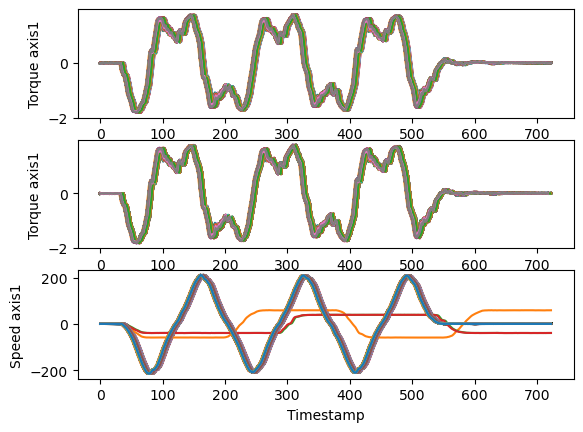

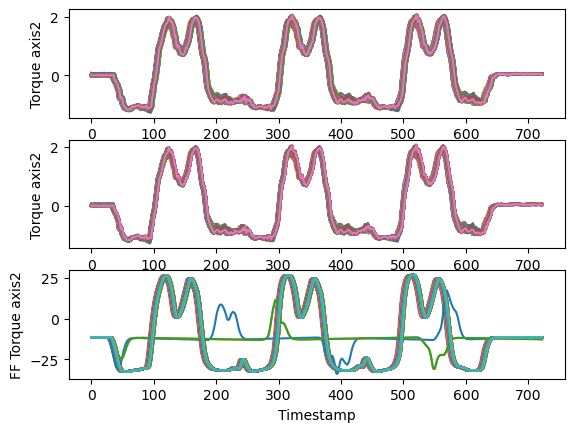

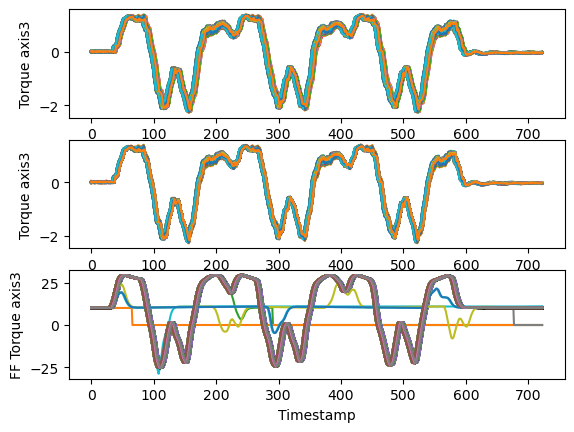

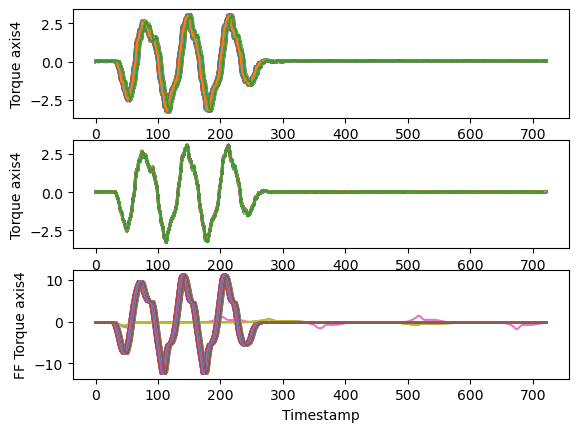

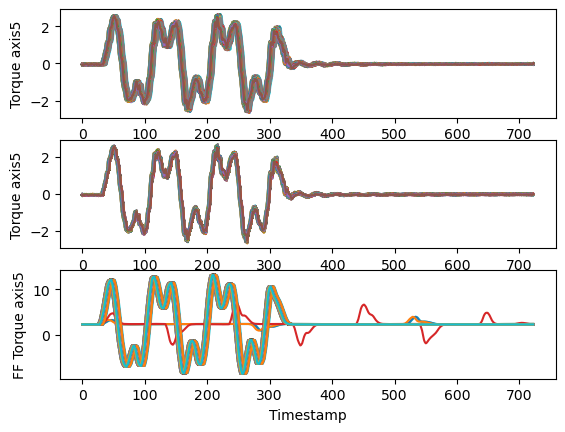

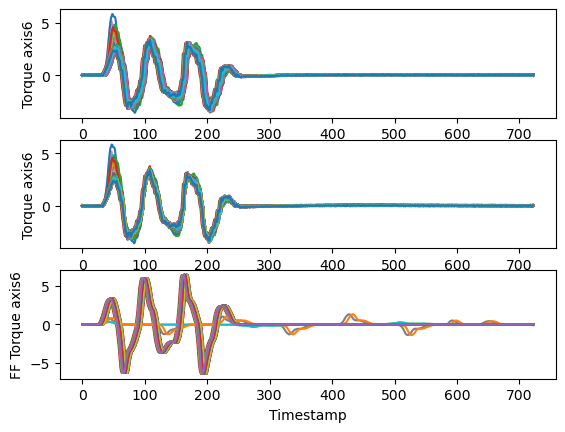

In [17]:
#Failure Case 2
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC2_7142240_66-51134/1343-0024-56_DIAGDATA_20140822_185018__MCC.zip'
ref_FC2, mean_FC2, stv_FC2 = process_file(file_path)

File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC2_7142240_66-51134/MCCFiles'
RMS_Value_FC2,Stv_FC2,Impulse_factor_FC2,Shape_factor_FC2,torque_areaUnderSignal_FC2, torque_trimmedMean_FC2,torque_signalNoise_FC2, MAX_AMP_FC2 = generate_more_feature(File_path,ref_FC2, mean_FC2, stv_FC2)



In [18]:
RMS_Value_FC2 = RMS_Value_FC2.dropna(axis=0,how='any')
Stv_FC2 = Stv_FC2.dropna(axis=0,how='any')
torque_areaUnderSignal_FC2 = torque_areaUnderSignal_FC2.dropna(axis=0,how='any')
torque_trimmedMean_FC2 = torque_trimmedMean_FC2.dropna(axis=0,how='any')
torque_signalNoise_FC2 = torque_signalNoise_FC2.dropna(axis=0,how='any')
MAX_AMP_FC2 = MAX_AMP_FC2.dropna(axis=0,how='any')


In [19]:
RMS_Value_FC2 = RMS_Value_FC2.groupby(by='time').mean()
Stv_FC2 = Stv_FC2.groupby(by='time').mean()
torque_areaUnderSignal_FC2 = torque_areaUnderSignal_FC2.groupby(by='time').mean()
torque_trimmedMean_FC2 = torque_trimmedMean_FC2.groupby(by='time').mean()
torque_signalNoise_FC2 = torque_signalNoise_FC2.groupby(by='time').mean()
MAX_AMP_FC2 = MAX_AMP_FC2.groupby(by='time').mean()

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC10_68363858_04-64139/04-64139_DIAGDATA_20170918_135452_3ece932f-a030-4c95-bd2c-e6d899ed8871_MCC.zip' mode='r'>


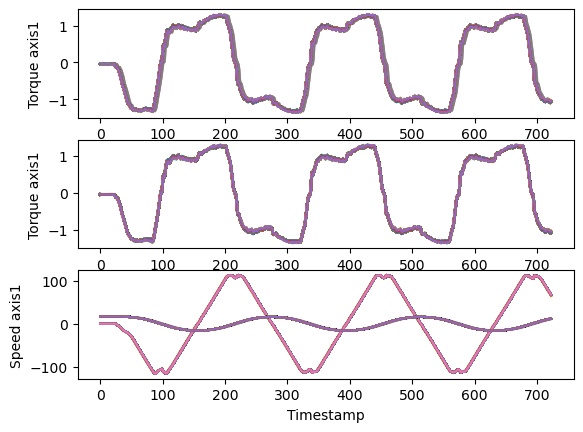

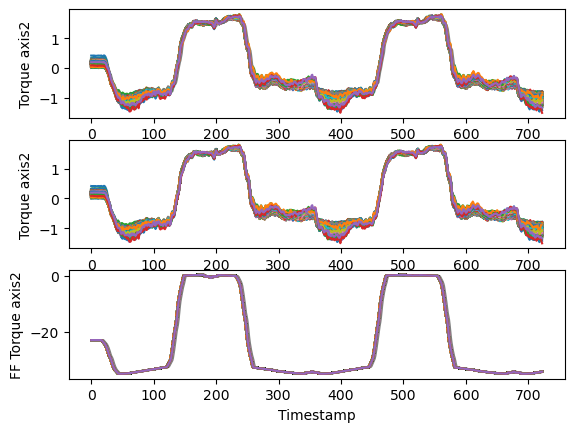

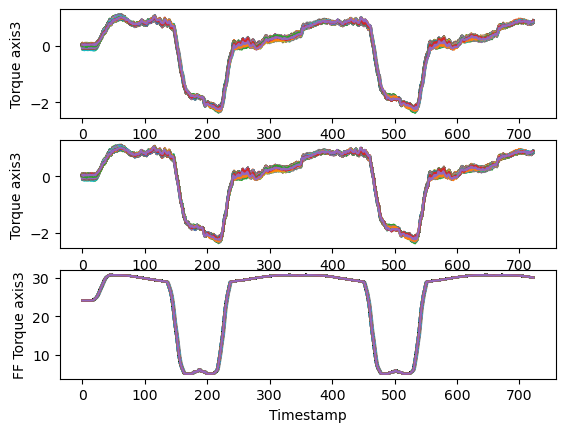

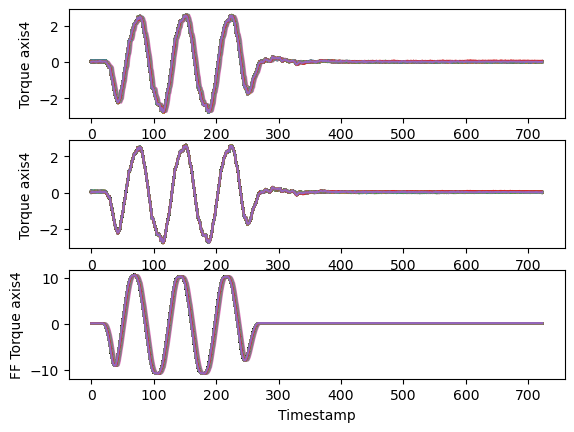

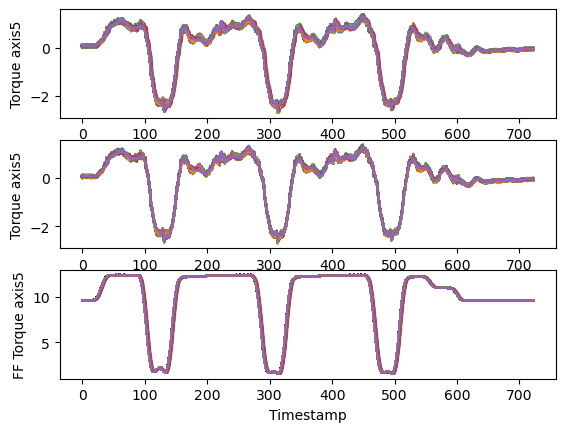

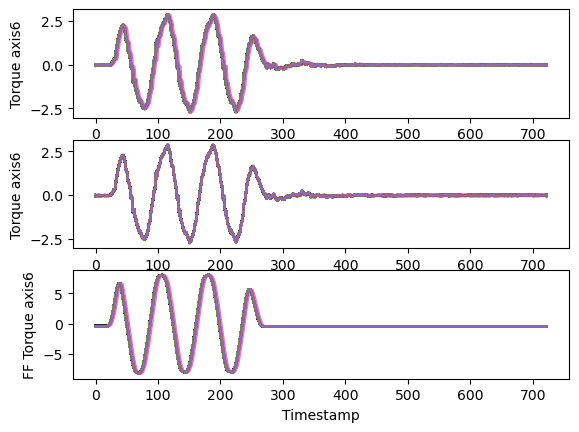

In [20]:
#Failure Case 10
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC10_68363858_04-64139/04-64139_DIAGDATA_20170918_135452_3ece932f-a030-4c95-bd2c-e6d899ed8871_MCC.zip'
ref_FC10, mean_FC10, stv_FC10 = process_file(file_path)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC10_68363858_04-64139/MCC Flies'
RMS_Value_FC10,Stv_FC10,Impulse_factor_FC10,Shape_factor_FC10, torque_areaUnderSignal_FC10, torque_trimmedMean_FC10,torque_signalNoise_FC10, MAX_AMP_FC10  = generate_more_feature(File_path,ref_FC10, mean_FC10, stv_FC10)

In [21]:
RMS_Value_FC10 = RMS_Value_FC10.dropna(axis=0,how='any')
Stv_FC10 = Stv_FC10.dropna(axis=0,how='any')
torque_areaUnderSignal_FC10 = torque_areaUnderSignal_FC10.dropna(axis=0,how='any')
torque_trimmedMean_FC10 = torque_trimmedMean_FC10.dropna(axis=0,how='any')
torque_signalNoise_FC10 = torque_signalNoise_FC10.dropna(axis=0,how='any')
MAX_AMP_FC10 = MAX_AMP_FC10.dropna(axis=0,how='any')


In [22]:
RMS_Value_FC10 = RMS_Value_FC10.groupby(by='time').mean()
Stv_FC10 = Stv_FC10.groupby(by='time').mean()
torque_areaUnderSignal_FC10 = torque_areaUnderSignal_FC10.groupby(by='time').mean()
torque_trimmedMean_FC10 = torque_trimmedMean_FC10.groupby(by='time').mean()
torque_signalNoise_FC10 = torque_signalNoise_FC10.groupby(by='time').mean()
MAX_AMP_FC10 = MAX_AMP_FC10.groupby(by='time').mean()

In [23]:
def generate_feature_refresh_reference(Filepath,ref,mean,stv, refresh_date):    
    File_path = Filepath
    ax1,ax2,ax3,ax4,ax5,ax6 = 'axis1','axis2','axis3','axis4','axis5','axis6'
    columns=['axis1','axis2','axis3','axis4','axis5','axis6']
    RMS_Value=pd.DataFrame(columns=columns)
    Skewness_value = pd.DataFrame(columns=columns)
    Kurtosis_value = pd.DataFrame(columns=columns)
    
    Energy = pd.DataFrame(columns=columns)
    Stv = pd.DataFrame(columns=columns)
    Variance = pd.DataFrame(columns=columns)
    Impulse_factor = pd.DataFrame(columns=columns)
    Shape_factor = pd.DataFrame(columns=columns)
    MAX_AMP = pd.DataFrame(columns=columns)
    torque_areaUnderSignal = pd.DataFrame(columns=columns)
    torque_trimmedMean = pd.DataFrame(columns=columns)
    torque_signalNoise = pd.DataFrame(columns=columns)
    MAX_AMP = pd.DataFrame(columns=columns)
    NTEST = 0
    OFFSET2 = []
    CORR2 = []
    fig, x1 = plt.subplots()
    i = 0
    for loop_file in os.listdir(File_path):
        route = os.path.join(File_path,loop_file)

        with ZipFile(route) as File:
            for file in File.namelist():
                with File.open(file) as f:
                    header = read_header(f)
                    #Set the index
                    date = header['date_time']
                    DATE = date.date()
                    #Read data
                    data = read_data(f)
                    mode = OperationMode(axis = header['axis'], mech_unit = header['mech_unit'], tool = header['tool'], rob_ax = header['rob_ax'], ext_ax = header['ext_ax'], prog_version = header['prog_version'])    
                    series = MccTimeSeries(data, header['date_time'], header.get('sampling_period', SAMPLING_PERIOD))
                    index = series.time_index
                    if DATE == refresh_date:
                        ref, mean, stv = process_file(route)
                        NTEST = i
                        break


                    else:
                        if ax1 in file:
                        # Extract features for axis1
                            d1 = standardized_torque(series.torque,mean[ax1], stv[ax1])
                            d_m1, ref_m1,offset1 = cross_correlation(ref[ax1], d1) 
#                             OFFSET1.append(offset1)
                            corr_1 = np.corrcoef(d_m1, ref_m1)

                            if abs(offset1) > 10 or corr_1[0,1] <0.99:
                                continue
                            else:

                                torque_areaUnderSignal.loc[i, 'time'] = date.date()
                                torque_areaUnderSignal.loc[i, 'axis1'] = abs(np.trapz(abs(d_m1), dx = index[1] - index[0]) - np.trapz(abs(ref_m1), dx = index[1] - index[0]))

                                torque_trimmedMean.loc[i, 'time'] = date.date()
                                torque_trimmedMean.loc[i, 'axis1'] = abs(trimmedMean(d_m1)- trimmedMean(ref_m1))

                                torque_signalNoise.loc[i, 'time'] = date.date()
                                torque_signalNoise.loc[i, 'axis1'] = abs((d_m1-ref_m1).mean()/(d_m1-ref_m1).std(ddof=0))

                                RMS_Value.loc[i, 'time'] = date.date()
                                RMS_Value.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)

                                Skewness_value.loc[i, 'time'] = date.date()
                                Skewness_value.loc[i, 'axis1'] = feature.skewness(d_m1-ref_m1)

                                Kurtosis_value.loc[i, 'time'] = date.date()
                                Kurtosis_value.loc[i, 'axis1'] = feature.kurtosis(d_m1-ref_m1)

                                Energy.loc[i, 'time'] = date.date()
                                Energy.loc[i, 'axis1'] = feature.abs_energy(d_m1-ref_m1)

                                Stv.loc[i, 'time'] = date.date()
                                Stv.loc[i, 'axis1'] = (d_m1-ref_m1).std(ddof=0)

                                Variance.loc[i, 'time'] = date.date()
                                Variance.loc[i, 'axis1'] = (d_m1-ref_m1).var()

                                Impulse_factor.loc[i, 'time'] = date.date()
                                Impulse_factor.loc[i, 'axis1'] = max(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))

                                Shape_factor.loc[i, 'time'] = date.date()
                                Shape_factor.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))

                                MAX_AMP.loc[i, 'time'] = date.date()
                                MAX_AMP.loc[i, 'axis1'] = torque_fftFeatures_maxamplitude(d_m1-ref_m1)


                        elif ax2 in file:
                        # Extract features for axis2

                            d2 = standardized_torque(series.torque,mean[ax2], stv[ax2])
                            d_m2, ref_m2, offset2 = cross_correlation(ref[ax2], d2)
                            OFFSET2.append(offset2)
                            corr_2 = np.corrcoef(d_m2, ref_m2)
                            
                            if abs(offset2) > 10 or corr_2[0,1] <0.99:
                                continue
                            else:
    
                                torque_areaUnderSignal.loc[i, 'axis2'] = abs(np.trapz(abs(d_m2), axis = -1, dx = index[1] - index[0]) - np.trapz(abs(ref_m2), axis = -1, dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis2'] = abs(trimmedMean(d_m2)- trimmedMean(ref_m2))
                                torque_signalNoise.loc[i, 'axis2'] = abs((d_m2-ref_m2).mean()/(d_m2-ref_m2).std(ddof=0))
                                RMS_Value.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)
                                Skewness_value.loc[i, 'axis2'] = feature.skewness(d_m2-ref_m2)
                                Kurtosis_value.loc[i, 'axis2'] = feature.kurtosis(d_m2-ref_m2)
                                Energy.loc[i, 'axis2'] = feature.abs_energy(d_m2-ref_m2)
                                Stv.loc[i, 'axis2'] = (d_m2-ref_m2).std(ddof=0)
                                Variance.loc[i, 'axis2'] = (d_m2-ref_m2).var()
                                Impulse_factor.loc[i, 'axis2'] = max(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                                Shape_factor.loc[i, 'axis2'] = feature.root_mean_square(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
                                MAX_AMP.loc[i, 'axis2'] = torque_fftFeatures_maxamplitude(d_m2-ref_m2)
                                if i >200 and i < 210:
                                    x1.plot(ref_m2, 'b')
                                    x1.plot(d_m2, 'g')
                                    x1.set_xlabel('Timestamp')  
                                    x1.set_ylabel('Torque axis4')
                                


                        elif ax3 in file:
                        # Extract features for axis3
                            d3 = standardized_torque(series.torque,mean[ax3], stv[ax3])
                            d_m3, ref_m3,offset3 = cross_correlation(ref[ax3], d3)
                            corr_3 = np.corrcoef(d_m3, ref_m3)

                            if abs(offset3) > 10 or corr_3[0,1] <0.99:
                                continue
                            else:
                                torque_areaUnderSignal.loc[i, 'axis3'] = abs(np.trapz(abs(d_m3), dx = index[1] - index[0]) - np.trapz(abs(ref_m3), dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis3'] = abs(trimmedMean(d_m3)- trimmedMean(ref_m3))
                                torque_signalNoise.loc[i, 'axis3'] = abs((d_m3-ref_m3).mean()/(d_m3-ref_m3).std(ddof=0))
                                RMS_Value.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)
                                Skewness_value.loc[i, 'axis3'] = feature.skewness(d_m3-ref_m3)
                                Kurtosis_value.loc[i, 'axis3'] = feature.kurtosis(d_m3-ref_m3)
                                Stv.loc[i, 'axis3'] = (d_m3-ref_m3).std(ddof=0)
                                Variance.loc[i, 'axis3'] = (d_m3-ref_m3).var()
                                Energy.loc[i, 'axis3'] = feature.abs_energy(d_m3-ref_m3)
                                Impulse_factor.loc[i, 'axis3'] = max(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                                Shape_factor.loc[i, 'axis3'] = feature.root_mean_square(d_m3-ref_m3)/abs(feature.mean(d_m3-ref_m3))
                                MAX_AMP.loc[i, 'axis3'] = torque_fftFeatures_maxamplitude(d_m3-ref_m3)                        

                        elif ax4 in file:
                        # Extract features for axis4
                            d4 = standardized_torque(series.torque,mean[ax4], stv[ax4])
                            d_m4, ref_m4, offset4 = cross_correlation(ref[ax4], d4)
                            corr_4 = np.corrcoef(d_m4, ref_m4)
                            if abs(offset4) > 10 or corr_4[0,1] < 0.99:
                                continue
                            else:
                                torque_areaUnderSignal.loc[i, 'axis4'] = abs(np.trapz(abs(d_m4), dx = index[1] - index[0]) - np.trapz(abs(ref_m4), dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis4'] = abs(trimmedMean(d_m4)- trimmedMean(ref_m4))
                                torque_signalNoise.loc[i, 'axis4'] = abs((d_m4-ref_m4).mean()/(d_m4-ref_m4).std(ddof=0))
                                RMS_Value.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)
                                Skewness_value.loc[i, 'axis4'] = feature.skewness(d_m4-ref_m4)
                                Kurtosis_value.loc[i, 'axis4'] = feature.kurtosis(d_m4-ref_m4)
                                Energy.loc[i, 'axis4'] = feature.abs_energy(d_m4-ref_m4)
                                Stv.loc[i, 'axis4'] = (d_m4-ref_m4).std(ddof=0)
                                Variance.loc[i, 'axis4'] = (d_m4-ref_m4).var()
                                Impulse_factor.loc[i, 'axis4'] = max(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                                Shape_factor.loc[i, 'axis4'] = feature.root_mean_square(d_m4-ref_m4)/abs(feature.mean(d_m4-ref_m4))
                                MAX_AMP.loc[i, 'axis4'] = torque_fftFeatures_maxamplitude(d_m4-ref_m4) 

                        elif ax5 in file:
                        # Extract features for axis5
                            d5 = standardized_torque(series.torque,mean[ax5], stv[ax5])
                            d_m5, ref_m5,offset5 = cross_correlation(ref[ax5], d5)
                            corr_5 = np.corrcoef(d_m5, ref_m5)
                            CORR2.append(corr_5)
                            if abs(offset5) > 10 or corr_5[0,1] <0.99:
                                continue
                            else:
                                torque_areaUnderSignal.loc[i, 'axis5'] = abs(np.trapz(abs(d_m5), dx = index[1] - index[0]) - np.trapz(abs(ref_m5), dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis5'] = abs(trimmedMean(d_m5)- trimmedMean(ref_m5))
                                torque_signalNoise.loc[i, 'axis5'] = abs((d_m5-ref_m5).mean()/(d_m5-ref_m5).std(ddof=0))
                                RMS_Value.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)
                                Skewness_value.loc[i, 'axis5'] = feature.skewness(d_m5-ref_m5)
                                Kurtosis_value.loc[i, 'axis5'] = feature.kurtosis(d_m5-ref_m5)
                                Energy.loc[i, 'axis5'] = feature.abs_energy(d_m5-ref_m5)
                                Stv.loc[i, 'axis5'] = (d_m5-ref_m5).std(ddof=0)
                                Variance.loc[i, 'axis5'] = (d_m5-ref_m5).var()
                                Impulse_factor.loc[i, 'axis5'] = max(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                                Shape_factor.loc[i, 'axis5'] = feature.root_mean_square(d_m5-ref_m5)/abs(feature.mean(d_m5-ref_m5))
                                MAX_AMP.loc[i, 'axis5'] = torque_fftFeatures_maxamplitude(d_m5-ref_m5)         

                        elif ax6 in file:
                        # Extract features for axis6
                            d6 = standardized_torque(series.torque,mean[ax6], stv[ax6])
                            d_m6, ref_m6,offset6 = cross_correlation(ref[ax6], d6)
                            corr_6 = np.corrcoef(d_m6, ref_m6)

                            if abs(offset6) > 10 or corr_6[0,1] <0.99:
                                continue
                            else:
                                torque_areaUnderSignal.loc[i, 'axis6'] = abs(np.trapz(abs(d_m6), dx = index[1] - index[0]) - np.trapz(abs(ref_m6), dx = index[1] - index[0]))
                                torque_trimmedMean.loc[i, 'axis6'] = abs(trimmedMean(d_m6)- trimmedMean(ref_m6))
                                torque_signalNoise.loc[i, 'axis6'] = abs((d_m6-ref_m6).mean()/(d_m6-ref_m6).std(ddof=0))
                                RMS_Value.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)
                                Skewness_value.loc[i, 'axis6'] = feature.skewness(d_m6-ref_m6)
                                Kurtosis_value.loc[i, 'axis6'] = feature.kurtosis(d_m6-ref_m6)
                                Energy.loc[i, 'axis6'] = feature.abs_energy(d_m6-ref_m6)
                                Stv.loc[i, 'axis6'] = (d_m6-ref_m6).std(ddof=0)
                                Variance.loc[i, 'axis6'] = (d_m6-ref_m6).var()
                                Impulse_factor.loc[i, 'axis6'] = max(d_m6-ref_m6)/feature.mean(d_m6-ref_m6)
                                Shape_factor.loc[i, 'axis6'] = feature.root_mean_square(d_m6-ref_m6)/abs(feature.mean(d_m6-ref_m6))
                                MAX_AMP.loc[i, 'axis6'] = torque_fftFeatures_maxamplitude(d_m6-ref_m6)                        
                            
        i = i + 1
    return RMS_Value,Stv,Impulse_factor,Shape_factor,torque_areaUnderSignal, torque_trimmedMean, torque_signalNoise, MAX_AMP, NTEST, CORR2
               

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC1_113727087_6700-101962/1426-0051-56_DIAGDATA_20151016_090000__MCC.zip' mode='r'>
<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC1_113727087_6700-101962/MCCFiles\\1426-0051-56_DIAGDATA_20151224_070044__MCC.zip' mode='r'>


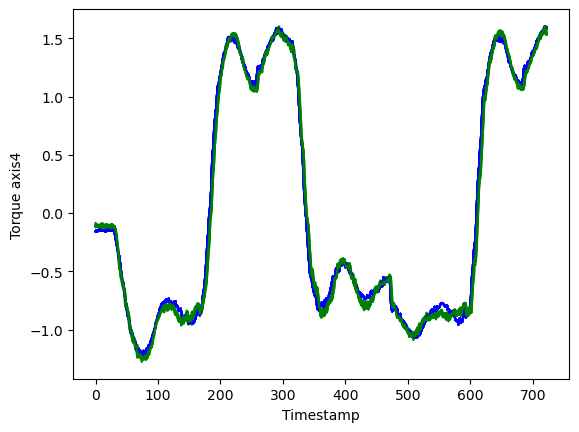

In [24]:
date_FC1 = date(2015, 12, 24)
#Failure Case 1

file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC1_113727087_6700-101962/1426-0051-56_DIAGDATA_20151016_090000__MCC.zip'
ref_FC1, mean_FC1, stv_FC1 = process_file(file_path)

File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC1_113727087_6700-101962/MCCFiles'
RMS_Value_FC1,Stv_FC1,Impulse_factor_FC1,Shape_factor_FC1,torque_areaUnderSignal_FC1, torque_trimmedMean_FC1,torque_signalNoise_FC1, MAX_AMP_FC1, drop_F1, CORR1 = generate_feature_refresh_reference(File_path,ref_FC1, mean_FC1, stv_FC1, date_FC1)

In [25]:
RMS_Value_FC1 = RMS_Value_FC1.dropna(axis=0,how='any')
Stv_FC1 = Stv_FC1.dropna(axis=0,how='any')
torque_areaUnderSignal_FC1 = torque_areaUnderSignal_FC1.dropna(axis=0,how='any')
torque_trimmedMean_FC1 = torque_trimmedMean_FC1.dropna(axis=0,how='any')
torque_signalNoise_FC1 = torque_signalNoise_FC1.dropna(axis=0,how='any')
MAX_AMP_FC1 = MAX_AMP_FC1.dropna(axis=0,how='any')



In [26]:
RMS_Value_FC1 = RMS_Value_FC1.groupby(by='time').mean()
Stv_FC1 = Stv_FC1.groupby(by='time').mean()
torque_areaUnderSignal_FC1 = torque_areaUnderSignal_FC1.groupby(by='time').mean()
torque_trimmedMean_FC1 = torque_trimmedMean_FC1.groupby(by='time').mean()
torque_signalNoise_FC1 = torque_signalNoise_FC1.groupby(by='time').mean()
MAX_AMP_FC1 = MAX_AMP_FC1.groupby(by='time').mean()

<AxesSubplot:xlabel='time'>

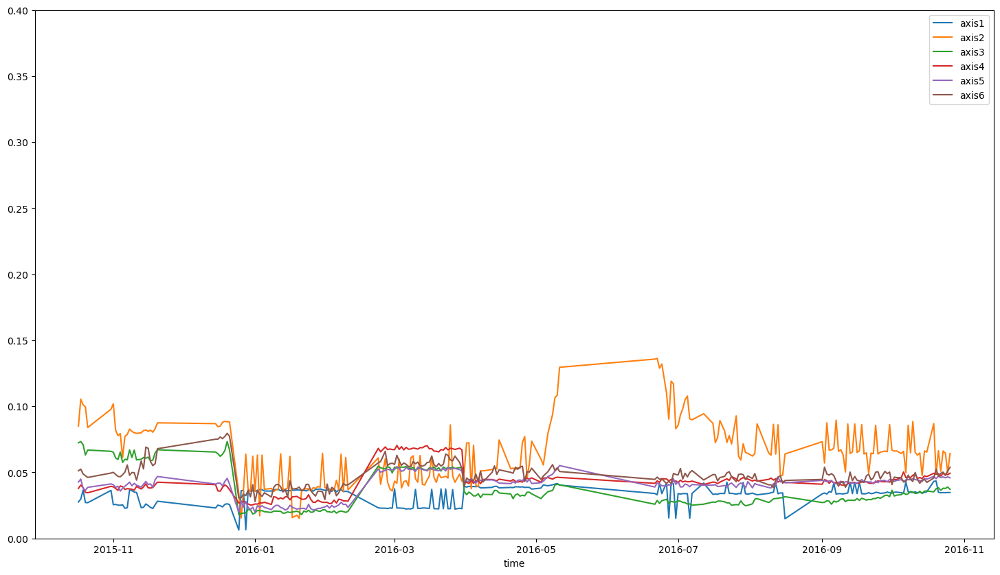

In [27]:


RMS_Value_FC1.plot(figsize=(18,10), ylim =(0,0.4))

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/1218-0079-56_DIAGDATA_20150410_142226__MCC.zip' mode='r'>
<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/MCCFiles\\1218-0079-56_DIAGDATA_20150821_082242__MCC.zip' mode='r'>


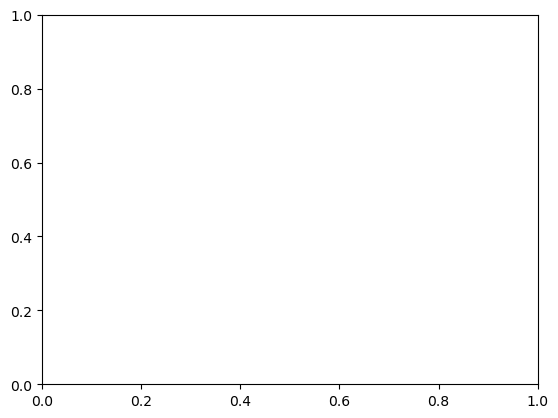

In [28]:
#Failure Case 6
date_FC6 = date(2015, 8, 21)
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/1218-0079-56_DIAGDATA_20150410_142226__MCC.zip'
ref_FC6, mean_FC6, stv_FC6 = process_file(file_path)

File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/MCCFiles'
RMS_Value_FC6,Stv_FC6,Impulse_factor_FC6,Shape_factor_FC6,torque_areaUnderSignal_FC6, torque_trimmedMean_FC6,torque_signalNoise_FC6, MAX_AMP_FC6, drop_FC6, CORR6 = generate_feature_refresh_reference(File_path,ref_FC6, mean_FC6, stv_FC6, date_FC6)

In [29]:
CORR6[50:]

[array([[1.        , 0.99434304],
        [0.99434304, 1.        ]]),
 array([[1.        , 0.99505025],
        [0.99505025, 1.        ]]),
 array([[1.        , 0.99523854],
        [0.99523854, 1.        ]]),
 array([[1.        , 0.99118401],
        [0.99118401, 1.        ]]),
 array([[1.       , 0.9779173],
        [0.9779173, 1.       ]]),
 array([[1.        , 0.99582809],
        [0.99582809, 1.        ]]),
 array([[1.       , 0.9970016],
        [0.9970016, 1.       ]]),
 array([[1.        , 0.99607836],
        [0.99607836, 1.        ]]),
 array([[1.       , 0.9956359],
        [0.9956359, 1.       ]]),
 array([[1.        , 0.99597142],
        [0.99597142, 1.        ]]),
 array([[1.        , 0.99626837],
        [0.99626837, 1.        ]]),
 array([[1.        , 0.99544948],
        [0.99544948, 1.        ]]),
 array([[1.        , 0.99528185],
        [0.99528185, 1.        ]]),
 array([[1.        , 0.99551176],
        [0.99551176, 1.        ]]),
 array([[1.        , 0.99535457]

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/1218-0079-56_DIAGDATA_20150410_142226__MCC.zip' mode='r'>


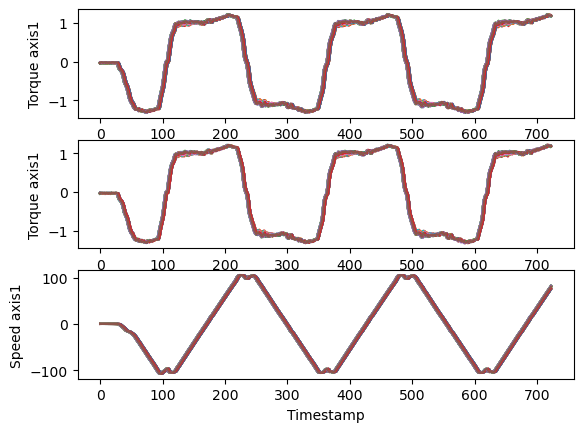

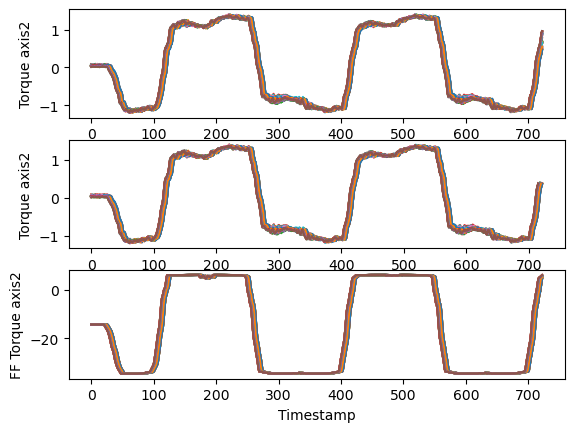

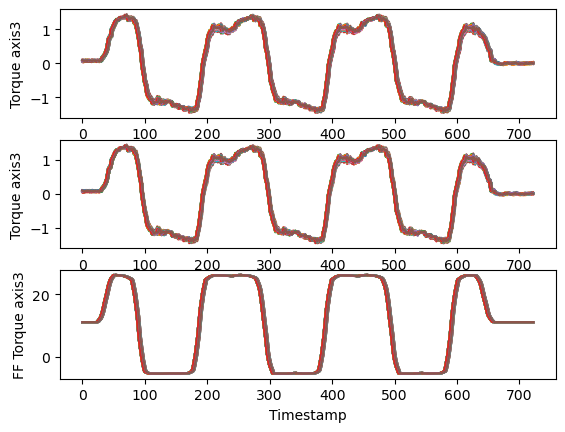

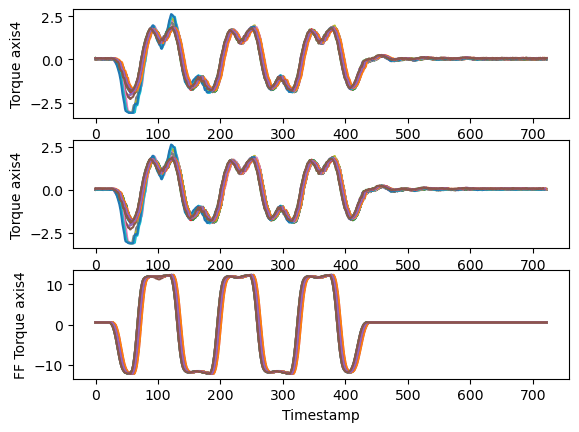

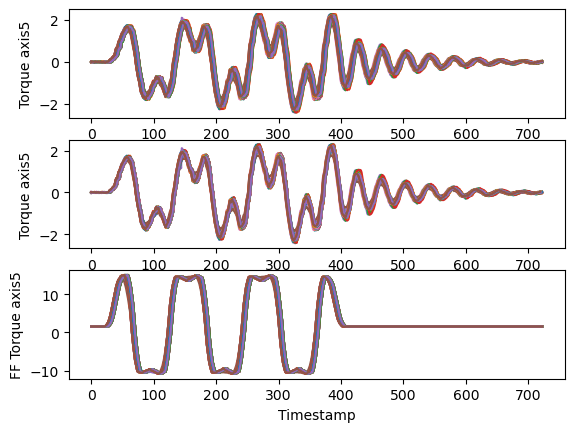

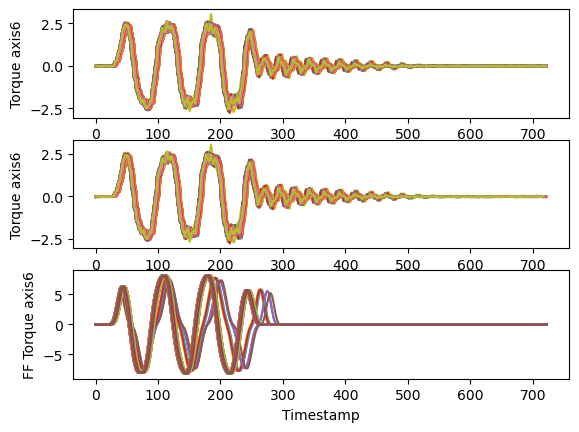

In [30]:
#Failure Case 6
date_FC6 = date(2015, 9, 4)
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/1218-0079-56_DIAGDATA_20150410_142226__MCC.zip'
ref_FC6, mean_FC6, stv_FC6 = process_file(file_path)

File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC6_33016615_66-62028/MCCFiles'
RMS_Value_FC6,Stv_FC6,Impulse_factor_FC6,Shape_factor_FC6,torque_areaUnderSignal_FC6, torque_trimmedMean_FC6,torque_signalNoise_FC6, MAX_AMP_FC6 = generate_more_feature(File_path,ref_FC6, mean_FC6, stv_FC6)

In [31]:
RMS_Value_FC6 = RMS_Value_FC6.dropna(axis=0,how='any')
Stv_FC6 = Stv_FC6.dropna(axis=0,how='any')
torque_areaUnderSignal_FC6 = torque_areaUnderSignal_FC6.dropna(axis=0,how='any')
torque_trimmedMean_FC6 = torque_trimmedMean_FC6.dropna(axis=0,how='any')
torque_signalNoise_FC6 = torque_signalNoise_FC6.dropna(axis=0,how='any')
MAX_AMP_FC6 = MAX_AMP_FC6.dropna(axis=0,how='any')

In [32]:
RMS_Value_FC6 = RMS_Value_FC6.groupby(by='time').mean()
Stv_FC6 = Stv_FC6.groupby(by='time').mean()
torque_areaUnderSignal_FC6 = torque_areaUnderSignal_FC6.groupby(by='time').mean()
torque_trimmedMean_FC6 = torque_trimmedMean_FC6.groupby(by='time').mean()
torque_signalNoise_FC6 = torque_signalNoise_FC6.groupby(by='time').mean()
MAX_AMP_FC6 = MAX_AMP_FC6.groupby(by='time').mean()

<AxesSubplot:xlabel='time'>

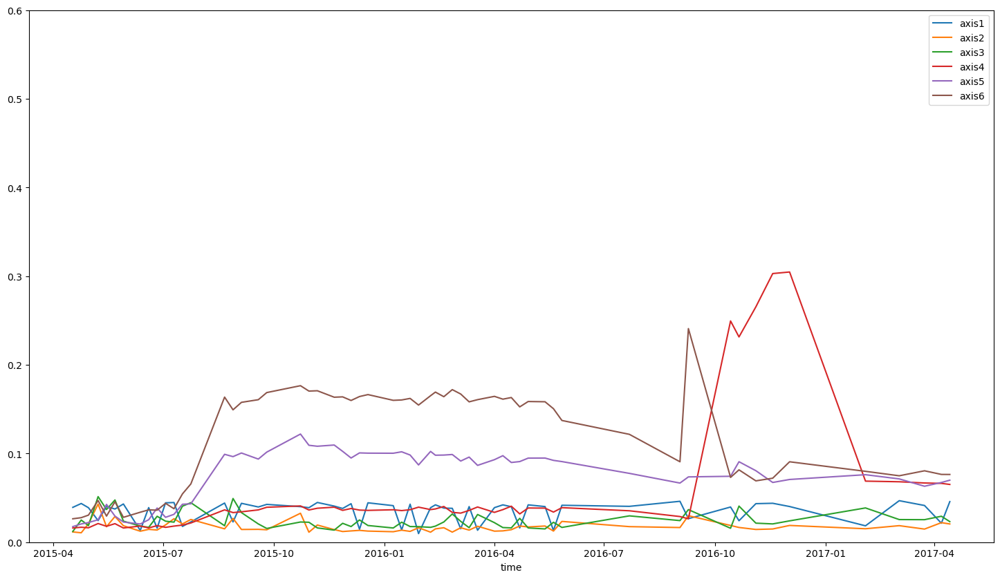

In [33]:
RMS_Value_FC6.plot(figsize=(18,10), ylim = (0,0.6))

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip' mode='r'>


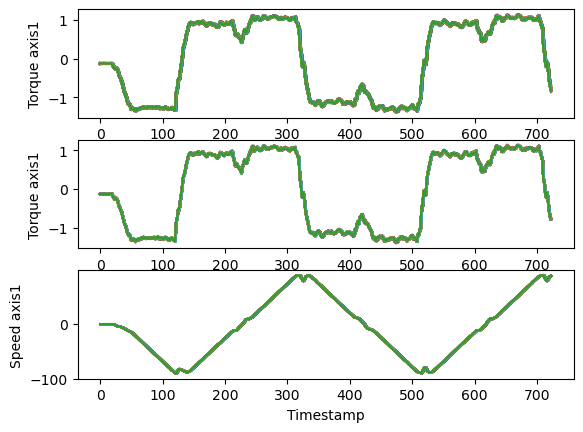

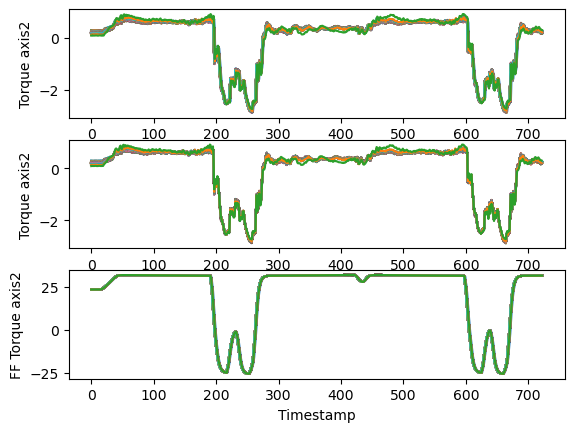

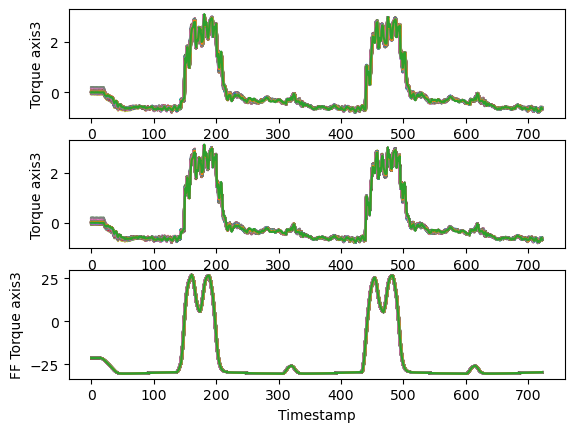

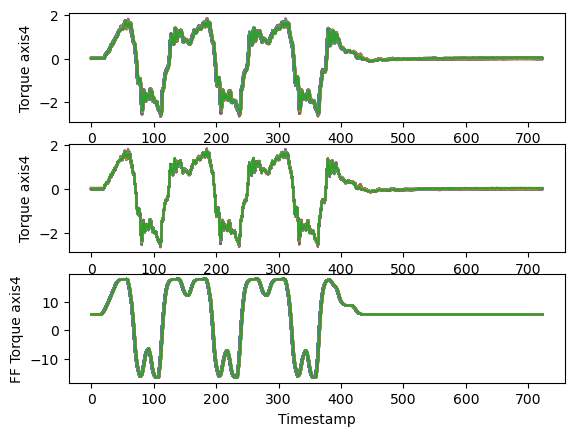

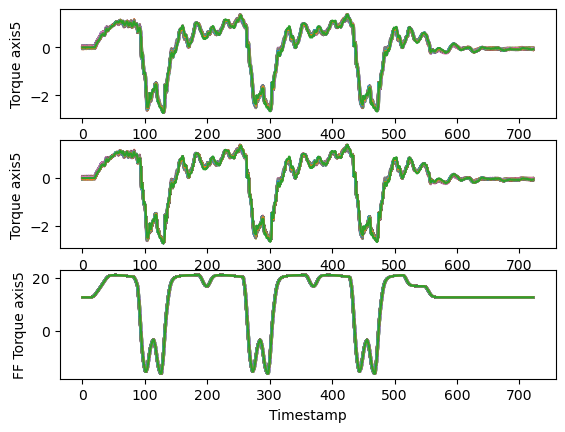

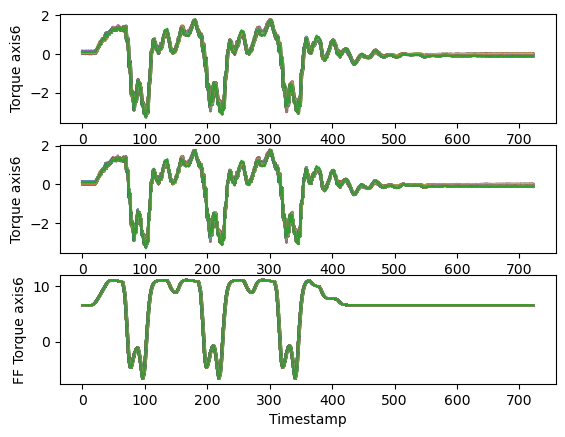

In [34]:
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip'
ref_FC7, mean_FC7, stv_FC7 = process_file(file_path)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/MCCFiles'
RMS_Value_FC7,Stv_FC7,Impulse_factor_FC7,Shape_factor_FC7, torque_areaUnderSignal_FC7, torque_trimmedMean_FC7,torque_signalNoise_FC7, MAX_AMP_FC7 = generate_more_feature(File_path,ref_FC7, mean_FC7, stv_FC7)

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip' mode='r'>
<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/MCCFiles\\7600-102993_DIAGDATA_20160703_050008__MCC.zip' mode='r'>


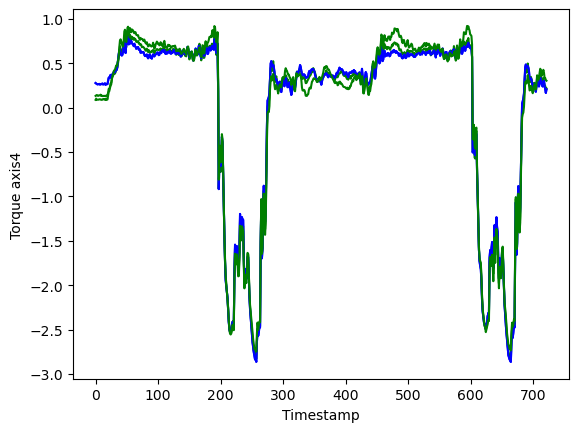

In [35]:
date_FC7 = date(2016, 7, 3)
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip'
ref_FC7, mean_FC7, stv_FC7 = process_file(file_path)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC7_130270916_7600-102993/MCCFiles'
RMS_Value_FC7,Stv_FC7,Impulse_factor_FC7,Shape_factor_FC7, torque_areaUnderSignal_FC7, torque_trimmedMean_FC7,torque_signalNoise_FC7, MAX_AMP_FC7, drop_FC7, CORR7 = generate_feature_refresh_reference(File_path,ref_FC7, mean_FC7, stv_FC7, date_FC7)

In [36]:
RMS_Value_FC7 = RMS_Value_FC7.dropna(axis=0,how='any')
Stv_FC7 = Stv_FC7.dropna(axis=0,how='any')
torque_areaUnderSignal_FC7 = torque_areaUnderSignal_FC7.dropna(axis=0,how='any')
torque_trimmedMean_FC7 = torque_trimmedMean_FC7.dropna(axis=0,how='any')
torque_signalNoise_FC7 = torque_signalNoise_FC7.dropna(axis=0,how='any')
MAX_AMP_FC7 = MAX_AMP_FC7.dropna(axis=0,how='any')

In [37]:
RMS_Value_FC7 = RMS_Value_FC7.groupby(by='time').mean()
Stv_FC7 = Stv_FC7.groupby(by='time').mean()
torque_areaUnderSignal_FC7 = torque_areaUnderSignal_FC7.groupby(by='time').mean()
torque_trimmedMean_FC7 = torque_trimmedMean_FC7.groupby(by='time').mean()
torque_signalNoise_FC7 = torque_signalNoise_FC7.groupby(by='time').mean()
MAX_AMP_FC7 = MAX_AMP_FC7.groupby(by='time').mean()


<AxesSubplot:xlabel='time'>

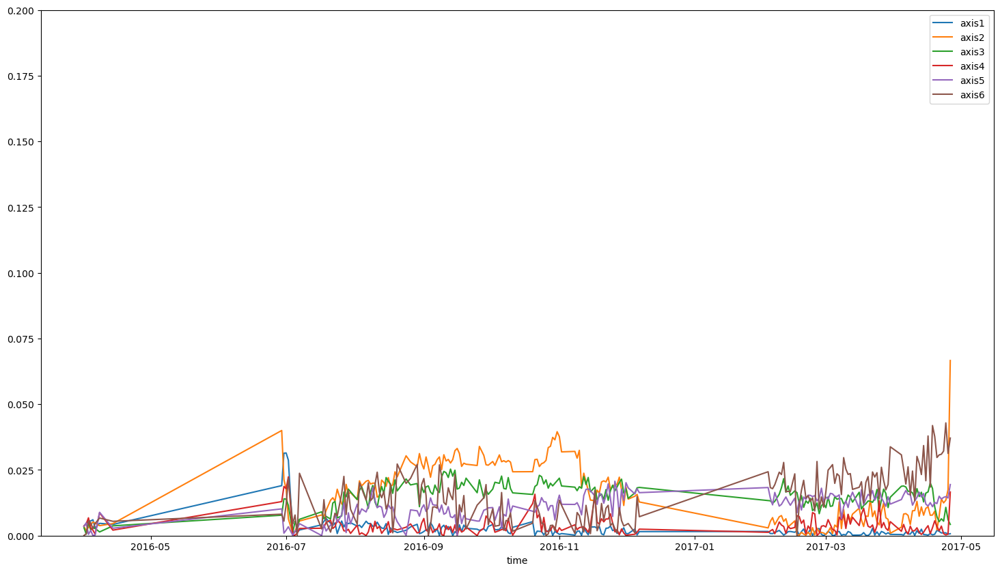

In [38]:
torque_areaUnderSignal_FC7.plot(figsize=(18,10), ylim =(0,0.2))

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC8_103507723_6700-100888/1237-0041-56_DIAGDATA_20141107_131229_1a2edf8e-8453-4210-8f9d-4bbc65e75273_MCC.zip' mode='r'>


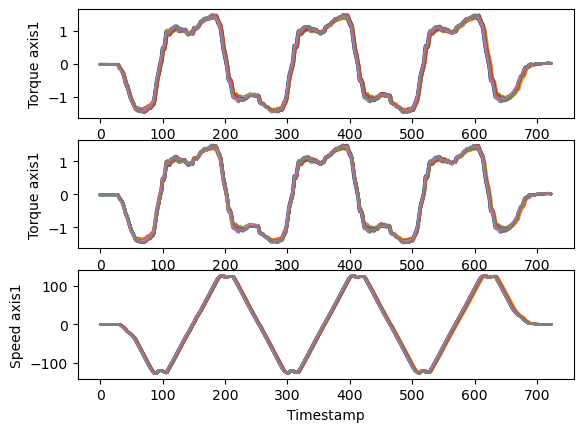

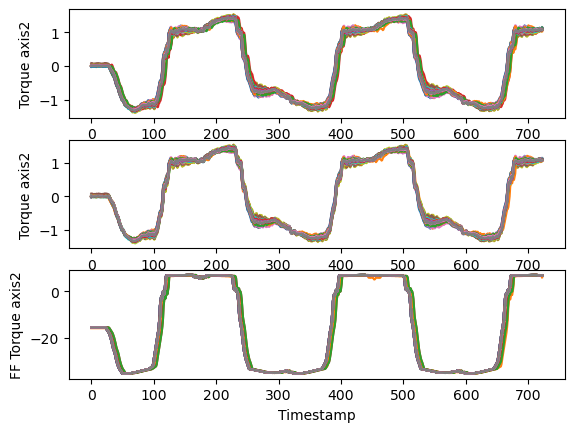

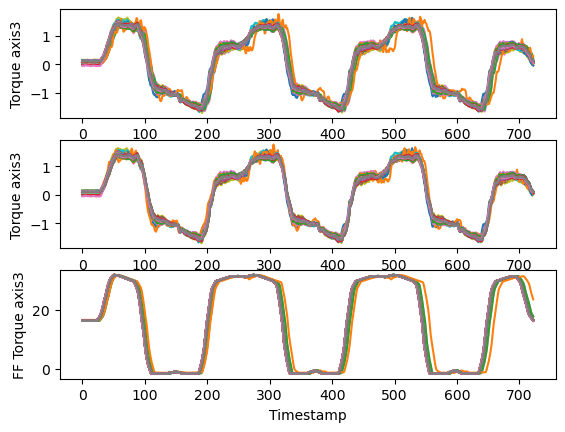

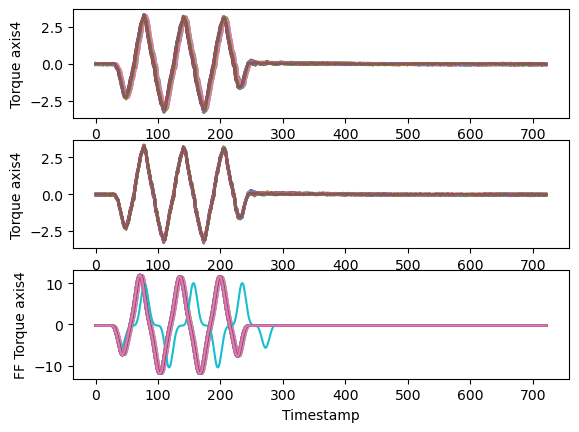

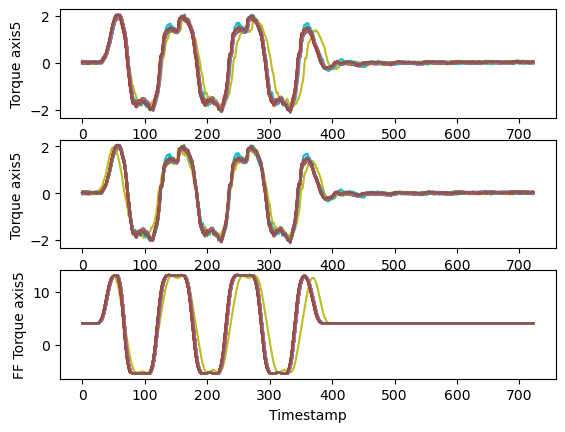

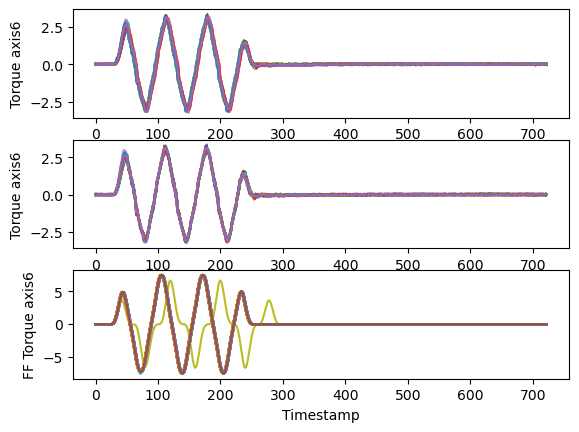

In [39]:
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC8_103507723_6700-100888/1237-0041-56_DIAGDATA_20141107_131229_1a2edf8e-8453-4210-8f9d-4bbc65e75273_MCC.zip'
ref_FC8, mean_FC8, stv_FC8 = process_file(file_path)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC8_103507723_6700-100888/MCCFiles'
RMS_Value_FC8,Stv_FC8,Impulse_factor_FC8,Shape_factor_FC8, torque_areaUnderSignal_FC8, torque_trimmedMean_FC8,torque_signalNoise_FC8, MAX_AMP_FC8 = generate_more_feature(File_path,ref_FC8, mean_FC8, stv_FC8)

In [40]:
RMS_Value_FC8 = RMS_Value_FC8.dropna(axis=0,how='any')
Stv_FC8 = Stv_FC8.dropna(axis=0,how='any')
torque_areaUnderSignal_FC8 = torque_areaUnderSignal_FC8.dropna(axis=0,how='any')
torque_trimmedMean_FC8 = torque_trimmedMean_FC8.dropna(axis=0,how='any')
torque_signalNoise_FC8 = torque_signalNoise_FC8.dropna(axis=0,how='any')
MAX_AMP_FC8 = MAX_AMP_FC8.dropna(axis=0,how='any')


In [41]:
RMS_Value_FC8 = RMS_Value_FC8.groupby(by='time').mean()
Stv_FC8 = Stv_FC8.groupby(by='time').mean()
torque_areaUnderSignal_FC8 = torque_areaUnderSignal_FC8.groupby(by='time').mean()
torque_trimmedMean_FC8 = torque_trimmedMean_FC8.groupby(by='time').mean()
torque_signalNoise_FC8 = torque_signalNoise_FC8.groupby(by='time').mean()
MAX_AMP_FC8 = MAX_AMP_FC8.groupby(by='time').mean()


<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC11_117360760_6640-108111/6640-108111_DIAGDATA_20160223_083249_3f0c9af8-e4b6-44de-ba75-53e13801feb1_MCC.zip' mode='r'>


C:\Temp\ipykernel_7300\2878520252.py:64: RuntimeWarning: invalid value encountered in double_scalars
  torque_signalNoise.loc[i, 'axis1'] = abs((d_m1-ref_m1).mean()/(d_m1-ref_m1).std(ddof=0))
C:\Temp\ipykernel_7300\2878520252.py:85: RuntimeWarning: invalid value encountered in double_scalars
  Impulse_factor.loc[i, 'axis1'] = max(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))
C:\Temp\ipykernel_7300\2878520252.py:88: RuntimeWarning: invalid value encountered in double_scalars
  Shape_factor.loc[i, 'axis1'] = feature.root_mean_square(d_m1-ref_m1)/abs(feature.mean(d_m1-ref_m1))
C:\Temp\ipykernel_7300\2878520252.py:108: RuntimeWarning: invalid value encountered in double_scalars
  torque_signalNoise.loc[i, 'axis2'] = abs((d_m2-ref_m2).mean()/(d_m2-ref_m2).std(ddof=0))
C:\Temp\ipykernel_7300\2878520252.py:115: RuntimeWarning: invalid value encountered in double_scalars
  Impulse_factor.loc[i, 'axis2'] = max(d_m2-ref_m2)/abs(feature.mean(d_m2-ref_m2))
C:\Temp\ipykernel_7300\2878520252.py:116: R

<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC11_117360760_6640-108111/MCCFiles\\6640-108111_DIAGDATA_20160421_122657_cd22981e-36e8-4a9e-bdf6-326f1d56949c_MCC.zip' mode='r'>


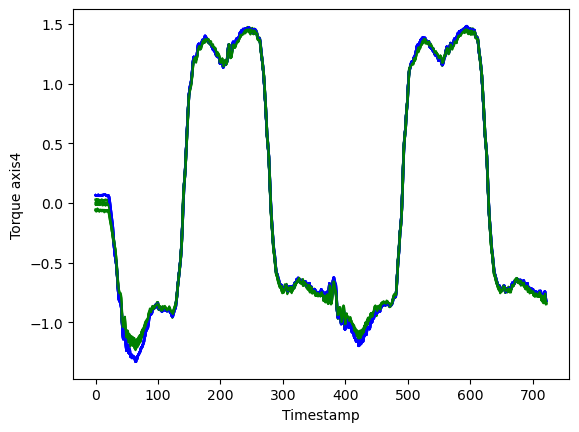

In [42]:
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC11_117360760_6640-108111/6640-108111_DIAGDATA_20160223_083249_3f0c9af8-e4b6-44de-ba75-53e13801feb1_MCC.zip'
ref_FC11, mean_FC11, stv_FC11 = process_file(file_path)
date_FC11 = date(2016, 4, 18)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC11_117360760_6640-108111/MCCFiles'
RMS_Value_FC11,Stv_FC11,Impulse_factor_FC11,Shape_factor_FC11, torque_areaUnderSignal_FC11, torque_trimmedMean_FC11,torque_signalNoise_FC11, MAX_AMP_FC11,drop_FC11,CORR11 = generate_feature_refresh_reference(File_path,ref_FC11, mean_FC11, stv_FC11, date_FC11)

In [43]:
drop_FC11

15

In [44]:
RMS_Value_FC11 = RMS_Value_FC11.dropna(axis=0,how='any')
Stv_FC11 = Stv_FC11.dropna(axis=0,how='any')
torque_areaUnderSignal_FC11 = torque_areaUnderSignal_FC11.dropna(axis=0,how='any')
torque_trimmedMean_FC11 = torque_trimmedMean_FC11.dropna(axis=0,how='any')
torque_signalNoise_FC11 = torque_signalNoise_FC11.dropna(axis=0,how='any')
MAX_AMP_FC11 = MAX_AMP_FC11.dropna(axis=0,how='any')

In [45]:
RMS_Value_FC11 = RMS_Value_FC11.groupby(by='time').mean()
Stv_FC11 = Stv_FC11.groupby(by='time').mean()
torque_areaUnderSignal_FC11 = torque_areaUnderSignal_FC11.groupby(by='time').mean()
torque_trimmedMean_FC11 = torque_trimmedMean_FC11.groupby(by='time').mean()
torque_signalNoise_FC11 = torque_signalNoise_FC11.groupby(by='time').mean()
MAX_AMP_FC11 = MAX_AMP_FC11.groupby(by='time').mean()

<AxesSubplot:xlabel='time'>

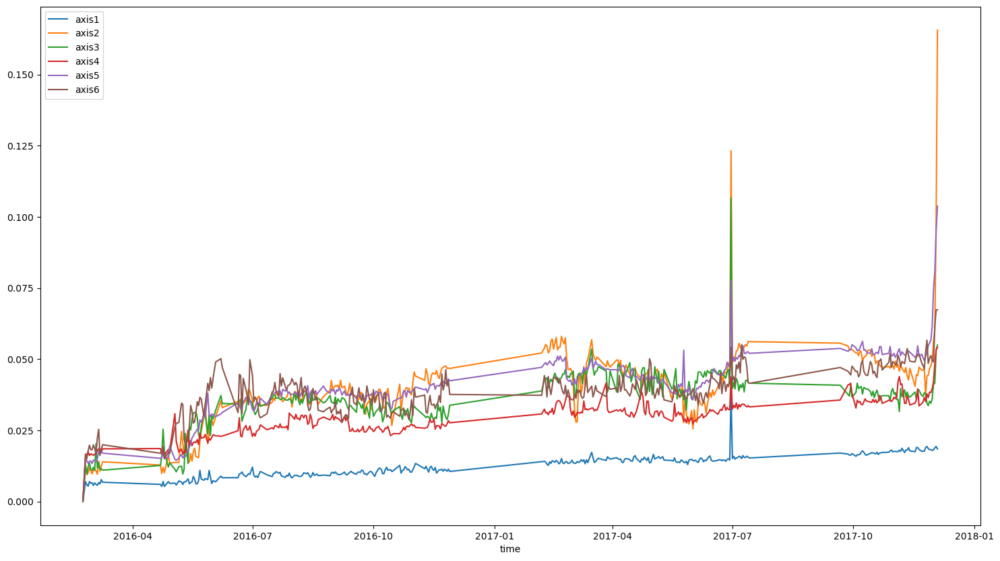

In [46]:
RMS_Value_FC11.plot(figsize=(18,10))

<AxesSubplot:xlabel='time'>

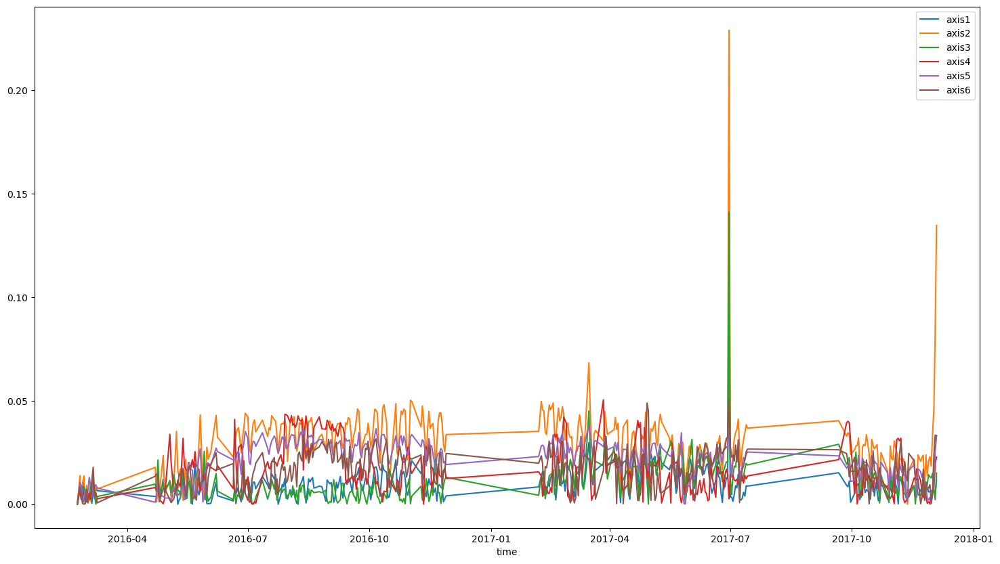

In [47]:
torque_areaUnderSignal_FC11.plot(figsize=(18,10))

In [48]:
torque_areaUnderSignal_FC11[330:]

,axis1,axis2,axis3,axis4,axis5,axis6
time,,,,,,
2017-10-17,0.011014,0.028477,0.012638,0.006156,0.020272,0.025777
2017-10-18,0.003974,0.026771,0.015080,0.012700,0.020937,0.016597
2017-10-19,0.010256,0.027837,0.014793,0.012852,0.019841,0.015374
2017-10-20,0.006571,0.028822,0.011361,0.012774,0.019483,0.007702
2017-10-21,0.001720,0.019237,0.010105,0.007262,0.013686,0.015010
2017-10-22,0.002262,0.007875,0.000634,0.012061,0.007210,0.017649
2017-10-23,0.009104,0.024950,0.014151,0.011633,0.020310,0.010937
2017-10-28,0.008809,0.016007,0.003763,0.007436,0.015141,0.002420
2017-10-29,0.002034,0.003588,0.000797,0.007558,0.006789,0.004034


<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip' mode='r'>
<zipfile.ZipFile filename='C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/MCCFiles\\7600-102993_DIAGDATA_20170519_142207_9c2f7b9c-67bd-4d35-8000-6e872e1b666f_MCC.zip' mode='r'>


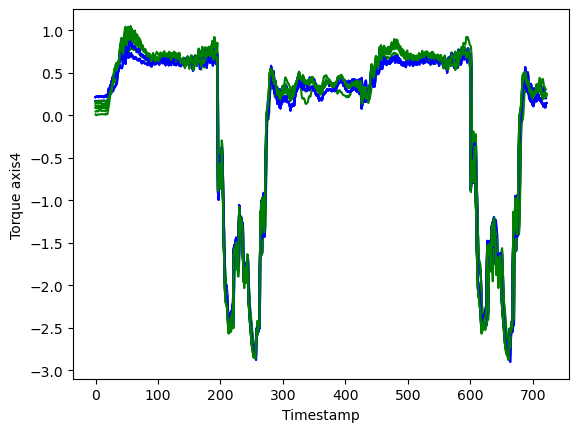

In [49]:
file_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/7600-102993_DIAGDATA_20160331_050019__MCC.zip'
ref_FC12, mean_FC12, stv_FC12 = process_file(file_path)
date_FC12 = date(2017, 5, 19)
File_path = 'C:/Users/semihua/Desktop/Mingjie/test data/FC12_130270916_7600-102993/MCCFiles'
RMS_Value_FC12,Stv_FC12,Impulse_factor_FC12,Shape_factor_FC12, torque_areaUnderSignal_FC12, torque_trimmedMean_FC12,torque_signalNoise_FC12, MAX_AMP_FC12,drop_FC12, CORR2 = generate_feature_refresh_reference(File_path,ref_FC12, mean_FC12, stv_FC12,date_FC12)

In [50]:
RMS_Value_FC12 = RMS_Value_FC12.dropna(axis=0,how='any')
Stv_FC12 = Stv_FC12.dropna(axis=0,how='any')
torque_areaUnderSignal_FC12 = torque_areaUnderSignal_FC12.dropna(axis=0,how='any')
torque_trimmedMean_FC12 = torque_trimmedMean_FC12.dropna(axis=0,how='any')
torque_signalNoise_FC12 = torque_signalNoise_FC12.dropna(axis=0,how='any')
MAX_AMP_FC12 = MAX_AMP_FC12.dropna(axis=0,how='any')

In [51]:
RMS_Value_FC12 = RMS_Value_FC12.groupby(by='time').mean()
Stv_FC12 = Stv_FC12.groupby(by='time').mean()
torque_areaUnderSignal_FC12 = torque_areaUnderSignal_FC12.groupby(by='time').mean()
torque_trimmedMean_FC12 = torque_trimmedMean_FC12.groupby(by='time').mean()
torque_signalNoise_FC12 = torque_signalNoise_FC12.groupby(by='time').mean()
MAX_AMP_FC12 = MAX_AMP_FC12.groupby(by='time').mean()

In [52]:
line_FC10 = [date(2019, 4, 18),date(2019, 6, 5)]
line_FC2 = [date(2015, 3, 20),date(2015, 4, 3)]
line_FC1 = [date(2016, 5, 6),date(2016, 6, 15)]
line_FC6 = [date(2016, 10, 1),date(2017, 2, 4)]
line_FC7 = [date(2017, 4, 20),date(2017, 4, 26)]
line_FC8 = [date(2016, 10, 19),date(2017, 1, 23)]
line_FC11 = [date(2017, 11, 26),date(2017, 12, 6)]
line_FC12 = [[date(2017, 12, 17),date(2017, 12, 22)],
            [date(2017,4,22), date(2017,4,27)]]
Failure_period = [line_FC10, line_FC2, line_FC1, line_FC6, line_FC7, line_FC8,line_FC11, line_FC12]

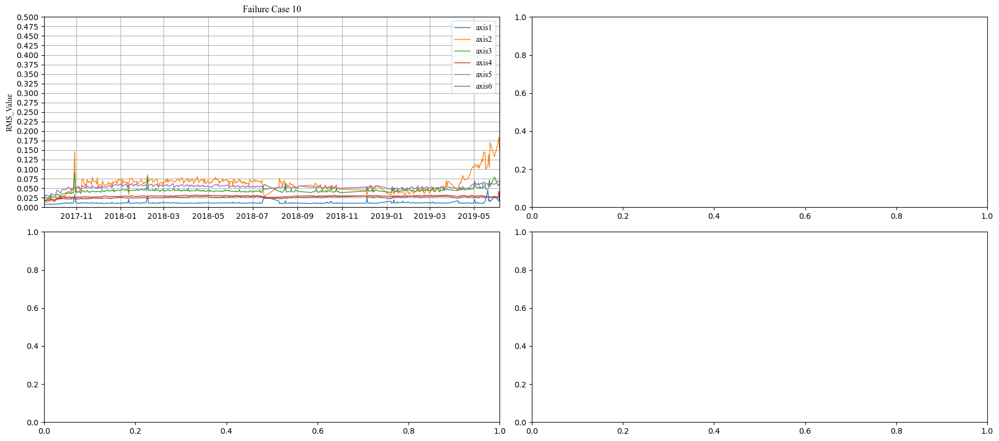

In [289]:
import matplotlib.font_manager as font_manager
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,8))
csfont = {'fontname':'Times New Roman'}
font = font_manager.FontProperties(family='Times New Roman',
                                   weight='normal',
                                   style='normal', size=10)


data = {
    '10': RMS_Value_FC10,
#     'FC2 failure axis6': RMS_Value_FC2,
#     'FC1 failure axis2': RMS_Value_FC1,
#     'FC6 failure axis4': RMS_Value_FC6,
#     'FC7 failure axis2': RMS_Value_FC7,
#     'FC8 failure axis3': RMS_Value_FC8,
#     'FC11 failure axis2': RMS_Value_FC11,
#     'FC12 failure axis5': RMS_Value_FC12
}

for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        ax.plot(d.index, d[index], label=index, linewidth=1)
        ax.set_title(f'Failure Case {fc}',**csfont)
        
        ax.set_ylabel('RMS_Value',**csfont)
        ax.set_ylim(0, .5)
        ax.set_xlim(date(2017, 9, 18),date(2019, 6, 5))
        ax.set_yticks(np.linspace(0,0.5,21))
        ax.legend()
        ax.grid(True)
#     if isinstance(Failure_period[i][0], list):
#         for x in Failure_period[i]:
#             ax.axvspan(x[0], x[1], alpha=0.2, color='red')
#     else:
#         ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
#     ax.scatter(x = d.index, y =np.full(shape=len(d.index), fill_value=0.3),s=0.5, color='r', label= 'Existed Data Point' )
    
    ax.legend(prop=font)




plt.tight_layout()



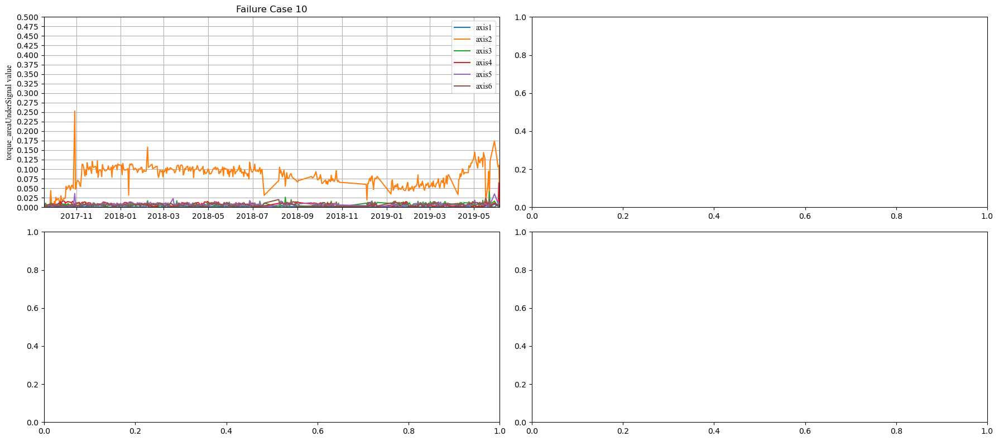

In [295]:
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,8))

data = {
    '10': torque_areaUnderSignal_FC10,
#     'FC2 failure axis6': torque_areaUnderSignal_FC2,
#     'FC1 failure axis2': torque_areaUnderSignal_FC1,
#     'FC6 failure axis4': torque_areaUnderSignal_FC6,
#     'FC7 failure axis2': torque_areaUnderSignal_FC7,
#     'FC8 failure axis3': torque_areaUnderSignal_FC8,
#     'FC11 failure axis2': torque_areaUnderSignal_FC11,
#     'FC12 failure axis5': torque_areaUnderSignal_FC12
}

for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        
        ax.set_ylabel('torque_areaUnderSignal value',**csfont)
        ax.set_ylim(0, .5)
        ax.set_xlim(date(2017, 9, 18),date(2019, 6, 5))
        ax.set_yticks(np.linspace(0,0.5,21))
        
        ax.grid(True)
#     if isinstance(Failure_period[i][0], list):
#         for x in Failure_period[i]:
#             ax.axvspan(x[0], x[1], alpha=0.2, color='red')
#     else:
#         ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
#     ax.scatter(x = d.index, y =np.full(shape=len(d.index), fill_value=0.25),s=0.1, color='r', label= 'Existed Data Point' )
    ax.legend(prop=font)


plt.tight_layout()


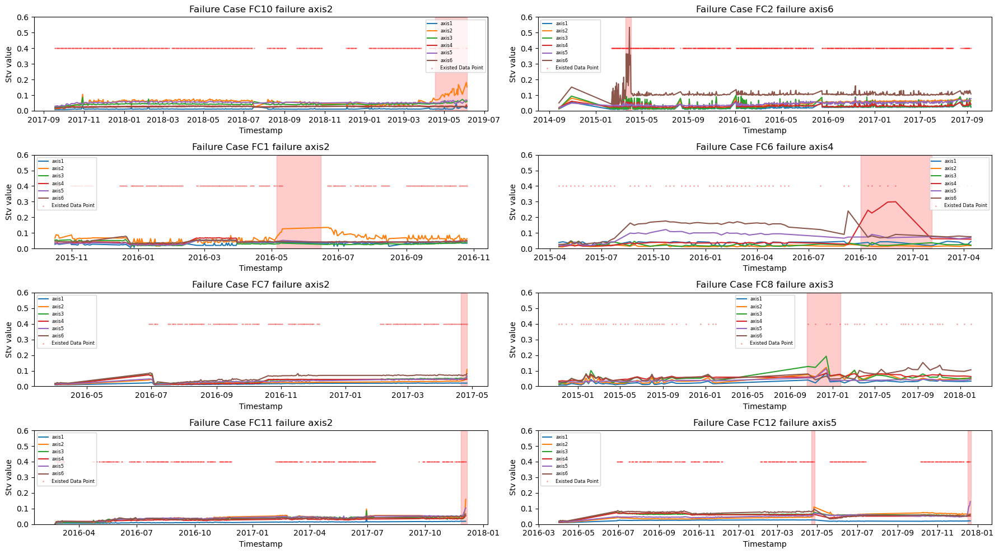

In [55]:
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(18,10))

data = {
    'FC10 failure axis2': Stv_FC10,
    'FC2 failure axis6': Stv_FC2,
    'FC1 failure axis2': Stv_FC1,
    'FC6 failure axis4': Stv_FC6,
    'FC7 failure axis2': Stv_FC7,
    'FC8 failure axis3': Stv_FC8,
    'FC11 failure axis2': Stv_FC11,
    'FC12 failure axis5': Stv_FC12
}

for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('Stv value')
        ax.set_ylim(0, .6)
        ax.legend()
        
    if isinstance(Failure_period[i][0], list):
        for x in Failure_period[i]:
            ax.axvspan(x[0], x[1], alpha=0.2, color='red')
    else:
        ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
    ax.scatter(x = d.index, y =np.full(shape=len(d.index), fill_value=0.4),s=0.1, color='r', label= 'Existed Data Point' )
    ax.legend(loc= "best",fontsize="6")

plt.tight_layout()


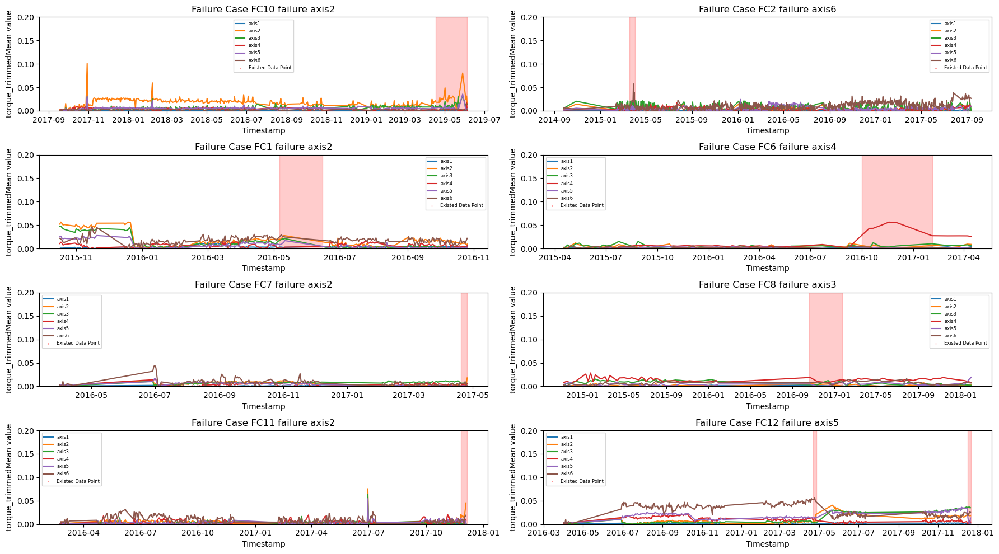

In [56]:
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(18,10))

data = {
    'FC10 failure axis2': torque_trimmedMean_FC10,
    'FC2 failure axis6': torque_trimmedMean_FC2,
    'FC1 failure axis2': torque_trimmedMean_FC1,
    'FC6 failure axis4': torque_trimmedMean_FC6,
    'FC7 failure axis2': torque_trimmedMean_FC7,
    'FC8 failure axis3': torque_trimmedMean_FC8,
    'FC11 failure axis2': torque_trimmedMean_FC11,
    'FC12 failure axis5': torque_trimmedMean_FC12
}



for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        

        
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('torque_trimmedMean value')
        ax.set_ylim(0, .2)
        ax.legend()
    if isinstance(Failure_period[i][0], list):
        for x in Failure_period[i]:
            ax.axvspan(x[0], x[1], alpha=0.2, color='red')
    else:
        ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
    
    ax.scatter(x = d.index, y =np.full(shape=len(d.index), fill_value=0.25),s=0.1, color='r', label= 'Existed Data Point' )
    ax.legend(loc= "best",fontsize="6")


plt.tight_layout()


In [57]:
torque_trimmedMean_FC12 = torque_trimmedMean_FC12.dropna(axis=0,how='any')
torque_signalNoise_FC12 = torque_signalNoise_FC12.dropna(axis=0,how='any')
MAX_AMP_FC12 = MAX_AMP_FC12.dropna(axis=0,how='any')

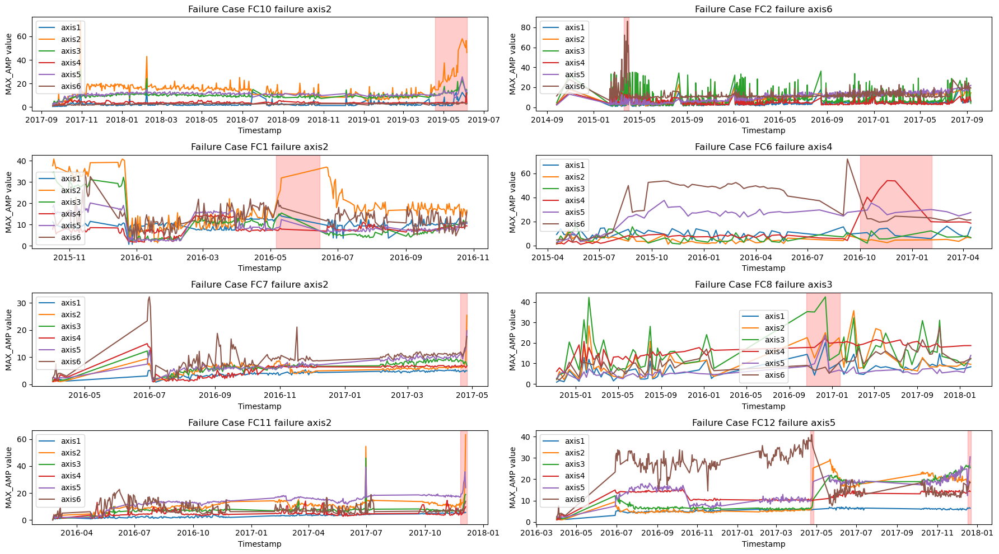

In [58]:
axis_list = ['axis1','axis2','axis3','axis4','axis5','axis6']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(18,10))

data = {
    'FC10 failure axis2':MAX_AMP_FC10,
    'FC2 failure axis6': MAX_AMP_FC2,
    'FC1 failure axis2': MAX_AMP_FC1,
    'FC6 failure axis4': MAX_AMP_FC6,
    'FC7 failure axis2': MAX_AMP_FC7,
    'FC8 failure axis3': MAX_AMP_FC8,
    'FC11 failure axis2': MAX_AMP_FC11,
    'FC12 failure axis5': MAX_AMP_FC12
}

for i, (fc, d) in enumerate(data.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    for index in axis_list:
        ax.plot(d[index], label=index)
        ax.set_title(f'Failure Case {fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('MAX_AMP value')
#         ax.set_ylim(0, .2)
        ax.legend()
    if isinstance(Failure_period[i][0], list):
        for x in Failure_period[i]:
            ax.axvspan(x[0], x[1], alpha=0.2, color='red')
    else:
        ax.axvspan(Failure_period[i][0], Failure_period[i][1], alpha=0.2, color='red')
    
plt.legend()
plt.tight_layout()


# Features for each axis

In [59]:
feature_axis1_FC2 = pd.concat([RMS_Value_FC2['axis1'],Stv_FC2['axis1'],torque_areaUnderSignal_FC2['axis1']],axis=1)
feature_axis1_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis1_FC10 = pd.concat([RMS_Value_FC10['axis1'],Stv_FC10['axis1'],torque_areaUnderSignal_FC10['axis1']],axis=1)
feature_axis1_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC2 = pd.concat([RMS_Value_FC2['axis2'],Stv_FC2['axis2'],torque_areaUnderSignal_FC2['axis2']],axis=1)
feature_axis2_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC10 = pd.concat([RMS_Value_FC10['axis2'],Stv_FC10['axis2'],torque_areaUnderSignal_FC10['axis2']],axis=1)
feature_axis2_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC2 = pd.concat([RMS_Value_FC2['axis3'],Stv_FC2['axis3'],torque_areaUnderSignal_FC2['axis3']],axis=1)
feature_axis3_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC10 = pd.concat([RMS_Value_FC10['axis3'],Stv_FC10['axis3'],torque_areaUnderSignal_FC10['axis3']],axis=1)
feature_axis3_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC2 = pd.concat([RMS_Value_FC2['axis4'],Stv_FC2['axis4'],torque_areaUnderSignal_FC2['axis4']],axis=1)
feature_axis4_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC10 = pd.concat([RMS_Value_FC10['axis4'],Stv_FC10['axis4'],torque_areaUnderSignal_FC10['axis4']],axis=1)
feature_axis4_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC2 = pd.concat([RMS_Value_FC2['axis5'],Stv_FC2['axis5'],torque_areaUnderSignal_FC2['axis5']],axis=1)
feature_axis5_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC10 = pd.concat([RMS_Value_FC10['axis5'],Stv_FC10['axis5'],torque_areaUnderSignal_FC10['axis5']],axis=1)
feature_axis5_FC10.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC2 = pd.concat([RMS_Value_FC2['axis6'],Stv_FC2['axis6'],torque_areaUnderSignal_FC2['axis6']],axis=1)
feature_axis6_FC2.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC10 = pd.concat([RMS_Value_FC10['axis6'],Stv_FC10['axis6'],torque_areaUnderSignal_FC10['axis6']],axis=1)
feature_axis6_FC10.columns = ['RMS','Stv','areaUnderSignal']

In [60]:
Failure_period = [line_FC10, line_FC2, line_FC1, line_FC6, line_FC7, line_FC8,line_FC11, line_FC12]

In [223]:
len(feature_axis1_FC10)

492

In [61]:
data1 = feature_axis1_FC2
data2 = feature_axis2_FC2
data3 = feature_axis3_FC2
data4 = feature_axis4_FC2
data5 = feature_axis5_FC2
data6 = feature_axis6_FC2
frames_FC2 = [data1, data2, data3, data4, data5, data6]



# Aggregating Features

1. Distance between the centriod of the reference cluster and the updated data points

In [342]:
# Global
def centriod_distance(ref_cluster,new):
    x = ref_cluster['RMS']
    y = ref_cluster['Stv']
    z = ref_cluster['areaUnderSignal']
    list_D = []
    middle = np.average(x), np.average(y), np.average(z)
    for i in range(len(ref_cluster)):
        x_i = x.iloc[i:i+1] 
        y_i = y.iloc[i:i+1]
        z_i = z.iloc[i:i+1]
        point = x_i,y_i,z_i
        point = np.asarray(point)
        D_i = np.linalg.norm(point - middle)
        list_D.append(D_i)
    D = np.linalg.norm(new - middle)
    return D, list_D
    
    
def plot_distance_global(frames,k,failure_Case,ax,Failure_period):
        
    ref_cluster_FCX = pd.concat([frames[0][0:k],
                                 frames[1][0:k],
                                 frames[2][0:k],
                                 frames[3][0:k],
                                 frames[4][0:k],
                                 frames[5][0:k]],axis = 0)

    
    data = {
        'axis1': frames[0][k+1:],
        'axis2': frames[1][k+1:],
        'axis3': frames[2][k+1:],
        'axis4': frames[3][k+1:],
        'axis5': frames[4][k+1:],
        'axis6': frames[5][k+1:],

    }
    #training process 
    
    Dist = [[],[],[],[],[],[]]
    Distance_FCX = {}
    for i, (fc, d) in enumerate(data.items()):
        x = pd.to_datetime(d.index)
        for index, row in d.iterrows():
            dis, threshold = centriod_distance(ref_cluster_FCX,row)
            Dist[i].append(dis)
        Distance_FCX[fc] = Dist[i]

        ax.plot(x, Distance_FCX[fc],label = fc)
    if isinstance(Failure_period[0], list):
        for x in Failure_period:
            ax.axvspan(x[0], x[1], alpha=0.2,  color='yellow',label='failure period')
    else:
        ax.axvspan(Failure_period[0], Failure_period[1], alpha=0.2, color='yellow',label='failure period')
#     ax.set_ylim(0, 0.5)
    ax.set_title(failure_Case)
    ax.legend()
    return Distance_FCX,threshold


# K-means 

In [63]:
from sklearn.cluster import KMeans


def Kmeans(frames, k, title, failure_period):
    reference = pd.concat([frames[0][0:k],
                                         frames[1][0:k],
                                         frames[2][0:k],
                                         frames[3][0:k],
                                         frames[4][0:k],
                                         frames[5][0:k]],axis = 0)

    fig, ax = plt.subplots(1,figsize=(18,10))
    # Train the local outlier factor (LOF) model for novelty detection
    Kmeans_novelty = KMeans(n_clusters=1, random_state=0, n_init= 10).fit(reference)
    score_train = Kmeans_novelty.score(reference)
    # Predict novelties
    data = {
            'axis1': frames[0][k+1:],
            'axis2': frames[1][k+1:],
            'axis3': frames[2][k+1:],
            'axis4': frames[3][k+1:],
            'axis5': frames[4][k+1:],
            'axis6': frames[5][k+1:],

        }

    Dist = [[],[],[],[],[],[]]
    Kmeans_FCX = {}

    for i, (fc, d) in enumerate(data.items()):
        x = pd.to_datetime(data1[k+1:].index)

        for index, row in d.iterrows():
            row = row.to_numpy()
            row = row.reshape(1,3)
            prediction_novelty = Kmeans_novelty.predict(row)
            score = Kmeans_novelty.score(row)
            Dist[i].append(abs(score))
        Kmeans_FCX[fc] = Dist[i]
        ax.plot(x, Kmeans_FCX[fc],label = fc)
    if isinstance(failure_period[0], list):
        for x in failure_period:
            ax.axvspan(x[0], x[1], alpha=0.2, color='yellow',label='failure period')
    else:
        ax.axvspan(failure_period[0], failure_period[1], alpha=0.2, color='yellow',label='failure period')

    ax.set_title(title)
    ax.legend()
    return Kmeans_FCX, abs(score_train)


# Linear Regression

In [348]:
from sklearn.linear_model import LinearRegression

def Linear_Regression(Distance_FCX,data,failure_axis,ylim, score, k):
    window_size = 7
    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(18,10))
    columns=['axis1','axis2','axis3','axis4','axis5','axis6']
    date = pd.to_datetime(data[(k+window_size):].index)
    Dist = [[],[],[],[],[],[]]
    Trend = {}

    
    for i, (fc, d) in enumerate(Distance_FCX.items()):
        row = i // 2
        col = i % 2
        ax = axs[row, col]
        
        for N in range(0, (len(d) - window_size + 1)):
            end_index = N + window_size
            data = d[N:end_index]
            x = np.arange(1,len(data)+1)
            model = LinearRegression().fit(x.reshape(-1,1),data)
            Dist[i].append(model.coef_[0])
        Trend[fc] = Dist[i]
        ax.axhline(y = score, color = 'r', linestyle = '-',label= 'linear regression threshold')
        if fc == failure_axis:
            ax.set_title(f'{fc}',color = 'r')
        else:
            ax.set_title(f'{fc}')
        ax.plot(date, Trend[fc],label = fc)
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('Slope Value')
        ax.set_ylim(-ylim, ylim)
        ax.legend(loc= "best",fontsize="6")

    plt.tight_layout()
    return Trend

In [65]:
from ipywidgets import interact, interactive, fixed, interact_manual

In [322]:
def LR_Label(Trend, data, threshold,failure_axis,failure_period,k):
    LR_FCX_true = {}
    LR_FCX_predict = {}
    window_size = 7
    for i, (fc, d) in enumerate(Trend.items()):
        LR_true =pd.DataFrame(d)
        LR_predict =pd.DataFrame(d)
        x = pd.to_datetime(data[(k+window_size):].index)
        LR_true = LR_true.set_index(x)
        LR_true['class'] = 0
        LR_predict['class'] = 0
        if fc == failure_axis:
            LR_true['class'][failure_period[0]:failure_period[1]] = 1
        LR_FCX_true[fc] = LR_true

        for index, row in enumerate(d):
            if row > threshold:
                LR_predict.at[index,'class'] = 1

        LR_FCX_predict[fc] = LR_predict
        
    LR_FCX_predict_com = pd.concat([LR_FCX_predict['axis1']['class'],
                                     LR_FCX_predict['axis2']['class'],
                                     LR_FCX_predict['axis3']['class'],
                                     LR_FCX_predict['axis4']['class'],
                                     LR_FCX_predict['axis5']['class'],
                                     LR_FCX_predict['axis6']['class']],axis = 0)
    
    
    LR_FCX_true_com = pd.concat([LR_FCX_true['axis1']['class'],
                                     LR_FCX_true['axis2']['class'],
                                     LR_FCX_true['axis3']['class'],
                                     LR_FCX_true['axis4']['class'],
                                     LR_FCX_true['axis5']['class'],
                                     LR_FCX_true['axis6']['class']],axis = 0)
    
    pred_labels = LR_FCX_predict_com.to_numpy()
    true_labels = LR_FCX_true_com.to_numpy()
    
    TP = np.sum(np.logical_and(pred_labels == 1, true_labels == 1))

    # True Negative (TN): we predict a label of 0 (negative), and the true label is 0.
    TN = np.sum(np.logical_and(pred_labels == 0, true_labels == 0))
    # False Negative (FN): we predict a label of 0 (negative), but the true label is 1.
    FN = np.sum(np.logical_and(pred_labels == 0, true_labels == 1))
    # False Positive (FP): we predict a label of 1 (positive), but the true label is 0.
    FP = np.sum(np.logical_and(pred_labels == 1, true_labels == 0))
    TPR =TP/(TP+FN)
    FPR = FP/(FP+TN)
    Precision = TP/(TP+FP)
    Accuracy = (TP+TN)/(TP+FP+TN+FN)
    return TPR,FPR,Precision,Accuracy

# Moving Average Window(Trend Detection)

In [151]:
def Label(average_dict_FCX, data, Average_FCX,failure_axis,failure_period,k):
    Aver_FCX_true = {}
    Aver_FCX_predict = {}
    w_z = 7
    for i, (fc, d) in enumerate(average_dict_FCX.items()):
        Aver_true =pd.DataFrame(d)
        
        Aver_predict =pd.DataFrame(d)
        x = pd.to_datetime(data[k+w_z:].index)
        Aver_true = Aver_true.set_index(x)
#         Aver_true = Aver_true.dropna(axis=0,how='any')
#         Aver_predict = Aver_predict.dropna(axis=0,how='any')
        Aver_true['class'] = 0
        Aver_predict['class'] = 0
        if fc == failure_axis:
            Aver_true['class'][failure_period[0]:failure_period[1]] = 1
        Aver_FCX_true[fc] = Aver_true
  
        for index, row in d.iteritems():
            if row > Average_FCX:
                Aver_predict.at[index,'class'] = 1

        Aver_FCX_predict[fc] = Aver_predict
    
    Aver_FCX_predict_com = pd.concat([Aver_FCX_predict['axis1']['class'],
                                     Aver_FCX_predict['axis2']['class'],
                                     Aver_FCX_predict['axis3']['class'],
                                     Aver_FCX_predict['axis4']['class'],
                                     Aver_FCX_predict['axis5']['class'],
                                     Aver_FCX_predict['axis6']['class']],axis = 0)
    
    
    Aver_FCX_true_com = pd.concat([Aver_FCX_true['axis1']['class'],
                                     Aver_FCX_true['axis2']['class'],
                                     Aver_FCX_true['axis3']['class'],
                                     Aver_FCX_true['axis4']['class'],
                                     Aver_FCX_true['axis5']['class'],
                                     Aver_FCX_true['axis6']['class']],axis = 0)
    
    pred_labels = Aver_FCX_predict_com.to_numpy()
    true_labels = Aver_FCX_true_com.to_numpy()
    
    TP = np.sum(np.logical_and(pred_labels == 1, true_labels == 1))

    # True Negative (TN): we predict a label of 0 (negative), and the true label is 0.
    TN = np.sum(np.logical_and(pred_labels == 0, true_labels == 0))
    # False Negative (FN): we predict a label of 0 (negative), but the true label is 1.
    FN = np.sum(np.logical_and(pred_labels == 0, true_labels == 1))
    # False Positive (FP): we predict a label of 1 (positive), but the true label is 0.
    FP = np.sum(np.logical_and(pred_labels == 1, true_labels == 0))
    TPR =TP/(TP+FN)
    FPR = FP/(FP+TN)
    Precision = TP/(TP+FP)
    Accuracy = (TP+TN)/(TP+FP+TN+FN)
    return TPR,FPR,Precision, Accuracy
            

In [349]:

def Moving_Average(Distance_Global,failure_axis,ylim,sigma,threshold,k):
    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(18,10))
    w_z = 7
    Moved_average = []
    columns=['axis1','axis2','axis3','axis4','axis5','axis6']
    Distance =pd.DataFrame(columns=columns)
    average_dict = {}
    Moved_average_dict = {}
    Mult_max = 0
    Mult_min = 0
    for i, (fc, d) in enumerate(Distance_Global.items()):
        row = i // 2
        col = i % 2
        ax = axs[row, col]
        x = pd.to_datetime(data1[k+w_z:].index)
        Distance[fc] = d
        Average = Distance[fc].rolling(7).mean()
        Average = Average.dropna(axis=0,how='any')
        average_dict[fc] = Average
#         Th = np.mean(d) + np.std(d)*sigma
#         Moved_average.append(Th)       
        ax.axhline(y = threshold, color = 'r', linestyle = '-', label= f'Moved average Multiplier {threshold}')
        ax.plot(x, Average,label = fc)
        if fc == failure_axis:
            ax.set_title(f'{fc}',color = 'r')
        else:
            ax.set_title(f'{fc}')
        ax.set_xlabel('Timestamp')
        ax.set_ylabel('Centroid-based Value')
        ax.set_ylim(-ylim, ylim)
        ax.legend(loc= "best",fontsize="6")

    plt.tight_layout()
    return average_dict

# Distance-based local oulier

In [69]:
# Failure Case 2
from scipy.spatial.distance import pdist, squareform
def outer_distance(ref_cluster,new):
    Dist = []
    for index, row in ref_cluster.iterrows():
        Dist.append(np.linalg.norm(new - row))
    d_outer = sum(Dist)/len(ref_cluster)
    return d_outer

def Inner_distance(ref_cluster):
    distances = pdist(ref_cluster)
    k = len(ref_cluster)
    d_inner = sum(distances)/(k*(k-1))
    return d_inner

def Distance_based_lof_global(frames,k, title, ax, Failure_period):

    ref_cluster_FCX = pd.concat([frames[0][0:k],
                                     frames[1][0:k],
                                     frames[2][0:k],
                                     frames[3][0:k],
                                     frames[4][0:k],
                                     frames[5][0:k]],axis = 0)
    Inner_dist = []
    Inner_dist_FCX = Inner_distance(ref_cluster_FCX)
    #The rest data points
    data = {
        'axis1': frames[0][k+1:],
        'axis2': frames[1][k+1:],
        'axis3': frames[2][k+1:],
        'axis4': frames[3][k+1:],
        'axis5': frames[4][k+1:],
        'axis6': frames[5][k+1:],

    }

    Dist = [[],[],[],[],[],[]]
    Distance_FCX = {}
    
    for i, (fc, d) in enumerate(data.items()):
        x = pd.to_datetime(d.index)
        for index, row in d.iterrows():
            Dist[i].append(outer_distance(ref_cluster_FCX,row)/Inner_dist_FCX)
        Distance_FCX[fc] = Dist[i]
        ax.plot(x, Distance_FCX[fc],label = fc)
    if isinstance(Failure_period[0], list):
        for x in Failure_period:
            ax.axvspan(x[0], x[1], alpha=0.2, color='yellow',label='failure period')
    else:
        ax.axvspan(Failure_period[0], Failure_period[1], alpha=0.2, color='yellow',label='failure period')
    ax.set_title(title)
    ax.legend()
    return Distance_FCX,Inner_dist_FCX
        


# OneclassSVM

In [232]:
from sklearn.svm import OneClassSVM


def OneclassSVM(frames, k, title, failure_period):
    gamma = 2.5
    reference = pd.concat([frames[0][0:k],
                                         frames[1][0:k],
                                         frames[2][0:k],
                                         frames[3][0:k],
                                         frames[4][0:k],
                                         frames[5][0:k]],axis = 0)

    fig, ax = plt.subplots(1,figsize=(18,10))
    # Train the local outlier factor (LOF) model for novelty detection
    OneclassSVM_novelty = OneClassSVM(gamma=gamma, kernel="rbf", nu=0.05).fit(reference)
    score_train = OneclassSVM_novelty.score_samples(reference)
    # Predict novelties
    data = {
            'axis1': frames[0][k+1:],
            'axis2': frames[1][k+1:],
            'axis3': frames[2][k+1:],
            'axis4': frames[3][k+1:],
            'axis5': frames[4][k+1:],
            'axis6': frames[5][k+1:],

        }

    Dist = [[],[],[],[],[],[]]
    Distance_FCX = {}

    for i, (fc, d) in enumerate(data.items()):
        x = pd.to_datetime(data1[k+1:].index)

        for index, row in d.iterrows():
            row = row.to_numpy()
            row = row.reshape(1,3)
            prediction_novelty = OneclassSVM_novelty.predict(row)
            score = OneclassSVM_novelty.score_samples(row)
            Dist[i].append(1/score)
        Distance_FCX[fc] = Dist[i]
        ax.plot(x, Distance_FCX[fc],label = fc)
    if isinstance(failure_period[0], list):
        for x in failure_period:
            ax.axvspan(x[0], x[1], alpha=0.2, color='yellow',label='failure period')
    else:
        ax.axvspan(failure_period[0], failure_period[1], alpha=0.2, color='yellow',label='failure period')

    ax.set_title(title)
    ax.legend()
    return Distance_FCX, score_train


# Local Outlier Factor 

In [71]:
from sklearn.neighbors import LocalOutlierFactor
from pyod.models.loci import LOCI
from pyod.utils.data import generate_data

def classic_LOF(frames, k, title, failure_period):
    reference = pd.concat([frames[0][0:k],
                                         frames[1][0:k],
                                         frames[2][0:k],
                                         frames[3][0:k],
                                         frames[4][0:k],
                                         frames[5][0:k]],axis = 0)

    fig, ax = plt.subplots(1,figsize=(18,10))
    # Train the local outlier factor (LOF) model for novelty detection

    lof_novelty = LocalOutlierFactor(n_neighbors=5, novelty = True).fit(reference)

    Train_score = -lof_novelty.negative_outlier_factor_
    # Predict novelties
    data = {
            'axis1': frames[0][k+1:],
            'axis2': frames[1][k+1:],
            'axis3': frames[2][k+1:],
            'axis4': frames[3][k+1:],
            'axis5': frames[4][k+1:],
            'axis6': frames[5][k+1:],

        }

    Dist = [[],[],[],[],[],[]]
    Distance_FCX = {}

    for i, (fc, d) in enumerate(data.items()):
        x = pd.to_datetime(data1[k+1:].index)
 
        for index, row in d.iterrows():
            row = row.to_numpy()
            row = row.reshape(1,3)
            
            score = lof_novelty.score_samples(row)
            Dist[i].append(abs(score))
        Distance_FCX[fc] = Dist[i]
        ax.plot(x, Distance_FCX[fc],label = fc)
    if isinstance(failure_period[0], list):
        for x in failure_period:
            ax.axvspan(x[0], x[1], alpha=0.2, color='yellow',label='failure period')
    else:
        ax.axvspan(failure_period[0], failure_period[1], alpha=0.2, color='yellow',label='failure period')

    ax.set_title(title)
    ax.legend()
    return Distance_FCX, Train_score
    


# Autoencoder

In [72]:
import tensorflow
from pyod.models.auto_encoder import AutoEncoder


def autoencoder(frames,title,k,Failure_period):
    X_train = pd.concat([frames[0][0:10],
                                     frames[1][0:k],
                                     frames[2][0:k],
                                     frames[3][0:k],
                                     frames[4][0:k],
                                     frames[5][0:k]],axis = 0)
    X_test = {
        'axis1': frames[0][k+1:],
        'axis2': frames[1][k+1:],
        'axis3': frames[2][k+1:],
        'axis4': frames[3][k+1:],
        'axis5': frames[4][k+1:],
        'axis6': frames[5][k+1:],

    }

    fig = plt.figure(figsize=(18, 9))
    ax = fig.add_subplot(1, 1, 1)
    # train AutoEncoder detector
    clf_name = 'AutoEncoder'
    clf = AutoEncoder(epochs=100, hidden_neurons =[8, 2, 2, 8])
    clf.fit(X_train)

    # get the prediction labels and outlier scores of the training data
    y_train_pred = clf.labels_  # binary labels (0: inliers, 1: outliers)

    y_train_scores = clf.decision_scores_  # Reconstruction error

    # get the prediction on the test data

    Error = [[],[],[],[],[],[]]
    Error_FCX = {}

    for i, (fc, d) in enumerate(X_test.items()):
        x = pd.to_datetime(d.index)
        for index, row in d.iterrows():
            row = row.to_numpy()
            row = row.reshape(1,3)
            error = clf.decision_function(row)
            Error[i].append(error[0])
        Error_FCX[fc] = Error[i]
        ax.plot(x, Error_FCX[fc],label = fc)
    if isinstance(Failure_period[0], list):
        for x in Failure_period:
            ax.axvspan(x[0], x[1], alpha=0.2, color='yellow',label='failure period')
    else:
        ax.axvspan(Failure_period[0], Failure_period[1], alpha=0.2, color='yellow',label='failure period')
#         ax.set_ylim(0, 20)
    ax.set_title(title)
    ax.legend()
    return Error_FCX, y_train_scores


In [202]:
def Average_unsupervised(indicator,Failure_axis,failure_period,method,feature_axis1_FCX, TH, k,ylim):
    T = []
    F = []
    P = []
    average_dict_FCX = Moving_Average(indicator, Failure_axis,ylim, 2,TH,k)
#     plt.close()

#     Multiplier_array = np.linspace(MIN_trend, MAX_trend, 300, endpoint = True)        
    TPR, FPR, Precision, Accuracy = Label(average_dict_FCX,feature_axis1_FCX, TH,Failure_axis,failure_period,k)
    return TPR, FPR, Precision,Accuracy
        

In [326]:
def LR_unsupervised(indicator,Failure_axis, failure_period,ind_label, feature_axis1_FCX, TH,k, ylim):
    T = []
    F = []
    P = []
    Trend_FCX  = Linear_Regression(indicator,feature_axis1_FCX,Failure_axis,ylim,TH,k)

#     Multiplier_array = np.linspace(MIN_trend, MAX_trend, 300, endpoint = True)        
    TPR, FPR, Precision, Accuracy = LR_Label(Trend_FCX,feature_axis1_FCX, TH,Failure_axis,failure_period,k)
    return TPR, FPR, Precision,Accuracy

In [75]:
def F1_score(precision, recall):
    F1_score = 2*np.multiply(precision,recall)/(np.add(precision , recall))
    return F1_score

In [330]:


def metrics_MA(indicator,failure_axis,failure_period,fc,feature_axis1_FCX,score_ma,k,ylim):

    TPR_dict_FC2_MA,FPR_dict_FC2_MA, Precision_dict_FC2_MA, Accuracy_dict_FC2_MA= Average_unsupervised(indicator,failure_axis,failure_period,fc,feature_axis1_FCX,score_ma,k,ylim)
    F1_score_dict_FC2_MA = F1_score(Precision_dict_FC2_MA,TPR_dict_FC2_MA)
    print(f"Precision of {fc} in Moving Average is {Precision_dict_FC2_MA}")
    print(f"False Postive Rate of {fc} in Moving Average is {FPR_dict_FC2_MA}")
    print(f"Recall of {fc} in Moving Average is {TPR_dict_FC2_MA}")
    print(f"Accuracy {fc} in Moving Average is {Accuracy_dict_FC2_MA}")
    print(f"F-score of {fc} in Moving Average is {F1_score_dict_FC2_MA}")
    
def metrics_LR(indicator,failure_axis,failure_period,fc,feature_axis1_FCX,score_LR,k,ylim):
    # Linear Regression
    TPR_dict_FC2_LR,FPR_dict_FC2_LR,Precision_dict_FC2_LR, Accuracy_dict_FC2_LR = LR_unsupervised(indicator,failure_axis,failure_period,fc,feature_axis1_FCX,score_LR,k,ylim)
    F1_score_dict_FC2_LR = F1_score(Precision_dict_FC2_LR,TPR_dict_FC2_LR)
    print(f"Precision of {fc} in linear Regression is {Precision_dict_FC2_LR}")
    print(f"False Postive Rate of {fc} in linear Regression is {FPR_dict_FC2_LR}")
    print(f"Recall of {fc} in linear Regression is {TPR_dict_FC2_LR}")
    print(f"Accuracy of {fc} in linear Regression is {Accuracy_dict_FC2_LR}")
    print(f"F-score of {fc} in linear Regression is {F1_score_dict_FC2_LR}")

In [311]:
def slope(score,k):
    Threshold = []
    for t in range(6):
        x1 = np.arange(1,k+1)
        model_train = LinearRegression().fit(x1.reshape(-1,1),score[t*k:(k*(t+1))])
        Th = model_train.coef_[0]
        Threshold.append(Th)
    return Threshold

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Precision of Kmeans in Moving Average is 0.7142857142857143
False Postive Rate of Kmeans in Moving Average is 0.00045187528242205153
Recall of Kmeans in Moving Average is 0.35714285714285715
Accuracy Kmeans in Moving Average is 0.9975225225225225
F-score of Kmeans in Moving Average is 0.4761904761904762


C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


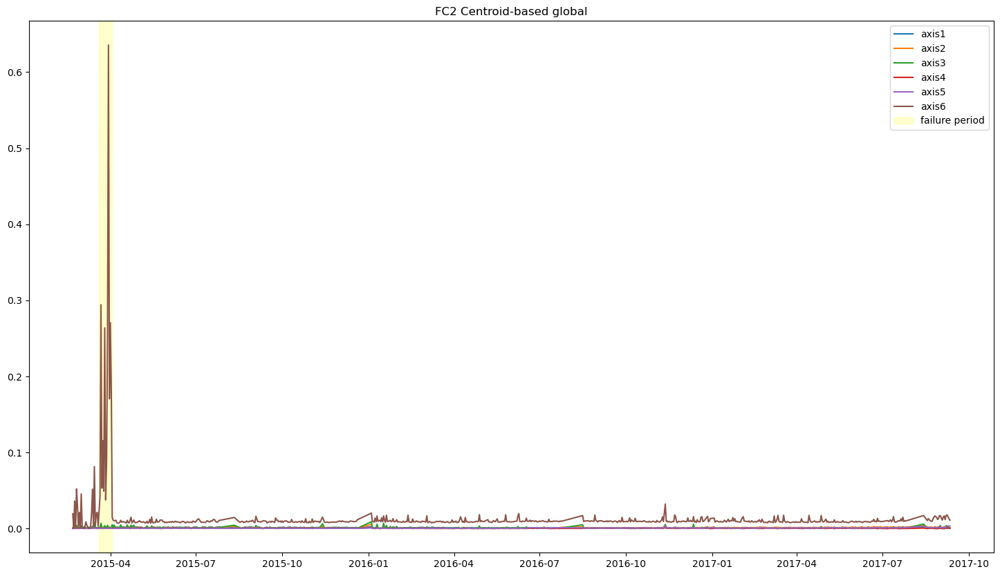

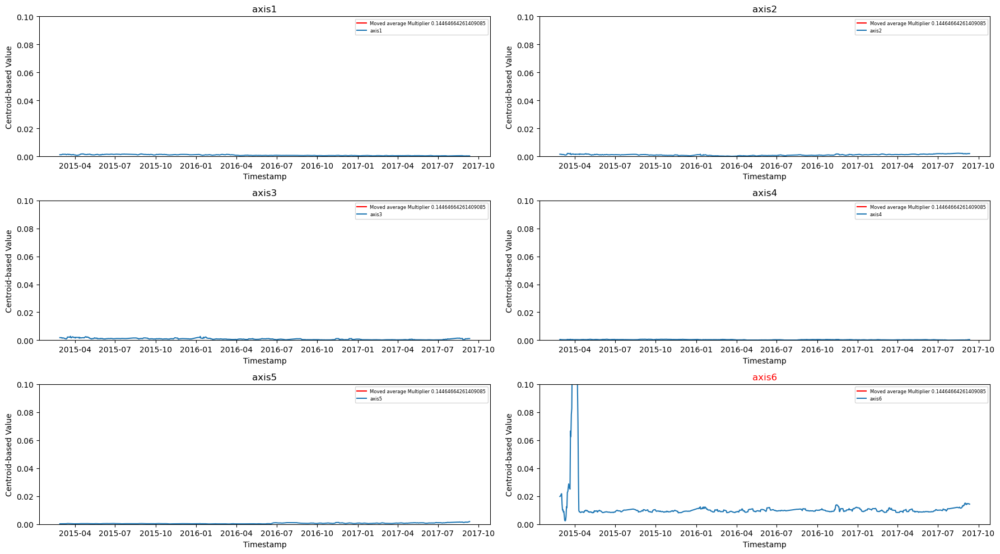

In [199]:
data1 = feature_axis1_FC2
data2 = feature_axis2_FC2
data3 = feature_axis3_FC2
data4 = feature_axis4_FC2
data5 = feature_axis5_FC2
data6 = feature_axis6_FC2
frames_FC2 = [data1, data2, data3, data4, data5, data6]

nus = [0.001, 0.01, 0.1, 1]
gammas = [0.001, 0.01, 0.1, 1]
tuned_parameters = {'kernel' : ['rbf'], 'gamma' : gammas, 'nu': nus}

clf = GridSearchCV(svm.OneClassSVM(), tuned_parameters, cv=10,
                       scoring='%s_macro' % score, return_train_score=True)

X_train = pd.concat([frames_FC2[0][0:k],
                                         frames_FC2[1][0:k],
                                         frames_FC2[2][0:k],
                                         frames_FC2[3][0:k],
                                         frames_FC2[4][0:k],
                                         frames_FC2[5][0:k]],axis = 0)
y_train = 
clf.fit(X_train, y_train)

resultDf = pd.DataFrame(clf.cv_results_)
print(resultDf[["mean_test_score", "std_test_score", "params"]].sort_values(by=["mean_test_score"], ascending=False).head())

print("Best parameters set found on development set:")
print()
print(clf.best_params_)

    

C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of DB-LOF in Moving Average is 0.7857142857142857
False Postive Rate of DB-LOF in Moving Average is 0.0006778129236330773
Recall of DB-LOF in Moving Average is 0.7857142857142857
Accuracy DB-LOF in Moving Average is 0.9986486486486487
F-score of DB-LOF in Moving Average is 0.7857142857142857


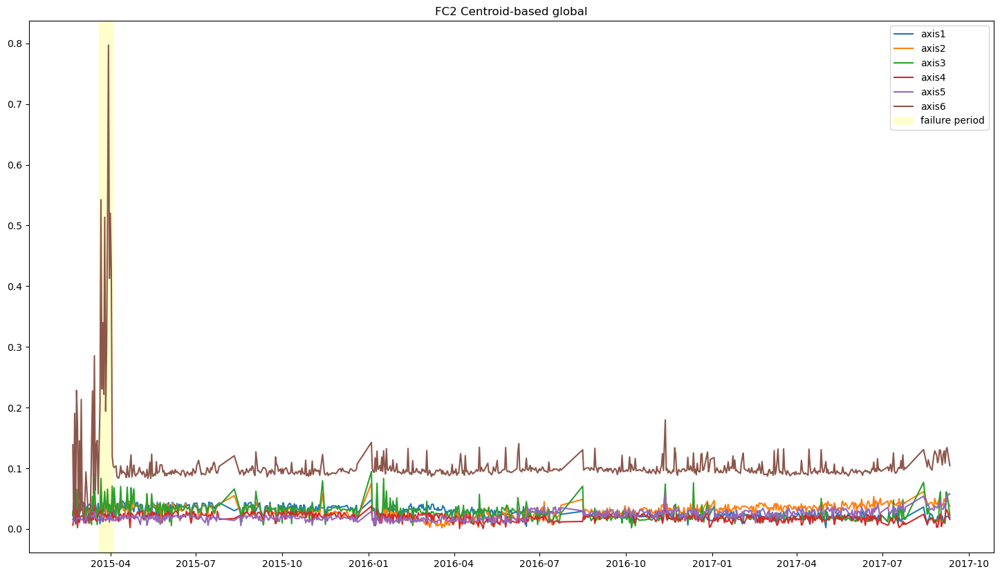

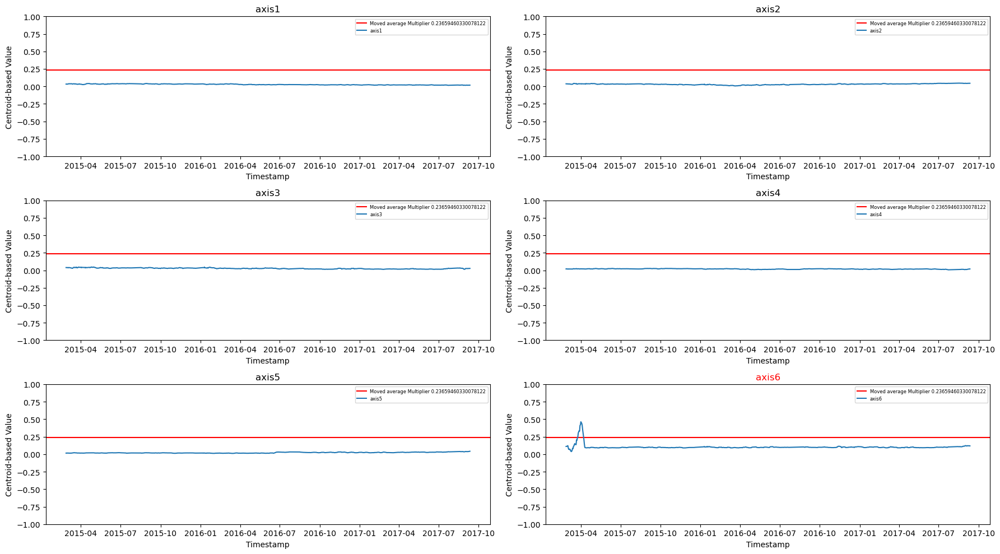

In [350]:
data1 = feature_axis1_FC2
data2 = feature_axis2_FC2
data3 = feature_axis3_FC2
data4 = feature_axis4_FC2
data5 = feature_axis5_FC2
data6 = feature_axis6_FC2
frames_FC2 = [data1, data2, data3, data4, data5, data6]

fig, ax1 = plt.subplots(1,figsize=(18,10))
Distance_FC2_Global, FC2_score = plot_distance_global(frames_FC2,10,'FC2 Centroid-based global',ax1,line_FC2)
score_FC2_DB_LOF = np.mean(FC2_score)+3*np.std(FC2_score)
metrics_MA(Distance_FC2_Global,'axis6',line_FC2,'DB-LOF',feature_axis1_FC2,score_FC2_DB_LOF,10,1)

C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of C-LOF in Moving Average is 0.41935483870967744
False Postive Rate of C-LOF in Moving Average is 0.004066877541798464
Recall of C-LOF in Moving Average is 0.9285714285714286
Accuracy C-LOF in Moving Average is 0.9957207207207207
F-score of C-LOF in Moving Average is 0.5777777777777778


C:\Temp\ipykernel_7300\3104644068.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of C-LOF in linear Regression is 0.14705882352941177
False Postive Rate of C-LOF in linear Regression is 0.013104383190239493
Recall of C-LOF in linear Regression is 0.7142857142857143
Accuracy of C-LOF in linear Regression is 0.9860360360360361
F-score of C-LOF in linear Regression is 0.24390243902439024


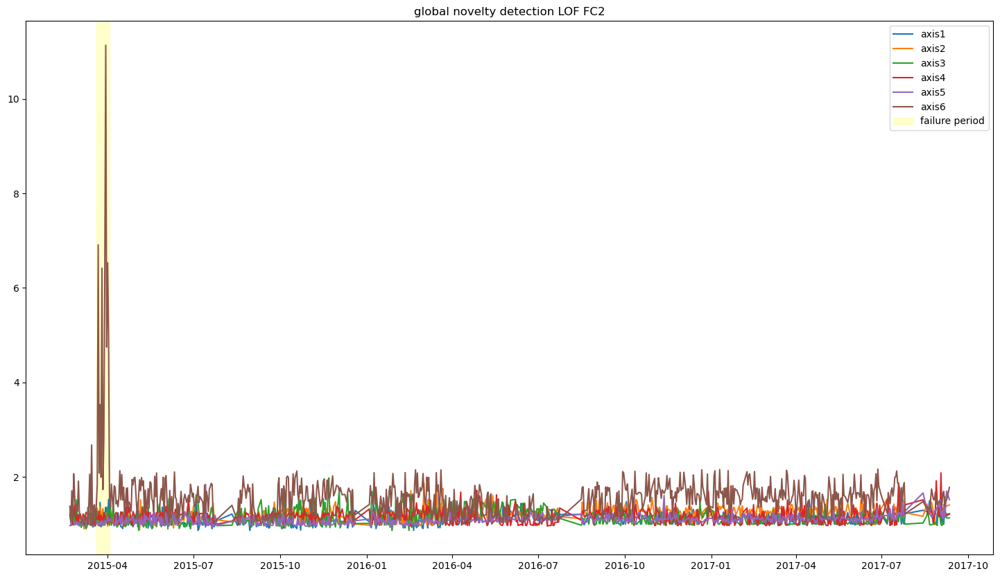

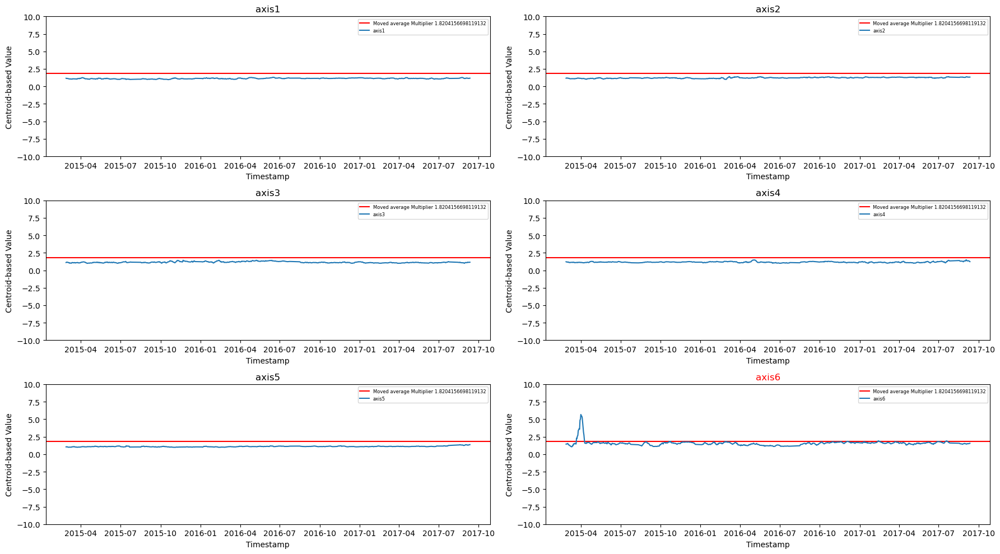

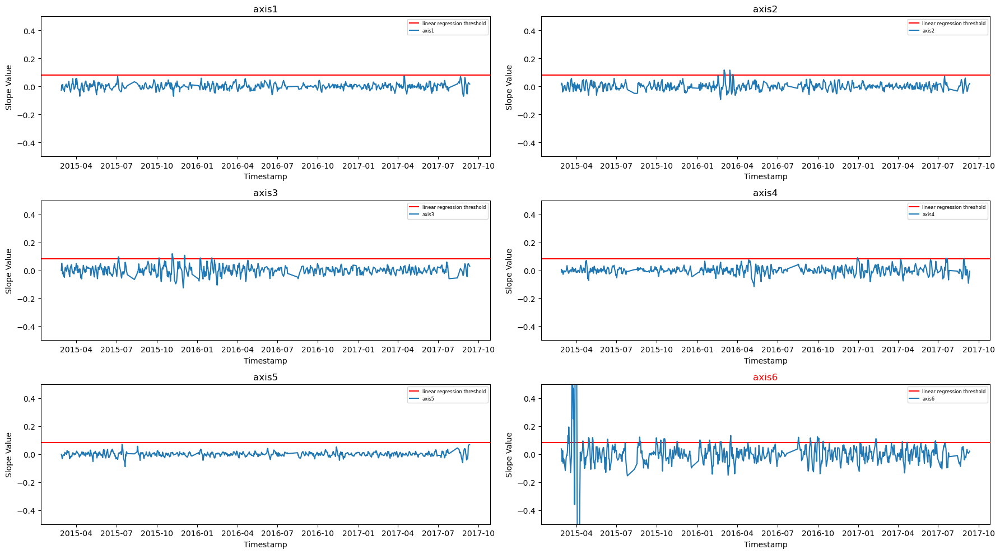

In [351]:
data1 = feature_axis1_FC2
data2 = feature_axis2_FC2
data3 = feature_axis3_FC2
data4 = feature_axis4_FC2
data5 = feature_axis5_FC2
data6 = feature_axis6_FC2
frames_FC2 = [data1, data2, data3, data4, data5, data6]
classic_LOF_global_FC2, score_CLOF_FC2 = classic_LOF(frames_FC2,10,'global novelty detection LOF FC2',line_FC2)
score_FC2_CLOF = np.mean(score_CLOF_FC2)+3*np.std(score_CLOF_FC2)
metrics_MA(classic_LOF_global_FC2,'axis6',line_FC2,'C-LOF',feature_axis1_FC2,score_FC2_CLOF,10,10)
# linear Regression
Threshold_FC2_CLOF = slope(score_CLOF_FC2,10)
score_FC2_LR_CLOF = np.mean(Threshold_FC2_CLOF)+3*np.std(Threshold_FC2_CLOF)
metrics_LR(classic_LOF_global_FC2,'axis6',line_FC2,'C-LOF',feature_axis1_FC2,1.5*score_FC2_LR_CLOF,10,0.5)

C:\Temp\ipykernel_7300\3104644068.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of C-LOF in linear Regression is 0.14705882352941177
False Postive Rate of C-LOF in linear Regression is 0.013104383190239493
Recall of C-LOF in linear Regression is 0.7142857142857143
Accuracy of C-LOF in linear Regression is 0.9860360360360361
F-score of C-LOF in linear Regression is 0.24390243902439024


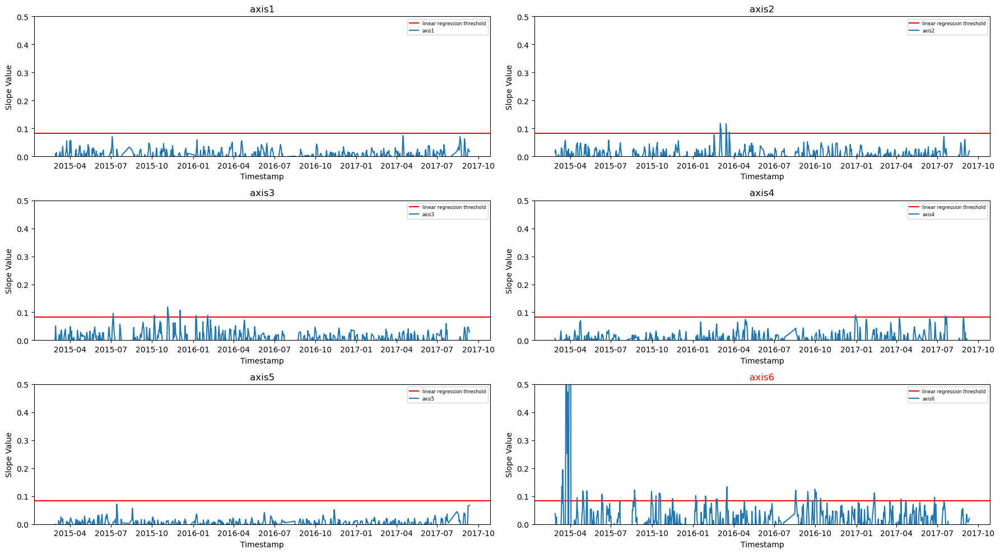

In [332]:
Threshold_FC2 = slope(score_CLOF_FC2,10)
score_FC2_LR = np.mean(Threshold_FC2)+3*np.std(Threshold_FC2)
metrics_LR(classic_LOF_global_FC2,'axis6',line_FC2,'C-LOF',feature_axis1_FC2,1.5*score_FC2_LR,10,0.5)

In [313]:
Threshold_FC2

[0.0034154305107791717,
 0.02251601098144851,
 0.0018445663466296414,
 -0.006305590157541189,
 -0.04351332107614603,
 -0.021675167560932195]

C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of OC_SVM in Moving Average is 0.7222222222222222
False Postive Rate of OC_SVM in Moving Average is 0.0011296882060551287
Recall of OC_SVM in Moving Average is 0.9285714285714286
Accuracy OC_SVM in Moving Average is 0.9986486486486487
F-score of OC_SVM in Moving Average is 0.8125000000000001
Precision of OC_SVM in linear Regression is 0.07103825136612021
Recall of OC_SVM in linear Regression is 0.9285714285714286
Accuracy of OC_SVM in linear Regression is 0.9613297150610584
F-score of OC_SVM in linear Regression is 0.1319796954314721


C:\Temp\ipykernel_7300\4076685250.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


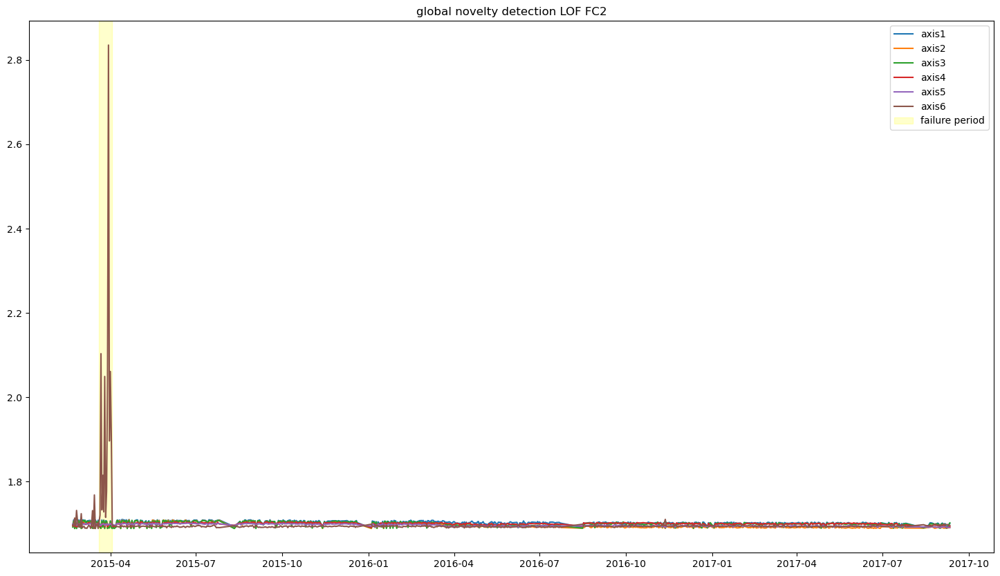

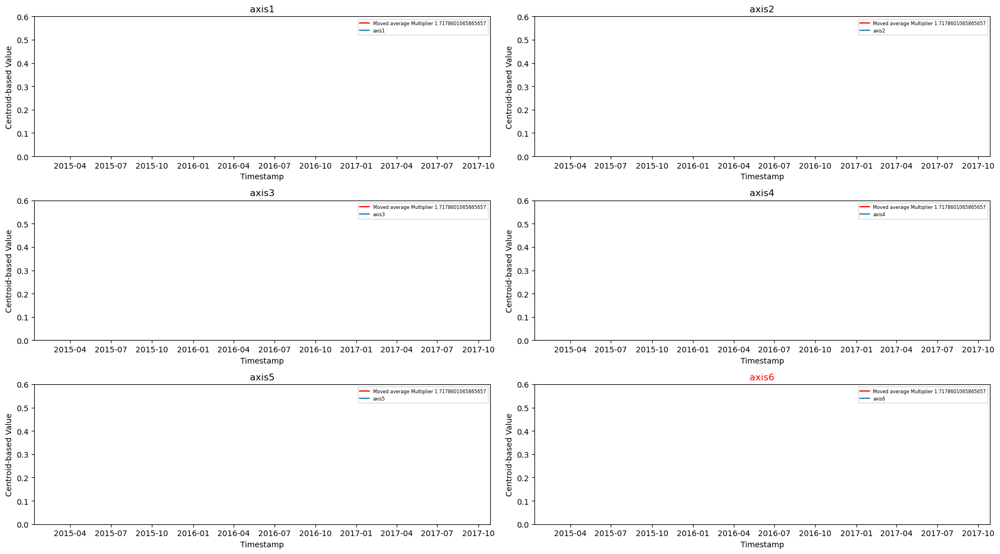

In [228]:
data1 = feature_axis1_FC2
data2 = feature_axis2_FC2
data3 = feature_axis3_FC2
data4 = feature_axis4_FC2
data5 = feature_axis5_FC2
data6 = feature_axis6_FC2
frames_FC2 = [data1, data2, data3, data4, data5, data6]
OneclassSVM_global_FC2, score_FC2 = OneclassSVM(frames_FC2,10,'global novelty detection LOF FC2',line_FC2)
score_FC2_svm = np.mean(1/score_FC2)+3*np.std(1/score_FC2)

metrics_MA(OneclassSVM_global_FC2,'axis6',line_FC2,'OC_SVM',feature_axis1_FC2,score_FC2_svm,10,0.6)
metrics_LR(OneclassSVM_global_FC2,'axis6',line_FC2,'OC_SVM',feature_axis1_FC2,score_f2,10)  


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 3)                 12        
                                                                 
 dropout (Dropout)           (None, 3)                 0         
                                                                 
 dense_1 (Dense)             (None, 3)                 12        
                                                                 
 dropout_1 (Dropout)         (None, 3)                 0         
                                                                 
 dense_2 (Dense)             (None, 8)                 32        
                                                                 
 dropout_2 (Dropout)         (None, 8)                 0         
                                                                 
 dense_3 (Dense)             (None, 2)                 1

2/2 [==============================] - 0s 21ms/step - loss: 1.2258 - val_loss: 1.7937
Epoch 63/100
2/2 [==============================] - 0s 21ms/step - loss: 1.2115 - val_loss: 1.7934
Epoch 64/100
2/2 [==============================] - 0s 22ms/step - loss: 1.2181 - val_loss: 1.7931
Epoch 65/100
2/2 [==============================] - 0s 20ms/step - loss: 1.2180 - val_loss: 1.7928
Epoch 66/100
2/2 [==============================] - 0s 20ms/step - loss: 1.2038 - val_loss: 1.7927
Epoch 67/100
2/2 [==============================] - 0s 21ms/step - loss: 1.2134 - val_loss: 1.7925
Epoch 68/100
2/2 [==============================] - 0s 22ms/step - loss: 1.2075 - val_loss: 1.7923
Epoch 69/100
2/2 [==============================] - 0s 21ms/step - loss: 1.2071 - val_loss: 1.7921
Epoch 70/100
2/2 [==============================] - 0s 20ms/step - loss: 1.2064 - val_loss: 1.7918
Epoch 71/100
2/2 [==============================] - 0s 20ms/step - loss: 1.2124 - val_loss: 1.7914
Epoch 72/100
2/2 [=====

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


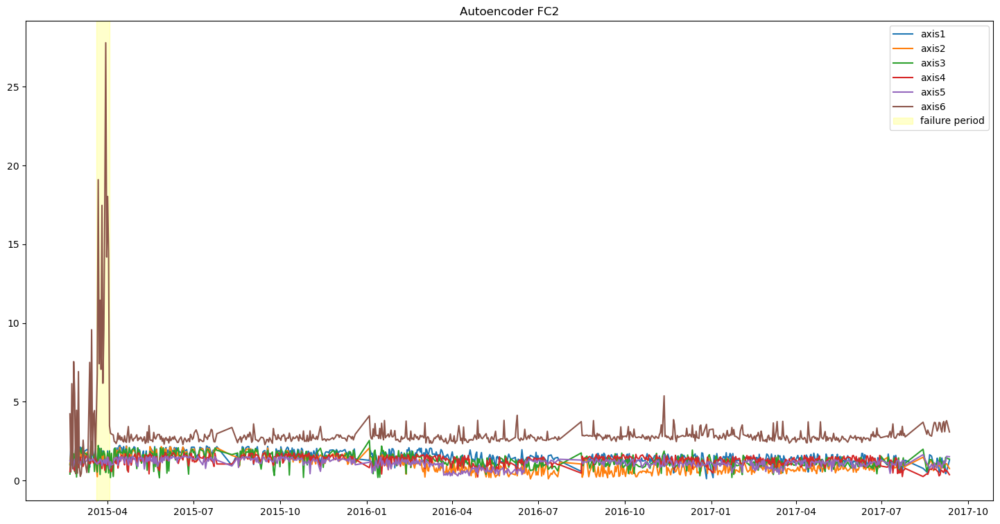

In [86]:
data1 = feature_axis1_FC2
data2 = feature_axis2_FC2
data3 = feature_axis3_FC2
data4 = feature_axis4_FC2
data5 = feature_axis5_FC2
data6 = feature_axis6_FC2
frames_FC2 = [data1, data2, data3, data4, data5, data6]
Autoencoder_FC2, score_auto_FC2 = autoencoder(frames_FC2,'Autoencoder FC2',10,line_FC2)

In [87]:

score_FC2_autoencoder = np.mean(score_auto_FC2)+3*np.std(score_auto_FC2)


metrics_MA(Autoencoder_FC2,'axis6',line_FC2,'Autoencoder',feature_axis1_FC2,score_FC2_autoencoder,10)
metrics_LR(Autoencoder_FC2,'axis6',line_FC2,'Autoencoder',feature_axis1_FC2,score_auto_FC2,10) 

C:\Temp\ipykernel_7300\4130070220.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of Autoencoder in Moving Average is 0.6842105263157895
False Postive Rate of Autoencoder in Moving Average is 0.0013556258472661546
Recall of Autoencoder in Moving Average is 0.9285714285714286
Accuracy Autoencoder in Moving Average is 0.9984234234234234
F-score of Autoencoder in Moving Average is 0.7878787878787878
Precision of Autoencoder in linear Regression is 0.006809338521400778
Recall of Autoencoder in linear Regression is 1.0
Accuracy of Autoencoder in linear Regression is 0.5382180009045681
F-score of Autoencoder in linear Regression is 0.01352657004830918


C:\Temp\ipykernel_7300\4076685250.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


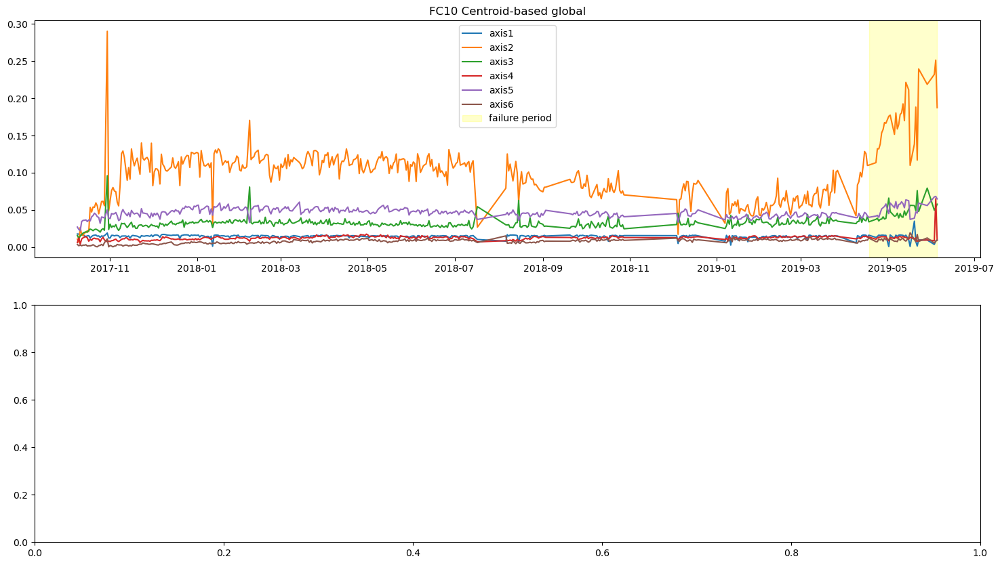

In [343]:
data1 = feature_axis1_FC10
data2 = feature_axis2_FC10
data3 = feature_axis3_FC10
data4 = feature_axis4_FC10
data5 = feature_axis5_FC10
data6 = feature_axis6_FC10
frames_FC10 = [data1, data2, data3, data4, data5, data6]


fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_FC10_Global, FC10_score= plot_distance_global(frames_FC10,20,'FC10 Centroid-based global',ax1,line_FC10)



In [344]:
len(FC10_score)

120

C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of DB-LOF in Moving Average is 1.0
False Postive Rate of DB-LOF in Moving Average is 0.0
Recall of DB-LOF in Moving Average is 0.7666666666666667
Accuracy DB-LOF in Moving Average is 0.9974910394265233
F-score of DB-LOF in Moving Average is 0.8679245283018869


C:\Temp\ipykernel_7300\3104644068.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of DB-LOF in linear Regression is 0.18840579710144928
False Postive Rate of DB-LOF in linear Regression is 0.020289855072463767
Recall of DB-LOF in linear Regression is 0.43333333333333335
Accuracy of DB-LOF in linear Regression is 0.9738351254480286
F-score of DB-LOF in linear Regression is 0.26262626262626265


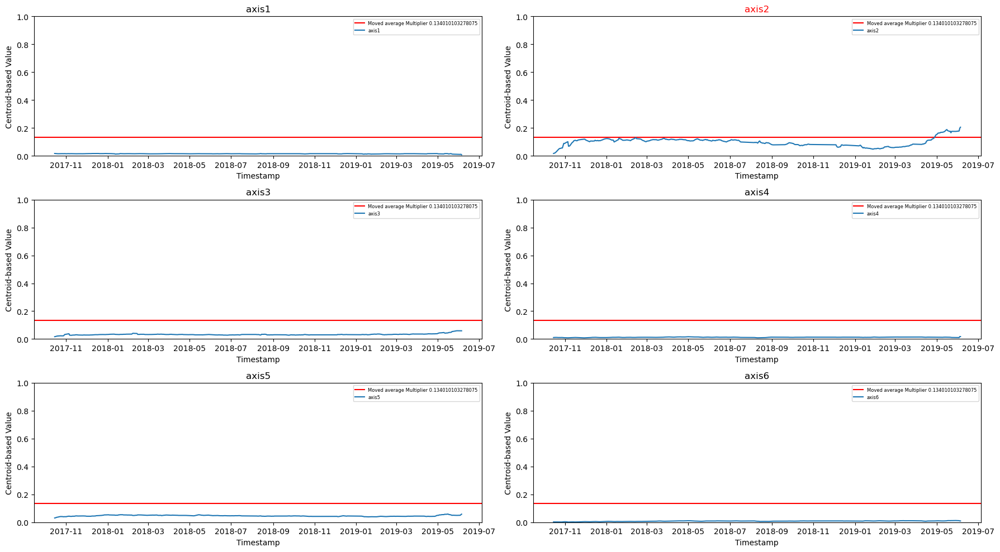

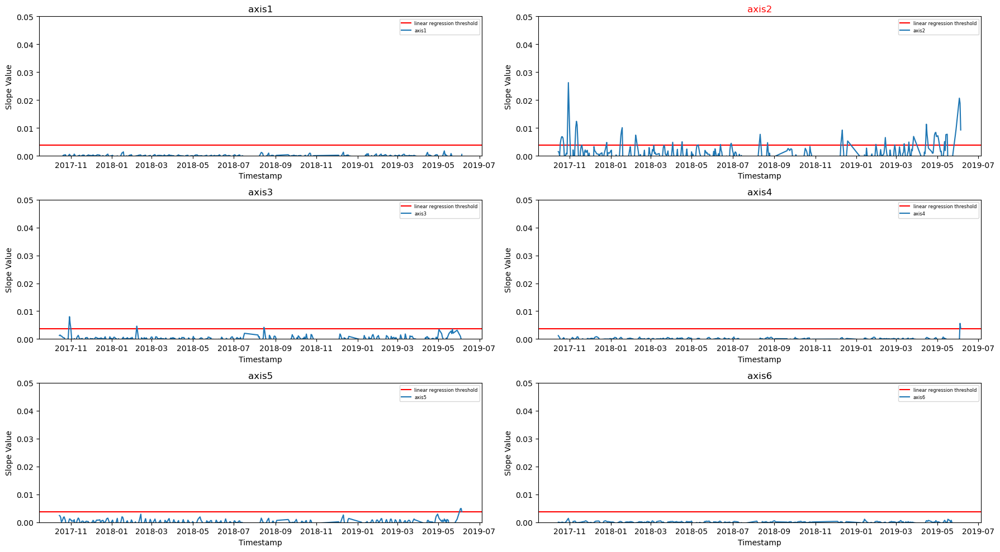

In [347]:
score_FC10_DB_LOF = np.mean(FC10_score)+3*np.std(FC10_score)
metrics_MA(Distance_FC10_Global,'axis2',line_FC10,'DB-LOF',feature_axis1_FC10,2*score_FC10_DB_LOF,20,1)

# linear Regression
Threshold_FC10_CLOF = slope(FC10_score,20)
score_FC10_LR_CLOF = np.mean(Threshold_FC10_CLOF)+3*np.std(Threshold_FC10_CLOF)
metrics_LR(Distance_FC10_Global,'axis2',line_FC10,'DB-LOF',feature_axis1_FC10,2*score_FC10_LR_CLOF,20,0.05)

C:\Users\semihua\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Precision of kMEANS in Moving Average is 1.0
False Postive Rate of kMEANS in Moving Average is 0.0
Recall of kMEANS in Moving Average is 0.7333333333333333
Accuracy kMEANS in Moving Average is 0.9971326164874552
F-score of kMEANS in Moving Average is 0.846153846153846


C:\Temp\ipykernel_7300\4130070220.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


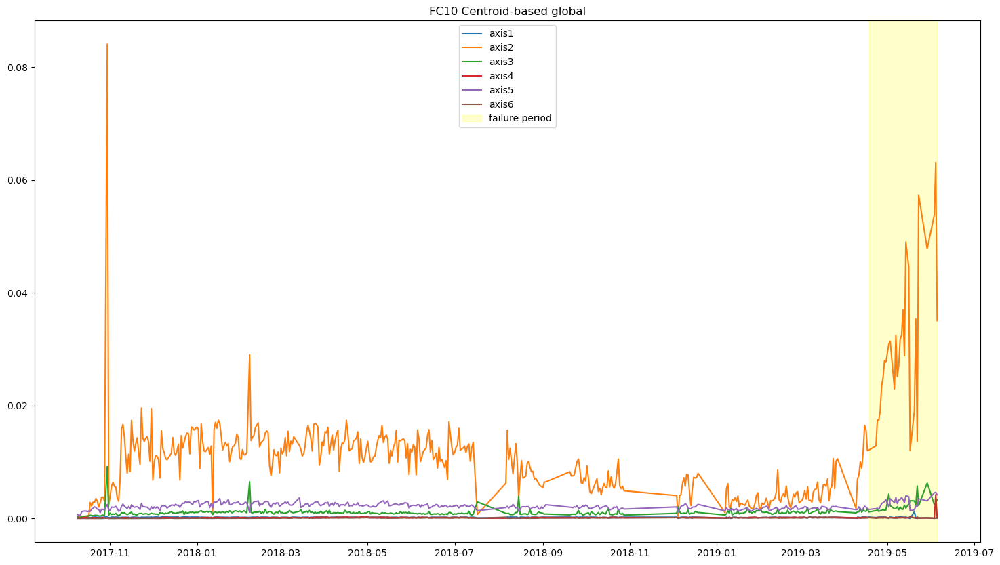

In [88]:
data1 = feature_axis1_FC10
data2 = feature_axis2_FC10
data3 = feature_axis3_FC10
data4 = feature_axis4_FC10
data5 = feature_axis5_FC10
data6 = feature_axis6_FC10
frames_FC10 = [data1, data2, data3, data4, data5, data6]


Kmeans_FC10_Global, KMEANS_score_FC10 = Kmeans(frames_FC10,20,'FC10 Centroid-based global',line_FC10)
Indicators_FC10 = {'K-means':Kmeans_FC10_Global}

metrics_MA(Kmeans_FC10_Global,'axis2',line_FC10,'kMEANS',feature_axis1_FC10,KMEANS_score_FC10,20)


In [ ]:
interact(Moving_Average, Distance_Global=fixed(Distance_based_lof_global_FC10), data = fixed(feature_axis1_FC10), Multiplier=(0.5,2.5, 0.1),failure_axis=fixed('axis2'), ylim = fixed(50));

In [ ]:
interact(Linear_Regression, data = fixed(feature_axis1_FC10), Distance_FCX=fixed(Distance_based_lof_global_FC10), threshold=(0.1,1, 0.1),failure_axis=fixed('axis2'), ylim = fixed(1));

Precision of C-LOF in Moving Average is 0.8571428571428571
False Postive Rate of C-LOF in Moving Average is 0.0014492753623188406
Recall of C-LOF in Moving Average is 0.8
Accuracy C-LOF in Moving Average is 0.996415770609319
F-score of C-LOF in Moving Average is 0.8275862068965518


C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


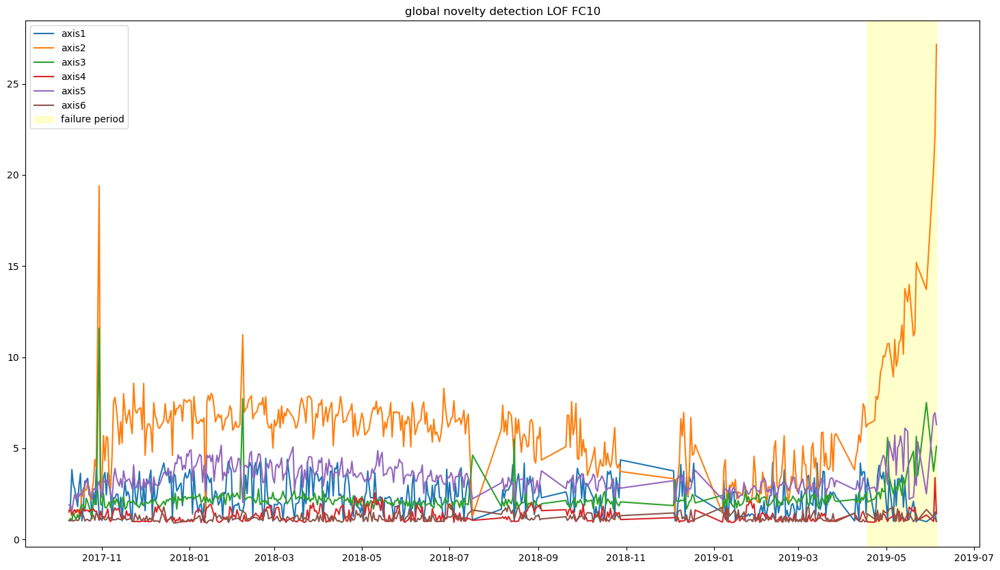

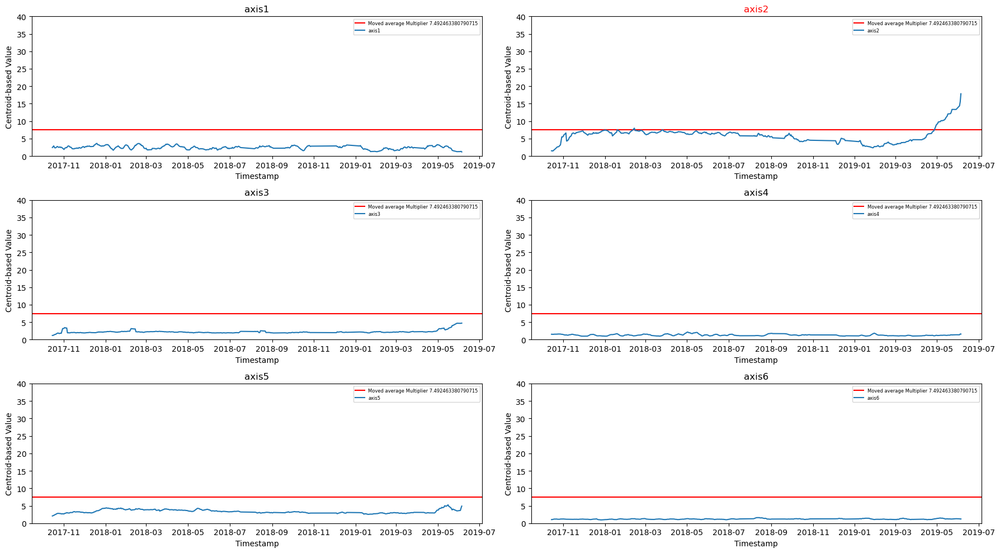

In [253]:
data1 = feature_axis1_FC10
data2 = feature_axis2_FC10
data3 = feature_axis3_FC10
data4 = feature_axis4_FC10
data5 = feature_axis5_FC10
data6 = feature_axis6_FC10
frames_FC10 = [data1, data2, data3, data4, data5, data6]
classic_LOF_global_FC10,score_CLOF_FC10 = classic_LOF(frames_FC10,20,'global novelty detection LOF FC10',line_FC10)
score_FC10_CLOF = np.mean(score_CLOF_FC10)+3*np.std(score_CLOF_FC10)
metrics_MA(classic_LOF_global_FC10,'axis2',line_FC10,'C-LOF',feature_axis1_FC10,3*score_FC10_CLOF,20,40)

In [341]:
len(score_CLOF_FC10)

120

In [ ]:
score_CLOF_FC10

C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of OC-SVM in Moving Average is 1.0
False Postive Rate of OC-SVM in Moving Average is 0.0
Recall of OC-SVM in Moving Average is 0.7333333333333333
Accuracy OC-SVM in Moving Average is 0.9971326164874552
F-score of OC-SVM in Moving Average is 0.846153846153846


C:\Temp\ipykernel_7300\4076685250.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of OC-SVM in linear Regression is 0.011970534069981584
Recall of OC-SVM in linear Regression is 0.8666666666666667
Accuracy of OC-SVM in linear Regression is 0.22438672438672438
F-score of OC-SVM in linear Regression is 0.023614895549500452


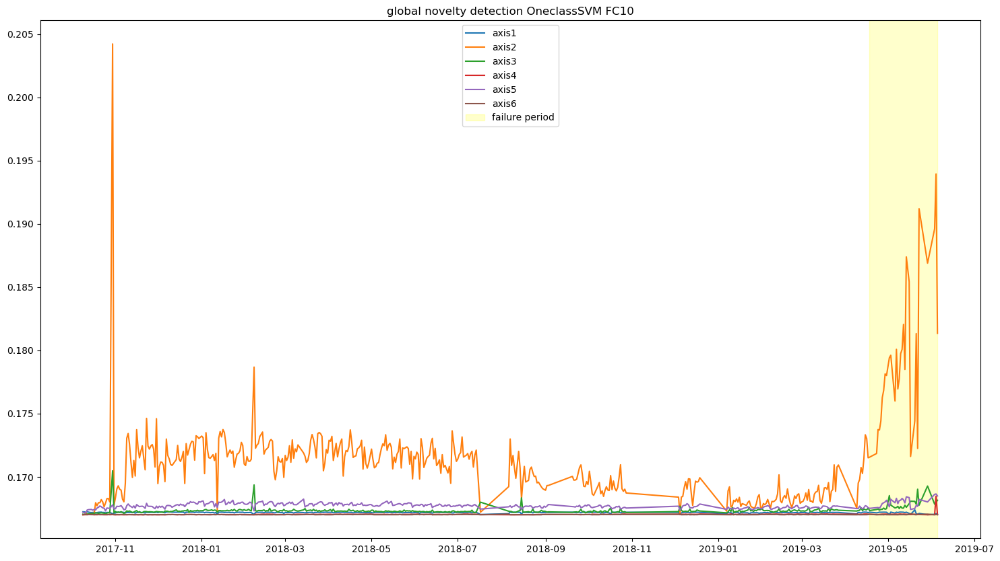

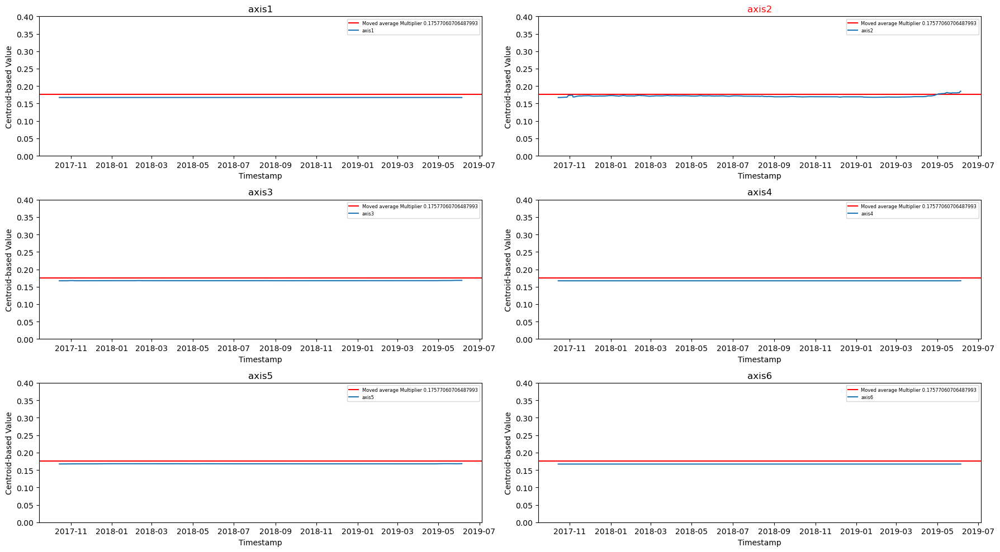

In [296]:
data1 = feature_axis1_FC10
data2 = feature_axis2_FC10
data3 = feature_axis3_FC10
data4 = feature_axis4_FC10
data5 = feature_axis5_FC10
data6 = feature_axis6_FC10
frames_FC10 = [data1, data2, data3, data4, data5, data6]
OneclassSVM_global_FC10,score_FC10 = OneclassSVM(frames_FC10,20,'global novelty detection OneclassSVM FC10',line_FC10)

score_FC10_svm = np.mean(1/score_FC10)+3*np.std(1/score_FC10)

metrics_MA(OneclassSVM_global_FC10,'axis2',line_FC10,'OC-SVM',feature_axis1_FC10,1.05*score_FC10_svm,20,0.4)
metrics_LR(OneclassSVM_global_FC10,'axis2',line_FC10,'OC-SVM',feature_axis1_FC10,1/score_FC10,20)    
    

In [ ]:
data1 = feature_axis1_FC10

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_7 (Dense)             (None, 3)                 12        
                                                                 
 dropout_6 (Dropout)         (None, 3)                 0         
                                                                 
 dense_8 (Dense)             (None, 3)                 12        
                                                                 
 dropout_7 (Dropout)         (None, 3)                 0         
                                                                 
 dense_9 (Dense)             (None, 8)                 32        
                                                                 
 dropout_8 (Dropout)         (None, 8)                 0         
                                                                 
 dense_10 (Dense)            (None, 2)                

Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3202 - val_loss: 1.0428
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3206 - val_loss: 1.0397
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3219 - val_loss: 1.0364
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 1.3080 - val_loss: 1.0332
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.3076 - val_loss: 1.0298
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.3070 - val_loss: 1.0266
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.3018 - val_loss: 1.0235
Epoch 70/100
4/4 [==============================] - 0s 6ms/step - loss: 1.2929 - val_loss: 1.0207
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 1.3055 - val_loss: 1.0178
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2845 - val_loss: 1.0151
Epoch 73/100
4/4 [==

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


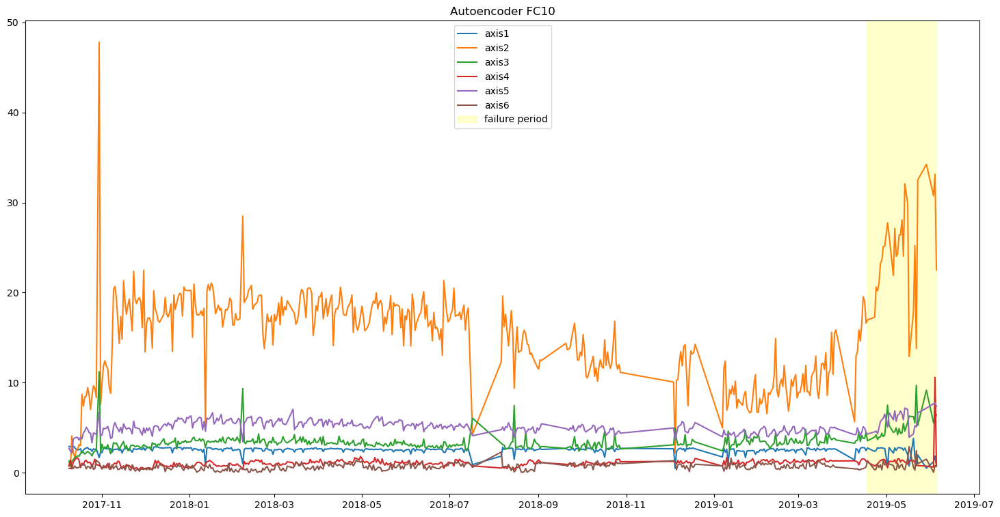

In [93]:
data1 = feature_axis1_FC10
data2 = feature_axis2_FC10
data3 = feature_axis3_FC10
data4 = feature_axis4_FC10
data5 = feature_axis5_FC10
data6 = feature_axis6_FC10
frames = [data1, data2, data3, data4, data5, data6]
Autoencoder_FC10, score_auto_FC10 = autoencoder(frames,'Autoencoder FC10',20,line_FC10)

Evalutation metrics for FC10


C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of Autoencoder in Moving Average is 0.14
False Postive Rate of Autoencoder in Moving Average is 0.06231884057971015
Recall of Autoencoder in Moving Average is 0.9333333333333333
Accuracy Autoencoder in Moving Average is 0.9376344086021505
F-score of Autoencoder in Moving Average is 0.24347826086956526


C:\Temp\ipykernel_7300\4076685250.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of Autoencoder in linear Regression is 0.012013455069678039
Recall of Autoencoder in linear Regression is 0.8333333333333334
Accuracy of Autoencoder in linear Regression is 0.2564935064935065
F-score of Autoencoder in linear Regression is 0.023685457129322594


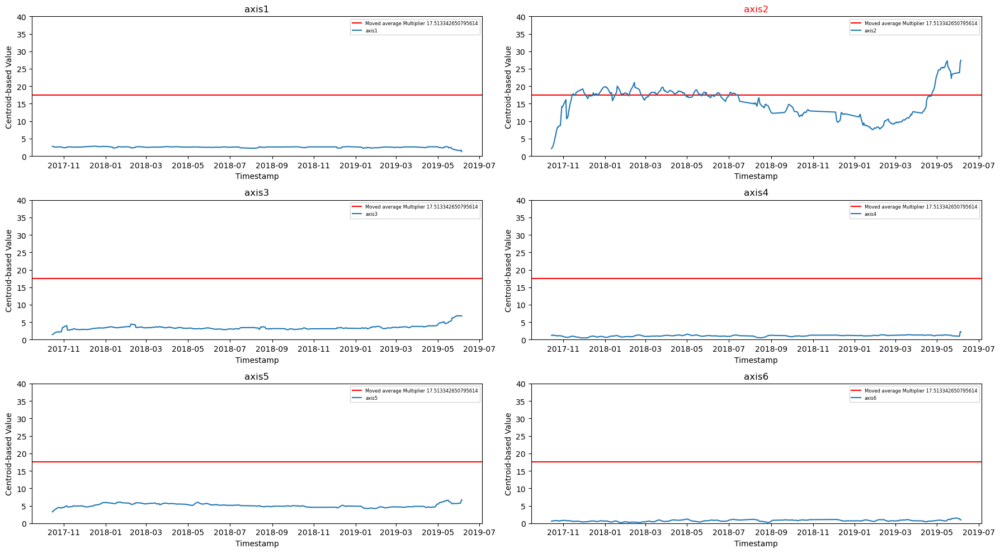

In [302]:
score_FC10_autoencoder = np.mean(score_auto_FC10)+3*np.std(score_auto_FC10)
print('Evalutation metrics for FC10')
metrics_MA(Autoencoder_FC10,'axis2',line_FC10,'Autoencoder',feature_axis1_FC10,4*score_FC10_autoencoder,20,40)
metrics_LR(Autoencoder_FC10,'axis2',line_FC10,'Autoencoder',feature_axis1_FC10,score_auto_FC10,20) 



In [165]:
feature_axis1_FC1 = pd.concat([RMS_Value_FC1['axis1'],Stv_FC1['axis1'],torque_areaUnderSignal_FC1['axis1']],axis=1)
feature_axis1_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis1_FC6 = pd.concat([RMS_Value_FC6['axis1'],Stv_FC6['axis1'],torque_areaUnderSignal_FC6['axis1']],axis=1)
feature_axis1_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC1 = pd.concat([RMS_Value_FC1['axis2'],Stv_FC1['axis2'],torque_areaUnderSignal_FC1['axis2']],axis=1)
feature_axis2_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC6 = pd.concat([RMS_Value_FC6['axis2'],Stv_FC6['axis2'],torque_areaUnderSignal_FC6['axis2']],axis=1)
feature_axis2_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC1 = pd.concat([RMS_Value_FC1['axis3'],Stv_FC1['axis3'],torque_areaUnderSignal_FC1['axis3']],axis=1)
feature_axis3_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC6 = pd.concat([RMS_Value_FC6['axis3'],Stv_FC6['axis3'],torque_areaUnderSignal_FC6['axis3']],axis=1)
feature_axis3_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC1 = pd.concat([RMS_Value_FC1['axis4'],Stv_FC1['axis4'],torque_areaUnderSignal_FC1['axis4']],axis=1)
feature_axis4_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC6 = pd.concat([RMS_Value_FC6['axis4'],Stv_FC6['axis4'],torque_areaUnderSignal_FC6['axis4']],axis=1)
feature_axis4_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC1 = pd.concat([RMS_Value_FC1['axis5'],Stv_FC1['axis5'],torque_areaUnderSignal_FC1['axis5']],axis=1)
feature_axis5_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC6 = pd.concat([RMS_Value_FC6['axis6'],Stv_FC6['axis5'],torque_areaUnderSignal_FC6['axis5']],axis=1)
feature_axis5_FC6.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC1 = pd.concat([RMS_Value_FC1['axis6'],Stv_FC1['axis6'],torque_areaUnderSignal_FC1['axis6']],axis=1)
feature_axis6_FC1.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC6 = pd.concat([RMS_Value_FC6['axis6'],Stv_FC6['axis6'],torque_areaUnderSignal_FC6['axis6']],axis=1)
feature_axis6_FC6.columns = ['RMS','Stv','areaUnderSignal']

# Centroid-based

In [ ]:
line_FC1 = [date(2016, 5, 6),date(2016, 6, 15)]
line_FC6 = [date(2016, 10, 1),date(2017, 2, 4)]


In [ ]:

data1 = feature_axis1_FC1
data2 = feature_axis2_FC1
data3 = feature_axis3_FC1
data4 = feature_axis4_FC1
data5 = feature_axis5_FC1
data6 = feature_axis6_FC1
frames_FC1 = [data1, data2, data3, data4, data5, data6]

fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_FC1_Global = plot_distance_global(frames_FC1,10,'FC1 Centroid-based global',ax1,line_FC1)

Distance_FC1_Local = plot_distance_local(frames_FC1,10, 'FC1 Centroid-based local',ax2,line_FC1)

In [ ]:
data1 = feature_axis1_FC1
data2 = feature_axis2_FC1
data3 = feature_axis3_FC1
data4 = feature_axis4_FC1
data5 = feature_axis5_FC1
data6 = feature_axis6_FC1
frames_FC1 = [data1, data2, data3, data4, data5, data6]

Kmeans_FC1_Global, KMEANS_score_FC1 = Kmeans(frames_FC1,20,'FC1 k-MEANS global',line_FC1)
MA_fc1 = Moving_Average(Kmeans_FC1_Global,'axis2',0.1,0.1,0.02*KMEANS_score_FC1,20)
Indicators_FC1 = {'K-means':Kmeans_FC1_Global}
for n, (fc, indicator) in enumerate(Indicators_FC1.items()):
    TPR_dict_FC1_MA[fc],FPR_dict_FC1_MA[fc],Precision_dict_FC1_MA[fc] = Average_unsupervised(indicator,'axis2',line_FC1,fc,feature_axis1_FC1,0.01*KMEANS_score_FC1,20)
    F1_score_dict_FC1_MA[fc] = F1_score(Precision_dict_FC1_MA[fc],TPR_dict_FC1_MA[fc])
    print(f"Precision of {fc} in Moving Average is {Precision_dict_FC1_MA[fc]}")
    print(f"Recall of {fc} in Moving Average is {TPR_dict_FC1_MA[fc]}")
    print(f"F-score of {fc} in Moving Average is {F1_score_dict_FC1_MA[fc]}")

In [ ]:
KMEANS_score_FC1

In [ ]:
KMEANS_score_FC1

In [ ]:

interact(Linear_Regression, data = fixed(feature_axis1_FC1), Distance_FCX=fixed(Distance_FC1_Global), threshold=(-0.005,0.1, 0.01),failure_axis=fixed('axis2'), ylim = fixed(0.1));

# distance_based LOF

In [ ]:
interact(Linear_Regression, data = fixed(feature_axis1_FC1), Distance_FCX=fixed(Distance_based_lof_global_FC1), threshold=(-0.005,0.5, 0.01),failure_axis=fixed('axis2'), ylim = fixed(0.1));

In [ ]:
interact(Moving_Average, Distance_Global=fixed(Distance_based_lof_global_FC1), data = fixed(feature_axis1_FC1), Multiplier=(-2.5,5, 0.01),failure_axis=fixed('axis2'), ylim = fixed(10));

Precision of C-LOF in Moving Average is 0.0050062578222778474
False Postive Rate of C-LOF in Moving Average is 0.6073338426279603
Recall of C-LOF in Moving Average is 0.8
Accuracy C-LOF in Moving Average is 0.3942161339421613
F-score of C-LOF in Moving Average is 0.009950248756218907


C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


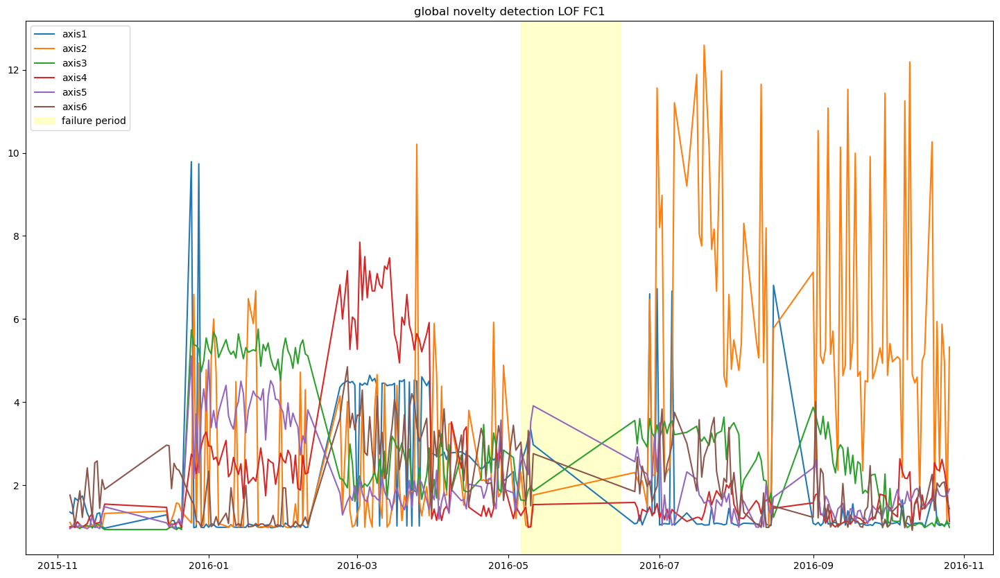

In [167]:
data1 = feature_axis1_FC1
data2 = feature_axis2_FC1
data3 = feature_axis3_FC1
data4 = feature_axis4_FC1
data5 = feature_axis5_FC1
data6 = feature_axis6_FC1
frames_FC1 = [data1, data2, data3, data4, data5, data6]
classic_LOF_global_FC1, score_CLOF_FC1 = classic_LOF(frames_FC1,10,'global novelty detection LOF FC1',line_FC1)
score_FC1_CLOF = np.mean(score_CLOF_FC1)+3*np.std(score_CLOF_FC1)
metrics_MA(classic_LOF_global_FC1,'axis2',line_FC1,'C-LOF',feature_axis1_FC1,score_FC1_CLOF,10)

In [ ]:
score_LOF_FC1

Precision of OC-SVM in Moving Average is 0.0
False Postive Rate of OC-SVM in Moving Average is 0.012223071046600458
Recall of OC-SVM in Moving Average is 0.0
Accuracy OC-SVM in Moving Average is 0.9840182648401826
F-score of OC-SVM in Moving Average is nan


C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1
C:\Temp\ipykernel_7300\3546381818.py:2: RuntimeWarning: invalid value encountered in double_scalars
  F1_score = 2*np.multiply(precision,recall)/(np.add(precision , recall))


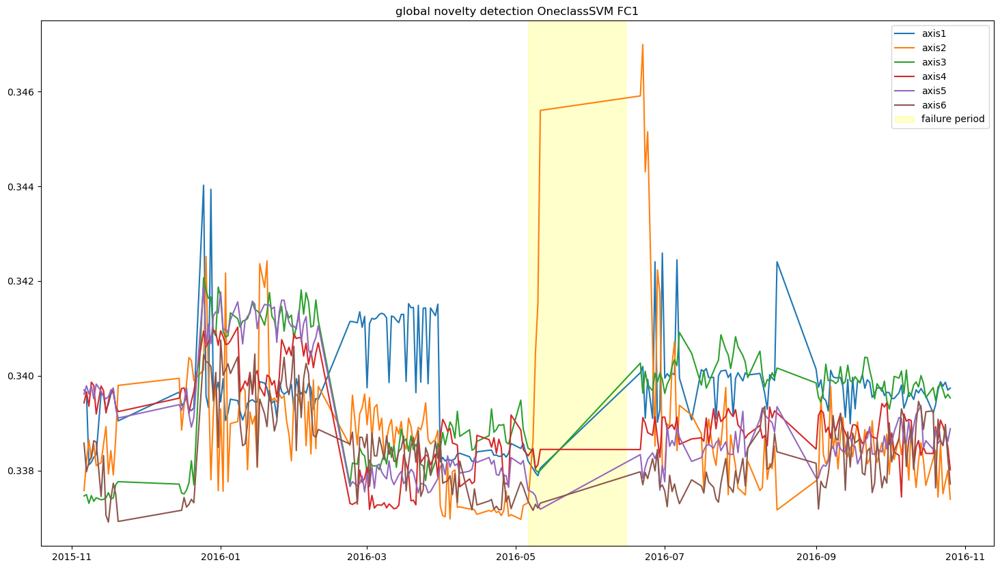

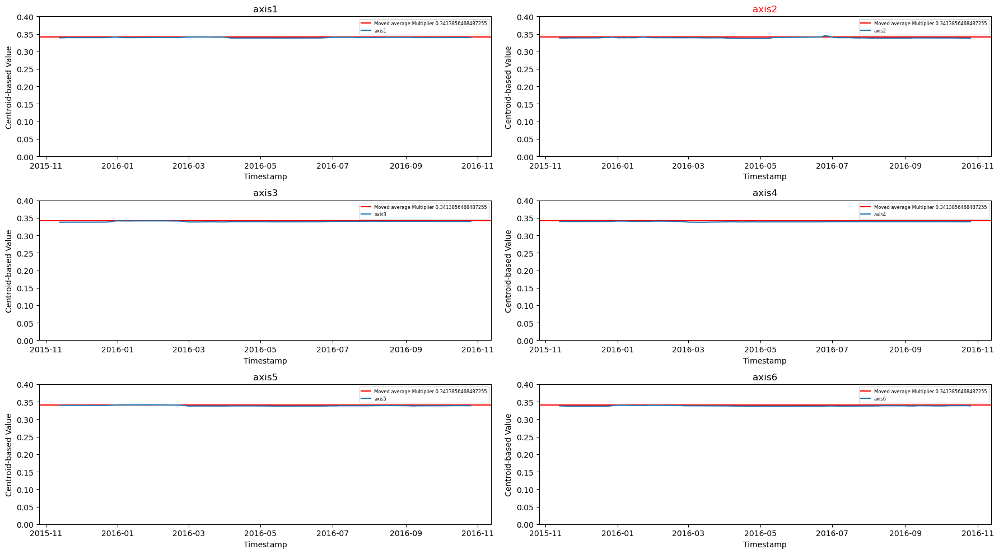

In [245]:
data1 = feature_axis1_FC1
data2 = feature_axis2_FC1
data3 = feature_axis3_FC1
data4 = feature_axis4_FC1
data5 = feature_axis5_FC1
data6 = feature_axis6_FC1
frames_FC1 = [data1, data2, data3, data4, data5, data6]
OneclassSVM_global_FC1,score_SVM_FC1 = OneclassSVM(frames_FC1,10,'global novelty detection OneclassSVM FC1',line_FC1)
score_FC1_svm = np.mean(1/score_SVM_FC1)+3*np.std(1/score_SVM_FC1)
metrics_MA(OneclassSVM_global_FC1,'axis2',line_FC1,'OC-SVM',feature_axis1_FC1,score_FC1_svm,10,0.4)


In [172]:
score_FC1_svm

0.3397757888035678

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_28 (Dense)            (None, 3)                 12        
                                                                 
 dropout_24 (Dropout)        (None, 3)                 0         
                                                                 
 dense_29 (Dense)            (None, 3)                 12        
                                                                 
 dropout_25 (Dropout)        (None, 3)                 0         
                                                                 
 dense_30 (Dense)            (None, 8)                 32        
                                                                 
 dropout_26 (Dropout)        (None, 8)                 0         
                                                                 
 dense_31 (Dense)            (None, 2)                

Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 1.3538 - val_loss: 1.2417
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.3682 - val_loss: 1.2396
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3561 - val_loss: 1.2374
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3522 - val_loss: 1.2350
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3470 - val_loss: 1.2325
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3454 - val_loss: 1.2302
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3479 - val_loss: 1.2276
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3421 - val_loss: 1.2247
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3309 - val_loss: 1.2222
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3358 - val_loss: 1.2200
Epoch 73/100
4/4 [==

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


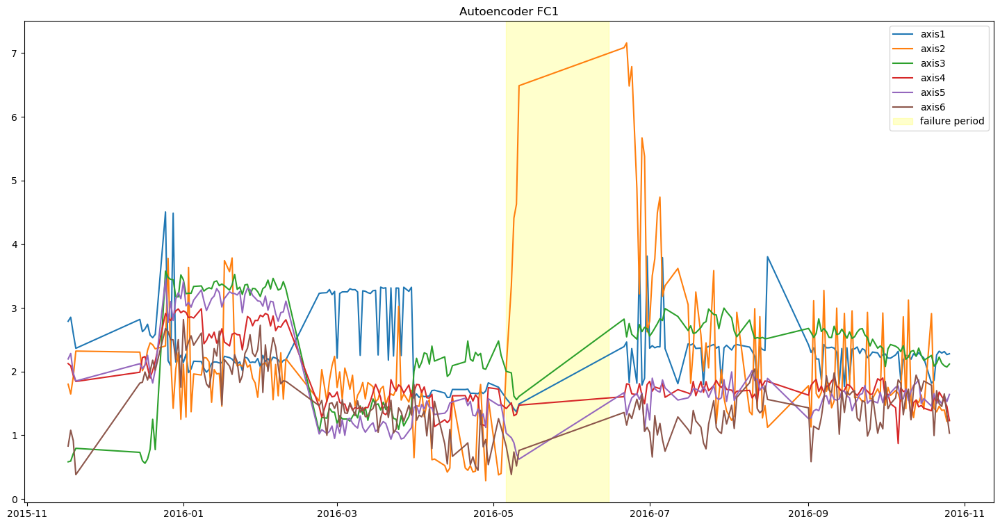

In [191]:
data1 = feature_axis1_FC1
data2 = feature_axis2_FC1
data3 = feature_axis3_FC1
data4 = feature_axis4_FC1
data5 = feature_axis5_FC1
data6 = feature_axis6_FC1
frames = [data1, data2, data3, data4, data5, data6]
Autoencoder_FC1,score_auto_FC1 = autoencoder(frames,'Autoencoder FC1',20,line_FC1)

In [193]:
score_FC1_autoencoder = np.mean(score_auto_FC1)+3*np.std(score_auto_FC1)
metrics_MA(Autoencoder_FC1,'axis2',line_FC1,'Autoencoder',feature_axis1_FC1,score_FC1_autoencoder,20)
metrics_LR(Autoencoder_FC1,'axis2',line_FC1,'Autoencoder',feature_axis1_FC1,score_auto_FC1,20)

C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1
C:\Temp\ipykernel_7300\3546381818.py:2: RuntimeWarning: invalid value encountered in double_scalars
  F1_score = 2*np.multiply(precision,recall)/(np.add(precision , recall))


Precision of Autoencoder in Moving Average is 0.0
False Postive Rate of Autoencoder in Moving Average is 0.010408326661329063
Recall of Autoencoder in Moving Average is 0.0
Accuracy Autoencoder in Moving Average is 0.9856459330143541
F-score of Autoencoder in Moving Average is nan
Precision of Autoencoder in linear Regression is 0.006587615283267457
Recall of Autoencoder in linear Regression is 1.0
Accuracy of Autoencoder in linear Regression is 0.38996763754045305
F-score of Autoencoder in linear Regression is 0.013089005235602092


C:\Temp\ipykernel_7300\4076685250.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


In [183]:
score_FC1_autoencoder 

3.732731356241289

In [ ]:
fig, ax = plt.subplots(1, figsize=(10,10))

Indicators_FC1 = {'Centroid':Distance_FC1_Global, 'DB_LOF': Distance_based_lof_global_FC1, 'C_LOF':classic_LOF_global_FC1, 'O_SVM':OneclassSVM_global_FC1, 'Autoencoder':Autoencoder_FC1}
TPR_dict_FC1_MA = {}
FPR_dict_FC1_MA = {}
Precision_dict_FC1_MA = {}
for n, (fc, indicator) in enumerate(Indicators_FC1.items()):
    TPR_dict_FC1_MA[fc],FPR_dict_FC1_MA[fc],Precision_dict_FC1_MA[fc] = ROC_Curve_Average(indicator,'axis2',line_FC1,fc,feature_axis1_FC1)
    
ax.set_xlim(-0.1,1.1)
ax.set_ylim(-0.1,1.1)
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.legend()

In [ ]:

TPR_dict_FC1_LR = {}
FPR_dict_FC1_LR = {}
Precision_dict_FC1_LR = {}

for n, (fc, indicator) in enumerate(Indicators_FC1.items()):
    TPR_dict_FC1_LR[fc],FPR_dict_FC1_LR[fc],Precision_dict_FC1_LR[fc] = ROC_Curve_LR(indicator,'axis2',line_FC1,fc,feature_axis1_FC1)
    

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()

In [ ]:
plt.plot(FPR_dict_FC1_MA['DB_LOF'],TPR_dict_FC1_MA['DB_LOF'])


In [ ]:
data1 = feature_axis1_FC6
data2 = feature_axis2_FC6
data3 = feature_axis3_FC6
data4 = feature_axis4_FC6
data5 = feature_axis5_FC6
data6 = feature_axis6_FC6
frames_FC6 = [data1, data2, data3, data4, data5, data6]

fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_FC6_Global = plot_distance_global(frames_FC6,10,'FC6 Centroid-based global',ax1,line_FC6)
Distance_FC6_Local = plot_distance_local(frames_FC6,10, 'FC6 Centroid-based local',ax2,line_FC6)

In [ ]:
data1 = feature_axis1_FC6
data2 = feature_axis2_FC6
data3 = feature_axis3_FC6
data4 = feature_axis4_FC6
data5 = feature_axis5_FC6
data6 = feature_axis6_FC6
frames_FC6 = [data1, data2, data3, data4, data5, data6]
fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_based_lof_global_FC6 = Distance_based_lof_global(frames_FC6,10,'global distance_based LOF FC6',ax1,line_FC6)
Distance_based_lof_local(frames_FC6,10,'local distance_based LOF FC6',ax2,line_FC6)

In [ ]:
data1 = feature_axis1_FC6
data2 = feature_axis2_FC6
data3 = feature_axis3_FC6
data4 = feature_axis4_FC6
data5 = feature_axis5_FC6
data6 = feature_axis6_FC6
frames_FC6 = [data1, data2, data3, data4, data5, data6]
Kmeans_FC6_Global, KMEANS_score_FC6 = Kmeans(frames_FC6,10,'FC1 k-MEANS global',line_FC6)
metrics_MA(Kmeans_FC6_Global,'axis4',line_FC6,'KMEANS',feature_axis1_FC6,2*KMEANS_score_FC6,10)


C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of C-LOF in Moving Average is 0.06382978723404255
False Postive Rate of C-LOF in Moving Average is 0.35772357723577236
Recall of C-LOF in Moving Average is 1.0
Accuracy C-LOF in Moving Average is 0.6507936507936508
F-score of C-LOF in Moving Average is 0.12


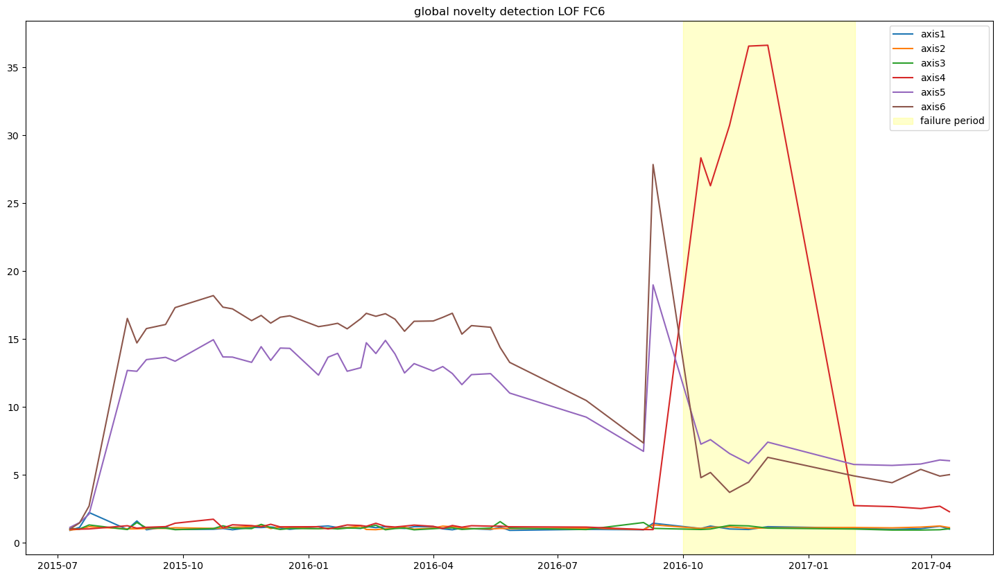

In [176]:
data1 = feature_axis1_FC6
data2 = feature_axis2_FC6
data3 = feature_axis3_FC6
data4 = feature_axis4_FC6
data5 = feature_axis5_FC6
data6 = feature_axis6_FC6
frames_FC6 = [data1, data2, data3, data4, data5, data6]
classic_LOF_global_FC6,score_CLOF_FC6 = classic_LOF(frames_FC6,10,'global novelty detection LOF FC6',line_FC6)
score_FC6_CLOF = np.mean(score_CLOF_FC6)+3*np.std(score_CLOF_FC6)

metrics_MA(classic_LOF_global_FC6,'axis4',line_FC6,'C-LOF',feature_axis1_FC6,score_FC6_CLOF,10)

In [ ]:
interact(Linear_Regression, data = fixed(feature_axis1_FC6), Distance_FCX=fixed(classic_LOF_global_FC6), threshold=(-0.005,0.5, 0.01),failure_axis=fixed('axis2'), ylim = fixed(0.1));

# Local Outlier Factor

C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1
C:\Temp\ipykernel_7300\4076685250.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of OC-SVM in Moving Average is 0.5555555555555556
False Postive Rate of OC-SVM in Moving Average is 0.021505376344086023
Recall of OC-SVM in Moving Average is 0.8333333333333334
Accuracy OC-SVM in Moving Average is 0.9739583333333334
F-score of OC-SVM in Moving Average is 0.6666666666666667
Precision of OC-SVM in linear Regression is 0.0821917808219178
Recall of OC-SVM in linear Regression is 1.0
Accuracy of OC-SVM in linear Regression is 0.6149425287356322
F-score of OC-SVM in linear Regression is 0.1518987341772152


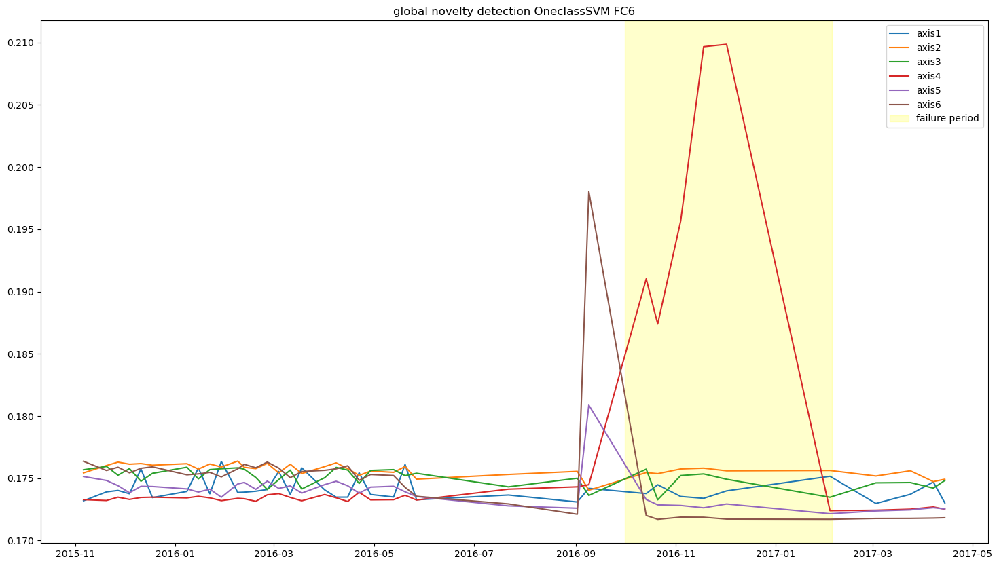

In [174]:
data1 = feature_axis1_FC6
data2 = feature_axis2_FC6
data3 = feature_axis3_FC6
data4 = feature_axis4_FC6
data5 = feature_axis5_FC6
data6 = feature_axis6_FC6
frames_FC6 = [data1, data2, data3, data4, data5, data6]
OneclassSVM_global_FC6, score_FC6 = OneclassSVM(frames_FC6,20,'global novelty detection OneclassSVM FC6',line_FC6)
score_FC6_svm = np.mean(1/score_FC6)+3*np.std(1/score_FC6)
metrics_MA(OneclassSVM_global_FC6,'axis4',line_FC6,'OC-SVM',feature_axis1_FC6,score_FC6_svm,20)
metrics_LR(OneclassSVM_global_FC6,'axis4',line_FC6,'OC-SVM',feature_axis1_FC6,1/score_FC6,20)
    
    

In [ ]:
score_FC6_svm

# Autoencoder

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_14 (Dense)            (None, 3)                 12        
                                                                 
 dropout_12 (Dropout)        (None, 3)                 0         
                                                                 
 dense_15 (Dense)            (None, 3)                 12        
                                                                 
 dropout_13 (Dropout)        (None, 3)                 0         
                                                                 
 dense_16 (Dense)            (None, 8)                 32        
                                                                 
 dropout_14 (Dropout)        (None, 8)                 0         
                                                                 
 dense_17 (Dense)            (None, 2)                

Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3021 - val_loss: 1.4227
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2995 - val_loss: 1.4198
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2971 - val_loss: 1.4168
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2984 - val_loss: 1.4139
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2944 - val_loss: 1.4110
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2994 - val_loss: 1.4086
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2903 - val_loss: 1.4063
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2911 - val_loss: 1.4039
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2837 - val_loss: 1.4015
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2859 - val_loss: 1.3990
Epoch 73/100
4/4 [==

1/1 [==============================] - 0s 16ms/step


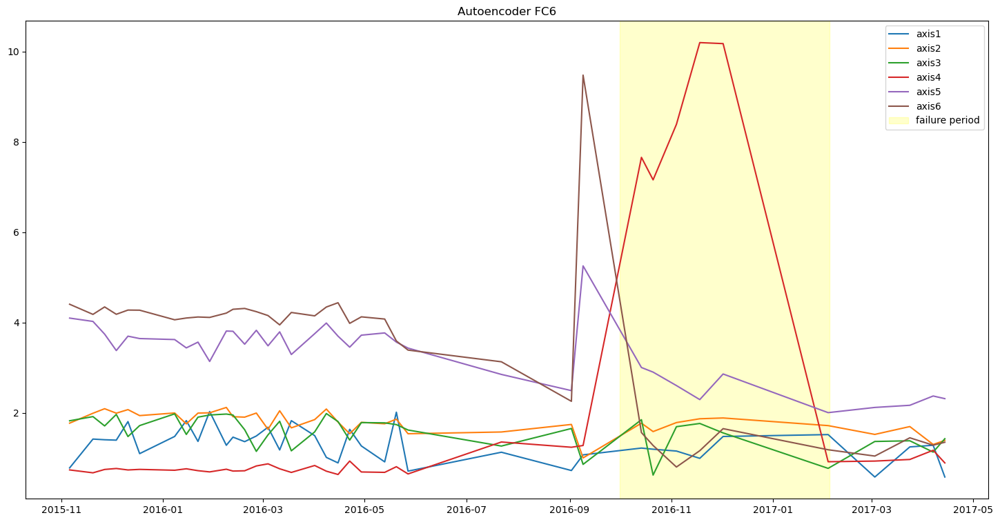

In [177]:
data1 = feature_axis1_FC6
data2 = feature_axis2_FC6
data3 = feature_axis3_FC6
data4 = feature_axis4_FC6
data5 = feature_axis5_FC6
data6 = feature_axis6_FC6
frames = [data1, data2, data3, data4, data5, data6]
Autoencoder_FC6,score_auto_FC6 = autoencoder(frames,'Autoencoder FC6',20,line_FC6)

In [178]:
score_FC6_autoencoder = np.mean(score_auto_FC6)+3*np.std(score_auto_FC6)
metrics_MA(Autoencoder_FC6,'axis4',line_FC6,'Autoencoder',feature_axis1_FC6,score_FC6_autoencoder,20)
metrics_LR(Autoencoder_FC6,'axis4',line_FC6,'Autoencoder',feature_axis1_FC6,score_auto_FC6,20)

Precision of Autoencoder in Moving Average is 0.5
False Postive Rate of Autoencoder in Moving Average is 0.016129032258064516
Recall of Autoencoder in Moving Average is 0.5
Accuracy Autoencoder in Moving Average is 0.96875
F-score of Autoencoder in Moving Average is 0.5
Precision of Autoencoder in linear Regression is 0.24
Recall of Autoencoder in linear Regression is 1.0
Accuracy of Autoencoder in linear Regression is 0.8908045977011494
F-score of Autoencoder in linear Regression is 0.3870967741935484


C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1
C:\Temp\ipykernel_7300\4076685250.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


In [97]:
feature_axis1_FC7 = pd.concat([RMS_Value_FC7['axis1'],Stv_FC7['axis1'],torque_areaUnderSignal_FC7['axis1']],axis=1)
feature_axis1_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis1_FC8 = pd.concat([RMS_Value_FC8['axis1'],Stv_FC8['axis1'],torque_areaUnderSignal_FC8['axis1']],axis=1)
feature_axis1_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC7 = pd.concat([RMS_Value_FC7['axis2'],Stv_FC7['axis2'],torque_areaUnderSignal_FC7['axis2']],axis=1)
feature_axis2_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC8 = pd.concat([RMS_Value_FC8['axis2'],Stv_FC8['axis2'],torque_areaUnderSignal_FC8['axis2']],axis=1)
feature_axis2_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC7 = pd.concat([RMS_Value_FC7['axis3'],Stv_FC7['axis3'],torque_areaUnderSignal_FC7['axis3']],axis=1)
feature_axis3_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC8 = pd.concat([RMS_Value_FC8['axis3'],Stv_FC8['axis3'],torque_areaUnderSignal_FC8['axis3']],axis=1)
feature_axis3_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC7 = pd.concat([RMS_Value_FC7['axis4'],Stv_FC7['axis4'],torque_areaUnderSignal_FC7['axis4']],axis=1)
feature_axis4_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC8 = pd.concat([RMS_Value_FC8['axis4'],Stv_FC8['axis4'],torque_areaUnderSignal_FC8['axis4']],axis=1)
feature_axis4_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC7 = pd.concat([RMS_Value_FC7['axis5'],Stv_FC7['axis5'],torque_areaUnderSignal_FC7['axis5']],axis=1)
feature_axis5_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC8 = pd.concat([RMS_Value_FC8['axis5'],Stv_FC8['axis5'],torque_areaUnderSignal_FC8['axis5']],axis=1)
feature_axis5_FC8.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC7 = pd.concat([RMS_Value_FC7['axis6'],Stv_FC7['axis6'],torque_areaUnderSignal_FC7['axis6']],axis=1)
feature_axis6_FC7.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC8 = pd.concat([RMS_Value_FC8['axis6'],Stv_FC8['axis6'],torque_areaUnderSignal_FC8['axis6']],axis=1)
feature_axis6_FC8.columns = ['RMS','Stv','areaUnderSignal']

In [114]:
line_FC7 = [date(2017, 4, 22),date(2017, 4, 26)]
line_FC8 = [date(2016, 12, 1),date(2016, 12, 23)]


In [ ]:
data1 = feature_axis1_FC7
data2 = feature_axis2_FC7
data3 = feature_axis3_FC7
data4 = feature_axis4_FC7
data5 = feature_axis5_FC7
data6 = feature_axis6_FC7
frames_FC7 = [data1, data2, data3, data4, data5, data6]

fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_FC7_Global = plot_distance_global(frames_FC7,10,'FC7 Centroid-based global',ax1,line_FC7)

Distance_FC7_local = plot_distance_local(frames_FC7,10, 'FC7 Centroid-based local',ax2,line_FC7)

In [ ]:
data1 = feature_axis1_FC7
data2 = feature_axis2_FC7
data3 = feature_axis3_FC7
data4 = feature_axis4_FC7
data5 = feature_axis5_FC7
data6 = feature_axis6_FC7
frames_FC7 = [data1, data2, data3, data4, data5, data6]
Kmeans_FC7_Global, KMEANS_score_FC7 = Kmeans(frames_FC7,10,'FC1 k-MEANS global',line_FC7)
metrics_MA(Kmeans_FC7_Global,'axis2',line_FC7,'KMEANS',feature_axis1_FC7,0.01*KMEANS_score_FC7,10)

In [ ]:
KMEANS_score_FC7 

In [ ]:
data1 = feature_axis1_FC7
data2 = feature_axis2_FC7
data3 = feature_axis3_FC7
data4 = feature_axis4_FC7
data5 = feature_axis5_FC7
data6 = feature_axis6_FC7
frames_FC7 = [data1, data2, data3, data4, data5, data6]
fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_based_lof_global_FC7 = Distance_based_lof_global(frames_FC7,10,'global distance_based LOF FC7',ax1,line_FC7)
Distance_based_lof_local(frames_FC7,10,'local distance_based LOF FC7',ax2,line_FC7)

In [ ]:
data1 = feature_axis1_FC7
data2 = feature_axis2_FC7
data3 = feature_axis3_FC7
data4 = feature_axis4_FC7
data5 = feature_axis5_FC7
data6 = feature_axis6_FC7
frames_FC7 = [data1, data2, data3, data4, data5, data6]
classic_LOF_global_FC7 = classic_LOF(frames_FC7,10,'global novelty detection LOF FC7',line_FC7)

In [ ]:
interact(Moving_Average, Distance_Global=fixed(classic_LOF_global_FC7), data = fixed(feature_axis1_FC7), Multiplier=(0.5,2.5, 0.1),failure_axis=fixed('axis2'), ylim = fixed(10));

C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of OC-SVM in Moving Average is 0.004528985507246377
False Postive Rate of OC-SVM in Moving Average is 1.0
Recall of OC-SVM in Moving Average is 1.0
Accuracy OC-SVM in Moving Average is 0.004528985507246377
F-score of OC-SVM in Moving Average is 0.009017132551848512
Precision of OC-SVM in linear Regression is 0.00303951367781155
Recall of OC-SVM in linear Regression is 0.6
Accuracy of OC-SVM in linear Regression is 0.09208103130755065
F-score of OC-SVM in linear Regression is 0.006048387096774193


C:\Temp\ipykernel_7300\4076685250.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


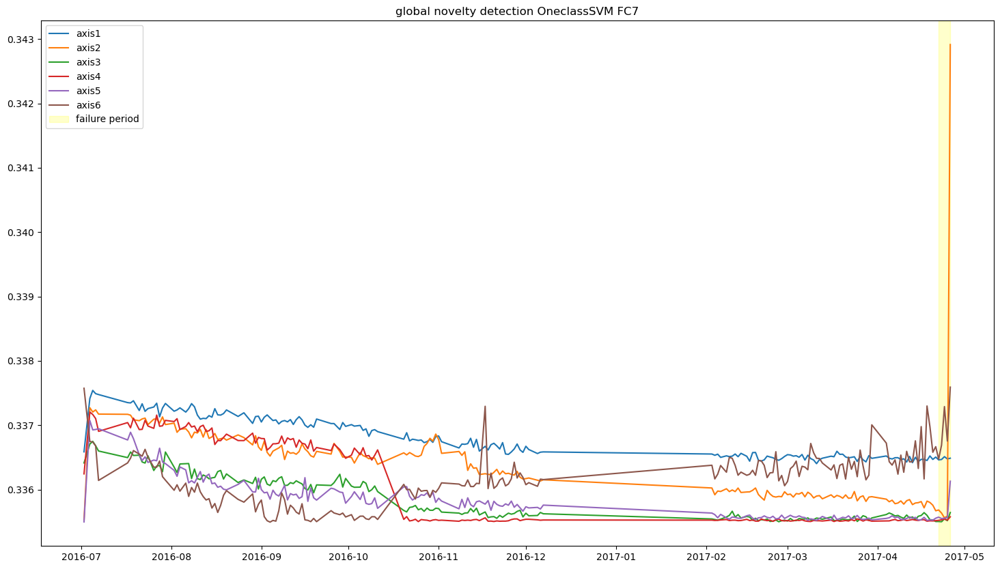

In [155]:
data1 = feature_axis1_FC7
data2 = feature_axis2_FC7
data3 = feature_axis3_FC7
data4 = feature_axis4_FC7
data5 = feature_axis5_FC7
data6 = feature_axis6_FC7
frames_FC7 = [data1, data2, data3, data4, data5, data6]
OneclassSVM_global_FC7, score_FC7 = OneclassSVM(frames_FC7,10,'global novelty detection OneclassSVM FC7',line_FC7)
score_FC7_svm = np.mean(1/score_FC7)+3*np.std(1/score_FC7)
   
    

metrics_MA(OneclassSVM_global_FC7,'axis2',line_FC7,'OC-SVM',feature_axis1_FC7,0.9*score_FC7_svm,10)
metrics_LR(OneclassSVM_global_FC7,'axis2',line_FC7,'OC-SVM',feature_axis1_FC7,1/score_FC7,10)

In [128]:

# set the max columns to none
pd.set_option('display.max_columns', None)
type(p)

pandas.core.series.Series

In [99]:
score_FC7_svm 

0.16917404137019282

In [150]:
metrics_MA(OneclassSVM_global_FC7,'axis2',line_FC7,'OC-SVM',feature_axis1_FC7,score_FC7_svm,20)

               axis1  class
time                       
2016-07-30  0.168648      0
2016-08-02  0.168648      0
2016-08-03  0.168646      0
2016-08-04  0.168646      0
2016-08-06  0.168635      0
...              ...    ...
2017-04-22  0.168258      0
2017-04-23  0.168257      0
2017-04-24  0.168260      0
2017-04-25  0.168262      0
2017-04-26  0.168259      0

[174 rows x 2 columns] true value
0.16864800935248914
0.16864835475711648
0.16864625258902782
0.16864576687942767
0.16863546391352818
0.16864462290928592
0.16864953089530316
0.16864600987126513
0.1686416987615104
0.16863122055190954
0.16861941692270582
0.16861259208423482
0.16860520974845053
0.1685900872561667
0.16858860834001166
0.16858897792425648
0.1685940915701488
0.16859977019545055
0.16860978292515313
0.1686090200245363
0.16861416331237256
0.16859703265344633
0.16859552237880923
0.16859444240998406
0.16858505659547585
0.16857668666695083
0.16857827259070599
0.16857238306185884
0.16857570205289532
0.16857183941570322
0.168

C:\Temp\ipykernel_7300\605972592.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1
C:\Temp\ipykernel_7300\605972592.py:57: RuntimeWarning: invalid value encountered in long_scalars
  Precision = TP/(TP+FP)


ValueError: too many values to unpack (expected 4)

In [135]:
Aver_FCX_true_com = pd.concat([t['axis1']['class'],
                                     t['axis2']['class'],
                                     t['axis3']['class'],
                                     t['axis4']['class'],
                                     t['axis5']['class'],
                                     t['axis6']['class']],axis = 0)

In [147]:

p[330:350]

162    0
163    0
164    0
165    0
166    0
167    0
168    0
169    0
170    0
171    0
172    0
173    0
174    0
175    0
176    0
177    0
178    0
179    0
6      0
7      0
Name: class, dtype: int64

In [146]:
Aver_FCX_true_com[200:350]

time
2016-09-03    0
2016-09-04    0
2016-09-05    0
2016-09-06    0
2016-09-07    0
             ..
2017-04-24    1
2017-04-25    1
2017-04-26    1
2016-07-30    0
2016-08-02    0
Name: class, Length: 150, dtype: int64

In [134]:
t['axis2']['class']

time
2016-07-30    0
2016-08-02    0
2016-08-03    0
2016-08-04    0
2016-08-06    0
             ..
2017-04-22    1
2017-04-23    1
2017-04-24    1
2017-04-25    1
2017-04-26    1
Name: class, Length: 174, dtype: int64

In [ ]:
data1 = feature_axis1_FC7
data2 = feature_axis2_FC7
data3 = feature_axis3_FC7
data4 = feature_axis4_FC7
data5 = feature_axis5_FC7
data6 = feature_axis6_FC7
frames = [data1, data2, data3, data4, data5, data6]
frames = [data1, data2, data3, data4, data5, data6]
Autoencoder_FC7= autoencoder(frames,'Autoencoder FC7',10,line_FC7)

In [ ]:
fig, ax = plt.subplots(1, figsize=(10,10))

Indicators_FC7 = {'Centroid':Distance_FC7_Global, 'DB_LOF': Distance_based_lof_global_FC7, 'C_LOF':classic_LOF_global_FC7, 'O_SVM':OneclassSVM_global_FC7,'Autoencoder':Autoencoder_FC7}
TPR_dict_FC7_MA = {}
FPR_dict_FC7_MA = {}
Precision_dict_FC7_MA = {}
for n, (fc, indicator) in enumerate(Indicators_FC7.items()):
    TPR_dict_FC7_MA[fc],FPR_dict_FC7_MA[fc],Precision_dict_FC7_MA[fc] = ROC_Curve_Average(indicator,'axis2',line_FC7,fc,feature_axis1_FC7)
    
ax.set_xlim(-0.1,1.1)
ax.set_ylim(-0.1,1.1)
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.legend()

In [ ]:
TPR_dict_FC7_LR = {}
FPR_dict_FC7_LR = {}
Precision_dict_FC7_LR = {}

for n, (fc, indicator) in enumerate(Indicators_FC7.items()):
    TPR_dict_FC7_LR[fc],FPR_dict_FC7_LR[fc],Precision_dict_FC7_LR[fc] = ROC_Curve_LR(indicator,'axis2',line_FC7,fc,feature_axis1_FC7)
    

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()

In [ ]:
data1 = feature_axis1_FC8
data2 = feature_axis2_FC8
data3 = feature_axis3_FC8
data4 = feature_axis4_FC8
data5 = feature_axis5_FC8
data6 = feature_axis6_FC8
frames_FC8 = [data1, data2, data3, data4, data5, data6]

fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_FC8_Global= plot_distance_global(frames_FC8,10,'FC8 Centroid-based global',ax1, line_FC8)

Distance_FC8_local = plot_distance_local(frames_FC8,10, 'FC8 Centroid-based local',ax2,line_FC8)

In [ ]:
data1 = feature_axis1_FC8
data2 = feature_axis2_FC8
data3 = feature_axis3_FC8
data4 = feature_axis4_FC8
data5 = feature_axis5_FC8
data6 = feature_axis6_FC8
frames_FC8 = [data1, data2, data3, data4, data5, data6]
fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_based_lof_global_FC8 = Distance_based_lof_global(frames_FC8,10,'global distance_based LOF FC8',ax1,line_FC8)
Distance_based_lof_local(frames_FC8,10,'local distance_based LOF FC8',ax2,line_FC8)

In [ ]:
data1 = feature_axis1_FC8
data2 = feature_axis2_FC8
data3 = feature_axis3_FC8
data4 = feature_axis4_FC8
data5 = feature_axis5_FC8
data6 = feature_axis6_FC8
frames_FC8 = [data1, data2, data3, data4, data5, data6]
Kmeans_FC8_Global, KMEANS_score_FC8 = Kmeans(frames_FC8,10,'FC1 k-MEANS global',line_FC8)
metrics_MA(Kmeans_FC8_Global,'axis3',line_FC8,'KMEANS',feature_axis1_FC8,0.1*KMEANS_score_FC8,10)

In [ ]:
data1 = feature_axis1_FC8
data2 = feature_axis2_FC8
data3 = feature_axis3_FC8
data4 = feature_axis4_FC8
data5 = feature_axis5_FC8
data6 = feature_axis6_FC8
frames_FC8 = [data1, data2, data3, data4, data5, data6]
classic_LOF_global_FC8 = classic_LOF(frames_FC8,10,'global novelty detection LOF FC8',line_FC8)

C:\Temp\ipykernel_7300\1008762562.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Aver_true['class'][failure_period[0]:failure_period[1]] = 1
C:\Temp\ipykernel_7300\4076685250.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LR_true['class'][failure_period[0]:failure_period[1]] = 1


Precision of OC-SVM in Moving Average is 0.0033333333333333335
False Postive Rate of OC-SVM in Moving Average is 1.0
Recall of OC-SVM in Moving Average is 1.0
Accuracy OC-SVM in Moving Average is 0.0033333333333333335
F-score of OC-SVM in Moving Average is 0.006644518272425249
Precision of OC-SVM in linear Regression is 0.003968253968253968
Recall of OC-SVM in linear Regression is 1.0
Accuracy of OC-SVM in linear Regression is 0.1099290780141844
F-score of OC-SVM in linear Regression is 0.007905138339920948


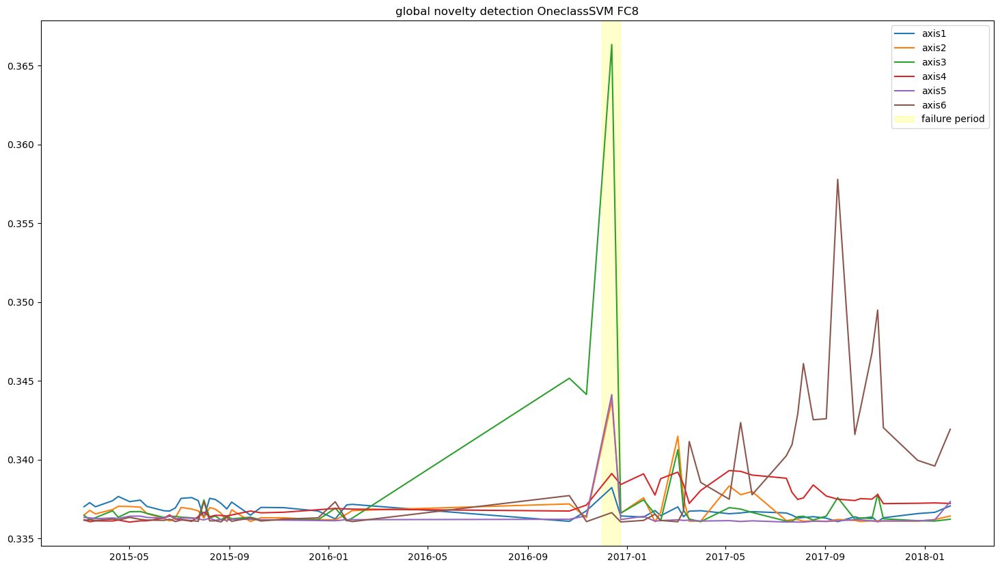

In [160]:
data1 = feature_axis1_FC8
data2 = feature_axis2_FC8
data3 = feature_axis3_FC8
data4 = feature_axis4_FC8
data5 = feature_axis5_FC8
data6 = feature_axis6_FC8
frames_FC8 = [data1, data2, data3, data4, data5, data6]
OneclassSVM_global_FC8,score_FC8  = OneclassSVM(frames_FC8,10,'global novelty detection OneclassSVM FC8',line_FC8)
score_FC8_svm = np.mean(1/score_FC8)+3*np.std(1/score_FC8)
metrics_MA(OneclassSVM_global_FC8,'axis3',line_FC8,'OC-SVM',feature_axis1_FC8,0.7*score_FC8_svm,10)
metrics_LR(OneclassSVM_global_FC8,'axis3',line_FC8,'OC-SVM',feature_axis1_FC8,3/score_FC8,10)

In [158]:
score_FC8_svm

0.3389322436536607

# Autoencoder

In [ ]:
data1 = feature_axis1_FC8
data2 = feature_axis2_FC8
data3 = feature_axis3_FC8
data4 = feature_axis4_FC8
data5 = feature_axis5_FC8
data6 = feature_axis6_FC8
frames = [data1, data2, data3, data4, data5, data6]
Autoencoder_FC8 = autoencoder(frames,'Autoencoder FC8',10,line_FC8)

In [ ]:

fig, ax = plt.subplots(1, figsize=(10,10))

Indicators_FC8 = {'Centroid':Distance_FC8_Global, 'DB_LOF': Distance_based_lof_global_FC8, 'C_LOF':classic_LOF_global_FC8, 'O_SVM':OneclassSVM_global_FC8,'Autoencoder':Autoencoder_FC8}
TPR_dict_FC8_MA = {}
FPR_dict_FC8_MA = {}
Precision_dict_FC8_MA = {}
for n, (fc, indicator) in enumerate(Indicators_FC8.items()):
    TPR_dict_FC8_MA[fc],FPR_dict_FC8_MA[fc],Precision_dict_FC8_MA[fc] = ROC_Curve_Average(indicator,'axis3',line_FC8,fc,feature_axis1_FC8)
    
ax.set_xlim(-0.1,1.1)
ax.set_ylim(-0.1,1.1)
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.legend()

In [ ]:
ind = ['Centroid','DB_LOF', 'C_LOF', 'O_SVM','Autoencoder']
for i in ind:
    plt.plot(FPR_dict_FC8_MA[i],TPR_dict_FC8_MA[i],label = i)

In [ ]:
TPR_dict_FC8_LR = {}
FPR_dict_FC8_LR = {}
Precision_dict_FC8_LR = {}

for n, (fc, indicator) in enumerate(Indicators_FC8.items()):
    TPR_dict_FC8_LR[fc],FPR_dict_FC8_LR[fc],Precision_dict_FC8_LR[fc] = ROC_Curve_LR(indicator,'axis3',line_FC8,fc,feature_axis1_FC8)
    

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()

In [ ]:
Aver_tpr_MA = {}
Aver_fpr_MA = {}
Aver_Precision_MA = {}
for key in TPR_dict_FC8_LR:
    fpr_MA = np.array([FPR_dict_FC2_MA[key], FPR_dict_FC10_MA[key],  FPR_dict_FC6_MA[key], FPR_dict_FC7_MA[key], FPR_dict_FC8_MA[key]])
    tpr_MA = np.array([TPR_dict_FC2_MA[key], TPR_dict_FC10_MA[key],  TPR_dict_FC6_MA[key], TPR_dict_FC7_MA[key], TPR_dict_FC8_MA[key]])
    Precision_MA = np.array([Precision_dict_FC2_MA[key], Precision_dict_FC10_MA[key], Precision_dict_FC6_MA[key], Precision_dict_FC7_MA[key], Precision_dict_FC8_MA[key]])
    Aver_tpr_MA[key] = np.average(tpr_MA, axis=0)
    Aver_fpr_MA[key] = np.average(fpr_MA, axis=0)
    Aver_Precision_MA[key] = np.average(Precision_MA, axis=0)

In [ ]:
Precision_dict_FC6_MA['Centroid']

In [ ]:
F1_score_MA_FC2 = {}
F1_score_MA_FC10 = {}
# F1_score_MA_FC1 = {}
F1_score_MA_FC6 = {}
F1_score_MA_FC7 = {}
F1_score_MA_FC8 = {}

for k in FPR_dict_FC10_MA:

    F1_score_MA_FC2[k] = max(F1_score(Precision_dict_FC2_MA[k],TPR_dict_FC2_MA[k]))
    F1_score_MA_FC10[k] = max(F1_score(Precision_dict_FC10_MA[k],TPR_dict_FC10_MA[k]))
#     F1_score_MA_FC1[k] = max(F1_score(Precision_dict_FC1_MA[k],TPR_dict_FC1_MA[k]))
    F1_score_MA_FC6[k] = max(F1_score(Precision_dict_FC6_MA[k],TPR_dict_FC6_MA[k]))
    F1_score_MA_FC7[k] = max(F1_score(Precision_dict_FC7_MA[k],TPR_dict_FC7_MA[k]))
    F1_score_MA_FC8[k] = max(F1_score(Precision_dict_FC8_MA[k],TPR_dict_FC8_MA[k]))

In [ ]:
AUC_MA = {}
for key in Aver_fpr_MA:
    plt.plot(Aver_fpr_MA[key],Aver_tpr_MA[key], label = key, linewidth=1)
    x = Aver_fpr_MA[key]
    y = Aver_tpr_MA[key]
    z = Aver_Precision_MA[key]
    sorted_x, sorted_y = zip(*sorted(zip(x, y)))
    AUC_MA[key] = np.trapz(sorted_y, sorted_x)
    print(f"AUC of {key} in moving average is {AUC_MA[key]}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title('ROC Curve')
plt.legend() 

In [ ]:
F1_score_MA = {}
for k in FPR_dict_FC10_MA:
    F1_score_MA[k] = max(F1_score(Aver_Precision_MA[k],Aver_tpr_MA[k]))
    print(f"The avarage F1 score of {k} in moving average is {F1_score_MA[k]}")

In [ ]:
Aver_tpr_LR = {}
Aver_fpr_LR = {}
Aver_Precision_LR = {}
for key in TPR_dict_FC8_LR:
    fpr_LR = np.array([FPR_dict_FC2_LR[key], FPR_dict_FC10_LR[key], FPR_dict_FC6_LR[key], FPR_dict_FC7_LR[key], FPR_dict_FC8_LR[key]])
    tpr_LR = np.array([TPR_dict_FC2_LR[key], TPR_dict_FC10_LR[key], TPR_dict_FC6_LR[key], TPR_dict_FC7_LR[key], TPR_dict_FC8_LR[key]])
    Precision_LR = np.array([Precision_dict_FC2_LR[key], Precision_dict_FC10_LR[key], Precision_dict_FC6_LR[key], Precision_dict_FC7_LR[key], Precision_dict_FC8_LR[key]])
    Aver_tpr_LR[key] = np.average(tpr_LR, axis=0)
    Aver_fpr_LR[key] = np.average(fpr_LR, axis=0)
    Aver_Precision_LR[key] = np.average(Precision_LR, axis=0)



In [ ]:
AUC_LR = {}
for key in Aver_tpr_LR:
    plt.plot(Aver_fpr_LR[key],Aver_tpr_LR[key], label = key)
    x = Aver_fpr_LR[key]
    y = Aver_tpr_LR[key]
    sorted_x, sorted_y = zip(*sorted(zip(x, y)))
    AUC_LR[key] = np.trapz(sorted_y, sorted_x)
    print(f"AUC of {key} in linear regresssion is {AUC_LR[key]}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend() 

In [ ]:
F1_score_LR = {}
for k in FPR_dict_FC10_LR:
    F1_score_LR[k] = max(F1_score(Aver_Precision_LR[k],Aver_tpr_LR[k]))
    print(f"The avarage F1 score of {k} in linear regresssion is {F1_score_LR[k]}")

In [ ]:
AUC_MA

In [162]:
feature_axis1_FC11 = pd.concat([RMS_Value_FC11['axis1'],Stv_FC11['axis1'],torque_areaUnderSignal_FC11['axis1']],axis=1)
feature_axis1_FC11.columns = ['RMS','Stv','areaUnderSignal']

feature_axis1_FC12 = pd.concat([RMS_Value_FC12['axis1'],Stv_FC12['axis1'],torque_areaUnderSignal_FC12['axis1']],axis=1)
feature_axis1_FC12.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC11 = pd.concat([RMS_Value_FC11['axis2'],Stv_FC11['axis2'],torque_areaUnderSignal_FC11['axis2']],axis=1)
feature_axis2_FC11.columns = ['RMS','Stv','areaUnderSignal']

feature_axis2_FC12 = pd.concat([RMS_Value_FC12['axis2'],Stv_FC12['axis2'],torque_areaUnderSignal_FC12['axis2']],axis=1)
feature_axis2_FC12.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC11 = pd.concat([RMS_Value_FC11['axis3'],Stv_FC11['axis3'],torque_areaUnderSignal_FC11['axis3']],axis=1)
feature_axis3_FC11.columns = ['RMS','Stv','areaUnderSignal']

feature_axis3_FC12 = pd.concat([RMS_Value_FC12['axis3'],Stv_FC12['axis3'],torque_areaUnderSignal_FC12['axis3']],axis=1)
feature_axis3_FC12.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC11 = pd.concat([RMS_Value_FC11['axis4'],Stv_FC11['axis4'],torque_areaUnderSignal_FC11['axis4']],axis=1)
feature_axis4_FC11.columns = ['RMS','Stv','areaUnderSignal']

feature_axis4_FC12 = pd.concat([RMS_Value_FC12['axis4'],Stv_FC12['axis4'],torque_areaUnderSignal_FC12['axis4']],axis=1)
feature_axis4_FC12.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC11 = pd.concat([RMS_Value_FC11['axis5'],Stv_FC11['axis5'],torque_areaUnderSignal_FC11['axis5']],axis=1)
feature_axis5_FC11.columns = ['RMS','Stv','areaUnderSignal']

feature_axis5_FC12 = pd.concat([RMS_Value_FC12['axis6'],Stv_FC12['axis5'],torque_areaUnderSignal_FC12['axis5']],axis=1)
feature_axis5_FC12.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC11 = pd.concat([RMS_Value_FC11['axis6'],Stv_FC11['axis6'],torque_areaUnderSignal_FC11['axis6']],axis=1)
feature_axis6_FC11.columns = ['RMS','Stv','areaUnderSignal']

feature_axis6_FC12 = pd.concat([RMS_Value_FC12['axis6'],Stv_FC12['axis6'],torque_areaUnderSignal_FC12['axis6']],axis=1)
feature_axis6_FC12.columns = ['RMS','Stv','areaUnderSignal']


In [ ]:
line_FC11 = [[date(2017, 11, 26),date(2017, 12, 3)],
             [date(2017, 12, 3),date(2017, 12, 6)]]

line_FC12 = [[date(2017, 12, 17),date(2017, 12, 22)],
            [date(2017,4,22), date(2017,4,27)]]

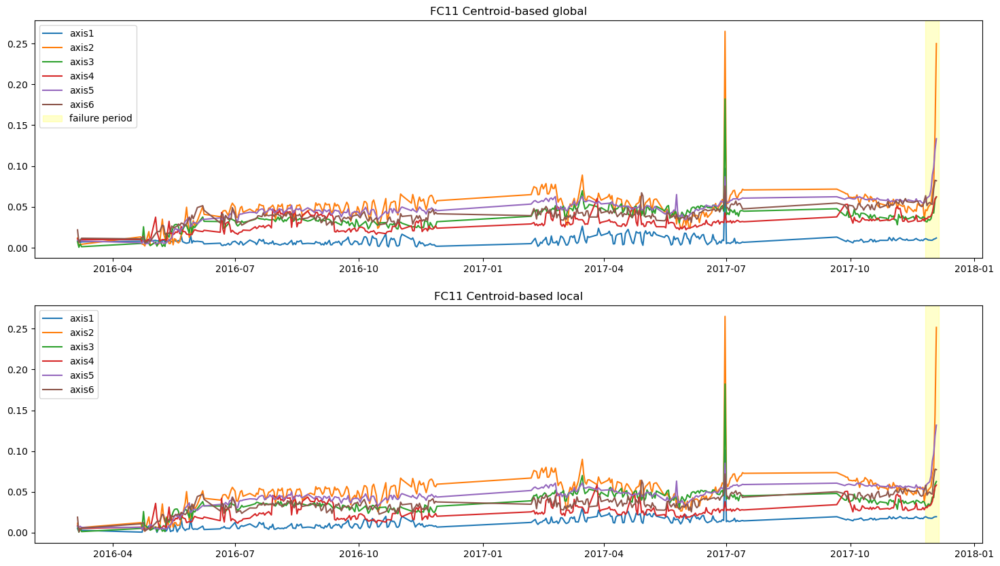

In [163]:
data1 = feature_axis1_FC11
data2 = feature_axis2_FC11
data3 = feature_axis3_FC11
data4 = feature_axis4_FC11
data5 = feature_axis5_FC11
data6 = feature_axis6_FC11
frames_FC11 = [data1, data2, data3, data4, data5, data6]

fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_FC11_Global = plot_distance_global(frames_FC11,10,'FC11 Centroid-based global',ax1,line_FC11)

Distance_FC11_local = plot_distance_local(frames_FC11,10, 'FC11 Centroid-based local',ax2,line_FC11)

In [161]:
data1 = feature_axis1_FC12
data2 = feature_axis2_FC12
data3 = feature_axis3_FC12
data4 = feature_axis4_FC12
data5 = feature_axis5_FC12
data6 = feature_axis6_FC12
frames_FC12 = [data1, data2, data3, data4, data5, data6]

fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_FC12_Global = plot_distance_global(frames_FC12,10,'FC12 Centroid-based global',ax1, line_FC12)

Distance_FC12_local = plot_distance_local(frames_FC12,10, 'FC12 Centroid-based local',ax2, line_FC12)

NameError: name 'feature_axis1_FC12' is not defined

In [ ]:
data1 = feature_axis1_FC11
data2 = feature_axis2_FC11
data3 = feature_axis3_FC11
data4 = feature_axis4_FC11
data5 = feature_axis5_FC11
data6 = feature_axis6_FC11
frames_FC11 = [data1, data2, data3, data4, data5, data6]
fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_based_lof_global_F11 = Distance_based_lof_global(frames_FC11,10,'global distance_based LOF FC11',ax1,line_FC11)

In [ ]:
data1 = feature_axis1_FC12
data2 = feature_axis2_FC12
data3 = feature_axis3_FC12
data4 = feature_axis4_FC12
data5 = feature_axis5_FC12
data6 = feature_axis6_FC12
frames_FC12 = [data1, data2, data3, data4, data5, data6]
classic_LOF_global_FC12 = classic_LOF(frames_FC12,10,'global novelty detection LOF FC12',line_FC12)

In [ ]:
data1 = feature_axis1_FC12
data2 = feature_axis2_FC12
data3 = feature_axis3_FC12
data4 = feature_axis4_FC12
data5 = feature_axis5_FC12
data6 = feature_axis6_FC12
frames_FC12 = [data1, data2, data3, data4, data5, data6]
fig, (ax1, ax2) = plt.subplots(2,figsize=(18,10))
Distance_based_lof_global(frames_FC12,10,'global distance_based LOF FC12',ax1,line_FC12)
Distance_based_lof_local(frames_FC12,10,'local distance_based LOF FC12',ax2,line_FC12)